In [1]:
!pip install hdbscan

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 30.4 MB/s eta 0:00:00
  Attempting uninstall: cython
    Found existing installation: Cython 3.0.10
    Uninstalling Cython-3.0.10:
      Successfully uninstalled Cython-3.0.10


# Import packages

In [1]:
import pandas as pd
import numpy as np
import nltk
import gensim
import re
import random
import unicodedata
import matplotlib.pyplot as plt

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,roc_curve,auc,classification_report
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from gensim import corpora
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary
from hdbscan import HDBSCAN
from itertools import cycle


In [2]:
import torch
from transformers import RobertaModel
from transformers import BertTokenizer
from gensim.models import KeyedVectors


OSError: [WinError 126] Kan opgegeven module niet vinden. Error loading "C:\Users\SaidKalee\anaconda3\Lib\site-packages\torch\lib\shm.dll" or one of its dependencies.

In [3]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\SaidKalee\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SaidKalee\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\SaidKalee\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## Importing the data

In [4]:
#importing all the data
df_KVK2022 = pd.read_excel('data/preprocessedKVK2022TEST.xlsx') #preprocesed data 2022
df_KVK2023 = pd.read_excel('data/preprocessedKVK2023TEST.xlsx') #preprocessed data 2023
df_labelled = pd.read_excel('data/preprocessedlabelled.xlsx') #preprocessed labelled data
df_KVKfinal2022=pd.read_excel('data/preprocessedKVK2022.xlsx')#final data used
df_KVKfinal2023=pd.read_excel('data/preprocessedKVK2023.xlsx')#final data used

In [5]:
df_KVK2022

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88
0,scouting ernst kempengroep,0,scouting ernst kempengroep,scoutingvereniging,2011,1,24,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,...,0,1,0,0,0,0,0,0,0,0
2,cvve winkelcentr gagel ua,0,cooperatieve vereniging eige,behartigen gemeenschappelijke belangen leden,2013,11,29,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,cooperatie nieuwe energie ua,0,cooperatie nieuwe energie ua,voorzien stoffelijke behoeften leden investere...,2020,1,28,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,verbindingskamer,1,verbindingskamer,adviesburo gebied welzijn sociaal maatschappel...,2022,1,12,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,mari coaching,1,mari coaching,coaching relatie coaching echtscheidingsmediation,2016,8,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
346,bv baekerhoes,2,bv baekerhoes,beheer exploitatie gemeenschaps huis baekerhoe...,2005,4,28,0,0,0,...,1,0,0,0,0,0,0,0,0,0
347,lukt beheer bv,0,lukt beheer bv,beheren stamrechtgelden alsmede financiele die...,2011,3,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
348,stichting valere bewind,0,stichting valere bewind,bewindvoering inkomensbeheer,2013,11,14,0,0,0,...,0,0,0,1,0,0,0,0,0,0


## Creating a dataset for each text representation that will be created

In [6]:
df_labelledword2vec=df_labelled.copy()
df_word2vec22=df_KVK2022.copy()
df_word2vec23=df_KVK2023.copy()

df_labelledBERT=df_labelled.copy()
df_labelledBERT22=df_KVK2022.copy()
df_labelledBERT23=df_KVK2023.copy()

df_labelled_tfidf=df_labelled.copy()
df_labelled_tfidf22=df_KVK2022.copy()
df_labelled_tfidf23=df_KVK2023.copy()

df_labelledBERTtopic=df_labelled.copy()
df_labelledBERTtopic22=df_KVK2022.copy()
df_labelledBERTtopic23=df_KVK2023.copy()

df_labelledlda=df_labelled.copy()

df_lda2023=df_KVK2023.copy()
df_lda2022=df_KVK2022.copy()

# Test data exploration

In [ ]:
df_KVK2023["SBI_overig"].value_counts()

SBI_overig
0    350
Name: count, dtype: int64

In [ ]:
df_KVK2023["PROV_X"].value_counts()

PROV_X
0    346
1      4
Name: count, dtype: int64

In [ ]:
df_KVK2023["rechtsvorm_74"].value_counts()

rechtsvorm_74
0    273
1     77
Name: count, dtype: int64

In [ ]:
rows_with_1 = df_KVK2023[df_KVK2023["PROV_X"] == 1]

In [ ]:
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']

#tokenize each text entry in the 'combined_text' column
df_labelled['combined_text'] = df_labelled[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)
token_counts = [len(word_tokenize(text)) for text in df_labelled['combined_text']]

#find the maximum token count
max_tokens = max(token_counts)

#find the average token count
average_tokens = sum(token_counts) / len(token_counts)

print("Maximum tokens found in 'combined_text':", max_tokens)
print("Average tokens found in 'combined_text':", average_tokens)

Maximum tokens found in 'combined_text': 105
Average tokens found in 'combined_text': 17.755605381165918


In [ ]:
df_KVKfinal2023['combined_text'] = df_KVKfinal2023[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)

#tokenize each text entry in the 'combined_text' column
token_counts = [len(word_tokenize(text)) for text in df_KVKfinal2023['combined_text']]

#find the maximum token count
max_tokens = max(token_counts)

#find the average token count
average_tokens = sum(token_counts) / len(token_counts)

print("Maximum tokens found in 'df_KVKfinal2023':", max_tokens)
print("Average tokens found in 'df_KVKfinal2023':", average_tokens)

Maximum tokens found in 'df_KVKfinal2023': 130
Average tokens found in 'df_KVKfinal2023': 15.881354401805869


In [ ]:
df_KVKfinal2022['combined_text'] = df_KVKfinal2022[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)

#tokenize each text entry in the 'combined_text' column
token_counts = [len(word_tokenize(text)) for text in df_KVKfinal2022['combined_text']]

#find the maximum token count
max_tokens = max(token_counts)

#find the average token count
average_tokens = sum(token_counts) / len(token_counts)

print("Maximum tokens found in 'df_KVKfinal2022':", max_tokens)
print("Average tokens found in 'df_KVKfinal2022':", average_tokens)

Maximum tokens found in 'df_KVKfinal2022': 128
Average tokens found in 'df_KVKfinal2022': 14.556596409055425


# BOW classification

In [52]:
#combining all textual data into 1 column
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
#replace NaN values with empty strings
df_labelled[text_columns] = df_labelled[text_columns].fillna('')
#combine all text columns into one
df_labelled['combined_text'] = df_labelled[text_columns].apply(lambda row: ' '.join(row), axis=1)


In [53]:
#initialize CountVectorizer
vectorizer = CountVectorizer(ngram_range=(1,2))
#fit and transform the combined text column into bow
bow = vectorizer.fit_transform(df_labelled['combined_text'])

#get feature names
feature_names = vectorizer.get_feature_names_out()

#create df from BoW matrix
bow_df = pd.DataFrame(bow.toarray(), columns=feature_names)


In [54]:
bow_df = pd.concat([df_labelled, bow_df], axis=1)
bow_df

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,...,zullen,zullen gaan,zullen instelling,zwaan,zwaan cultureel,zwaan exploitatie,zwarte,zwarte migranten,zwinderen,zwinderen ua
0,maatschap beheer mfc tiendeveen,0,maatschap beheer mfc tiendeveen,beheren multifunctioneel centrum tiendeveen,2013,3,14,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,aktiviteitencentrum alletahof,0,aktiviteitencentrum alletahof,buurt clubhuiswerk samenlevingsopbouwwerk,2011,2,16,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,cooperatie stationspark deurne ua,0,cooperatie stationspark deurne,kwaliteit woon werk leefomgeving gebied rondom...,2014,12,23,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,cooperatie sustar ua,0,cooperatie sustar ua,bieden ondersteuning organisaties ontwerp real...,2022,7,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,jasmijnsteede centraal wonen ouderen,0,jasmijnsteede centraal wonen vo,groepswonen ouderen,2011,4,20,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,verenig groepsw oud ouderlandshoek,0,vereniging groepswonen ouder,bejaardenverenigingen,1990,3,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
442,bewonersvereniging centraal wonen banier,0,bewonersvereniging centraal wone,verhuur onroerend goed,1979,10,26,0,0,0,...,0,0,0,0,0,0,0,0,0,0
443,stichting dorpsraad venzelderheide,5,stichting dorpsraad venzelderhe,belangenverenigingen bezighouden meente activi...,1981,6,26,0,0,0,...,0,0,0,0,0,0,0,0,0,0
444,stichting wijkraad lovenbesterd,0,stichting wijkraad lovenbesterd,buurthuiswerk samenlevingsopbouwwerk,1988,7,4,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Create dataframes for 2022 and 2023

In [55]:
#replace NaN values with empty strings
df_KVK2022[text_columns] = df_KVK2022[text_columns].fillna('')

#combine all text columns into one
df_KVK2022['combined_text'] = df_KVK2022[text_columns].apply(lambda row: ' '.join(row), axis=1)

#initialize CountVectorizer
vectorizer = CountVectorizer(ngram_range=(1, 2))

#fit and transform the combined text column into bow
bow2022 = vectorizer.fit_transform(df_KVK2022['combined_text'])

#get feature names
feature_names = vectorizer.get_feature_names_out()

#create df from BoW matrix
bow_df2022 = pd.DataFrame(bow2022.toarray(), columns=feature_names)

bow_df2022 = pd.concat([df_KVK2022, bow_df2022], axis=1)
bow_df2022

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,zullen,zullen plaatsvinden,zusterorganisaties,zusterorganisaties casus,zuyderhoudt,zuyderhoudt valkenburg,zwakkeren,zwakkeren zuidkland,zwembad,zwembad kolck
0,scouting ernst kempengroep,0,scouting ernst kempengroep,scoutingvereniging,2011,1,24,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,cvve winkelcentr gagel ua,0,cooperatieve vereniging eige,behartigen gemeenschappelijke belangen leden,2013,11,29,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,cooperatie nieuwe energie ua,0,cooperatie nieuwe energie ua,voorzien stoffelijke behoeften leden investere...,2020,1,28,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,verbindingskamer,1,verbindingskamer,adviesburo gebied welzijn sociaal maatschappel...,2022,1,12,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,mari coaching,1,mari coaching,coaching relatie coaching echtscheidingsmediation,2016,8,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
346,bv baekerhoes,2,bv baekerhoes,beheer exploitatie gemeenschaps huis baekerhoe...,2005,4,28,0,0,0,...,0,0,0,0,0,0,0,0,0,0
347,lukt beheer bv,0,lukt beheer bv,beheren stamrechtgelden alsmede financiele die...,2011,3,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
348,stichting valere bewind,0,stichting valere bewind,bewindvoering inkomensbeheer,2013,11,14,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [56]:
df_KVK2023[text_columns] = df_KVK2023[text_columns].fillna('')

#combine all text columns into one
df_KVK2023['combined_text'] = df_KVK2023[text_columns].apply(lambda row: ' '.join(row), axis=1)

#initialize CountVectorizer
vectorizer = CountVectorizer(ngram_range=(1, 2))

#fit and transform the combined text column into bow
bow2023 = vectorizer.fit_transform(df_KVK2023['combined_text'])

#get feature names
feature_names = vectorizer.get_feature_names_out()

#create df from BoW matrix
bow_df2023 = pd.DataFrame(bow2023.toarray(), columns=feature_names)
bow_df2023 = pd.concat([df_KVK2023, bow_df2023], axis=1)
bow_df2023

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,zuidwest utrecht,zuilen,zuilen sociaalcultureel,zuilen stichting,zwangerschap,zwiep,zwiep kookatelier,zwiep verzorgen,zzp,zzp verpleegkundige
0,regenboog gespecial residentiele zorg,1,regenboog gespecialiseerde residentiele zorg,geven ondersteunende begeleiding thuissituatie...,2008,10,16,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,dorpscentrum d ouw school,0,dorpscentrum d ouw school,lokaalruimte alle plaatselijke verenigingen ma...,2010,8,3,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,rk zorg begeleiding,1,rk zorg begeleiding,jeugdzorg alsmede ondersteunen begeleiden geha...,2018,7,18,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,cannock chase public,85,cannock chase public,aanbieden diensten overheden gericht handhavin...,1987,3,26,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,societeit tyche,0,societeit tyche,studentenvereniging,2011,5,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,stichting streekcentrum scheerwolde,0,stichting streekcentrum scheerwolde,oprichten instandhouden exploiteren gebouw sch...,1966,3,4,1,0,0,...,0,0,0,0,0,0,0,0,0,0
346,cultuur campus,0,cultuur campus,bevorderen ban levendig cultureel klimaat acti...,2011,3,16,0,0,0,...,0,0,0,0,0,0,0,0,0,0
347,enjoy dagbesteding zorg,2,enjoy dagbesteding zorg,aanbieden dagbesteding zorgbesteding,2019,9,16,0,0,0,...,0,0,0,0,0,0,0,0,0,0
348,ontmoetingscentrum viskenij,0,ontmoetingscentrum viskenij,ontmoetingscentrum verenigingen jeugdsoos,2011,8,4,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [57]:
text_columns_drop = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving', 'combined_text']

bow_df.drop(columns=text_columns_drop, inplace=True)
bow_df2022.drop(columns=text_columns_drop, inplace=True)
bow_df2023.drop(columns=text_columns_drop, inplace=True)


## Ensure that all bow dataframes are the same

In [63]:
#identify all unique columns across the three DataFrames
all_columns = set(bow_df.columns).union(set(bow_df2022.columns)).union(set(bow_df2023.columns))

#add missing columns to each dataFrame with 0 values
for col in all_columns:
    if col not in bow_df.columns:
        bow_df[col] = 0
    if col not in bow_df2022.columns:
        bow_df2022[col] = 0
    if col not in bow_df2023.columns:
        bow_df2023[col] = 0

#ensure all dataframes have the columns in the same order
bow_df = bow_df[sorted(all_columns)]
bow_df2022 = bow_df2022[sorted(all_columns)]
bow_df2023 = bow_df2023[sorted(all_columns)]

## Start classification and tuning

In [59]:
X_bow = bow_df.drop(columns=['label'])  #features
y_bow = bow_df['label']  #label

#split the data into training and test sets
X_train_bow, X_test_bow, y_train_bow, y_test_bow = train_test_split(X_bow, y_bow, test_size=0.25, random_state=42)

In [60]:
rf_classifier_bow = RandomForestClassifier(n_estimators=25, random_state=42)
rf_classifier_bow.fit(X_train_bow, y_train_bow)

#predict labels for the test data
y_pred_bow = rf_classifier_bow.predict(X_test_bow)

#calculate accuracy
accuracy_rfbow = accuracy_score(y_test_bow, y_pred_bow)
print("Accuracy (Random Forest before tuning):", accuracy_rfbow)

Accuracy (Random Forest before tuning): 0.8035714285714286


In [61]:
#parameter grid
param_grid = {
    'n_estimators': [15,50, 100,150],
    'max_depth': [20, 30,40,50,60],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4,5],
}

#create a classifier
rf_classifier_bow = RandomForestClassifier(random_state=42)

#create a GridSearchCV object with 5 folds
grid_search_bow = GridSearchCV(estimator=rf_classifier_bow, param_grid=param_grid, cv=5, n_jobs=-1, verbose=3,scoring='f1')

#fit the grid search to the training data
grid_search_bow.fit(X_train_bow, y_train_bow)

#print the best parameters found
print("Best parameters found: ", grid_search_bow.best_params_)

#use the best estimator to make predictions
best_rf_classifier_bow = grid_search_bow.best_estimator_


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Best parameters found:  {'max_depth': 60, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 15}


In [64]:
#evaluate using 10-Fold Cross-Validation on the training set
cross_val_scores_bow = cross_val_score(best_rf_classifier_bow, X_train_bow, y_train_bow, cv=10)

#calculate and print the mean accuracy from cross-validation
mean_cross_val_accuracy_bow = cross_val_scores_bow.mean()
print("Mean Cross-Validation Accuracy (Random Forest after tuning):", mean_cross_val_accuracy_bow)

#predict on the test set
y_test_pred_bow = best_rf_classifier_bow.predict(X_test_bow)

#calculate accuracy on the test set
accuracy_rf_test_bow = accuracy_score(y_test_bow, y_test_pred_bow)
print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_bow)

Mean Cross-Validation Accuracy (Random Forest after tuning): 0.8385026737967914
Test Accuracy (Random Forest after tuning): 0.8214285714285714


In [65]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_bow = accuracy_score(y_test_bow, y_test_pred_bow)
precision_rf_test_bow = precision_score(y_test_bow, y_test_pred_bow)
recall_rf_test_bow = recall_score(y_test_bow, y_test_pred_bow)
f1_rf_test_bow = f1_score(y_test_bow, y_test_pred_bow)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_bow)
print("Test Precision (Random Forest after tuning):", precision_rf_test_bow)
print("Test Recall (Random Forest after tuning):", recall_rf_test_bow)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_bow)

Test Accuracy (Random Forest after tuning): 0.8214285714285714
Test Precision (Random Forest after tuning): 0.9583333333333334
Test Recall (Random Forest after tuning): 0.5476190476190477
Test F1-score (Random Forest after tuning): 0.696969696969697


In [66]:
print(classification_report(y_test_bow, y_test_pred_bow))

              precision    recall  f1-score   support

           0       0.78      0.99      0.87        70
           1       0.96      0.55      0.70        42

    accuracy                           0.82       112
   macro avg       0.87      0.77      0.79       112
weighted avg       0.85      0.82      0.81       112



## Classify the 2022 and 2023 test data

In [67]:
#split the label from the rest of the data
X_bow2022 = bow_df2022.drop(columns=['label'])  #features
y_bow2022 = bow_df2022['label']  #label

y_test_pred_bow2022 = best_rf_classifier_bow.predict(X_bow2022)


In [68]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_bow2022 = accuracy_score(y_bow2022, y_test_pred_bow2022)
precision_rf_test_bow2022 = precision_score(y_bow2022, y_test_pred_bow2022)
recall_rf_test_bow2022 = recall_score(y_bow2022, y_test_pred_bow2022)
f1_rf_test_bow2022 = f1_score(y_bow2022, y_test_pred_bow2022)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_bow2022)
print("Test Precision (Random Forest after tuning):", precision_rf_test_bow2022)
print("Test Recall (Random Forest after tuning):", recall_rf_test_bow2022)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_bow2022)

Test Accuracy (Random Forest after tuning): 0.92
Test Precision (Random Forest after tuning): 0.8
Test Recall (Random Forest after tuning): 0.12903225806451613
Test F1-score (Random Forest after tuning): 0.2222222222222222


In [69]:
print(classification_report(y_bow2022, y_test_pred_bow2022))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96       319
           1       0.80      0.13      0.22        31

    accuracy                           0.92       350
   macro avg       0.86      0.56      0.59       350
weighted avg       0.91      0.92      0.89       350



In [70]:
bow_df2023= bow_df2023.fillna(0)


In [71]:
#same procedure for 2023
X_bow2023 = bow_df2023.drop(columns=['label'])  # Features
y_bow2023 = bow_df2023['label']  # Label

y_test_pred_bow2023 = best_rf_classifier_bow.predict(X_bow2023)

In [72]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_bow2023 = accuracy_score(y_bow2023, y_test_pred_bow2023)
precision_rf_test_bow2023 = precision_score(y_bow2023, y_test_pred_bow2023)
recall_rf_test_bow2023 = recall_score(y_bow2023, y_test_pred_bow2023)
f1_rf_test_bow2023 = f1_score(y_bow2023, y_test_pred_bow2023)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_bow2023)
print("Test Precision (Random Forest after tuning):", precision_rf_test_bow2023)
print("Test Recall (Random Forest after tuning):", recall_rf_test_bow2023)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_bow2023)

Test Accuracy (Random Forest after tuning): 0.9142857142857143
Test Precision (Random Forest after tuning): 0.25
Test Recall (Random Forest after tuning): 0.07692307692307693
Test F1-score (Random Forest after tuning): 0.11764705882352941


In [73]:
print(classification_report(y_bow2023, y_test_pred_bow2023))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95       324
           1       0.25      0.08      0.12        26

    accuracy                           0.91       350
   macro avg       0.59      0.53      0.54       350
weighted avg       0.88      0.91      0.89       350



## Outcome analysis

Top 20 Feature Importances:
 BOW 2022 SBI_overig                        0.028963
W_P_TOTAAL                        0.019481
SBI_88993                         0.016808
INSCHR_DAT_JAAR                   0.013822
PROV_X                            0.012792
gemeenschapshuizen                0.011649
buurt                             0.011411
exploitatie gemeenschapshuizen    0.011191
rechtsvorm_1                      0.010292
buurtcentrum                      0.010165
activiteitencentrum               0.009062
SBI_94997                         0.007766
voorzieningen                     0.006662
SBI_88992                         0.006412
INSCHR_DAT_DAG                    0.006388
INSCHR_DAT_MAAND                  0.005678
dorp                              0.005487
aanbieden                         0.005123
ouderencentrum                    0.004908
clubhuiswerk                      0.004718
dtype: float64


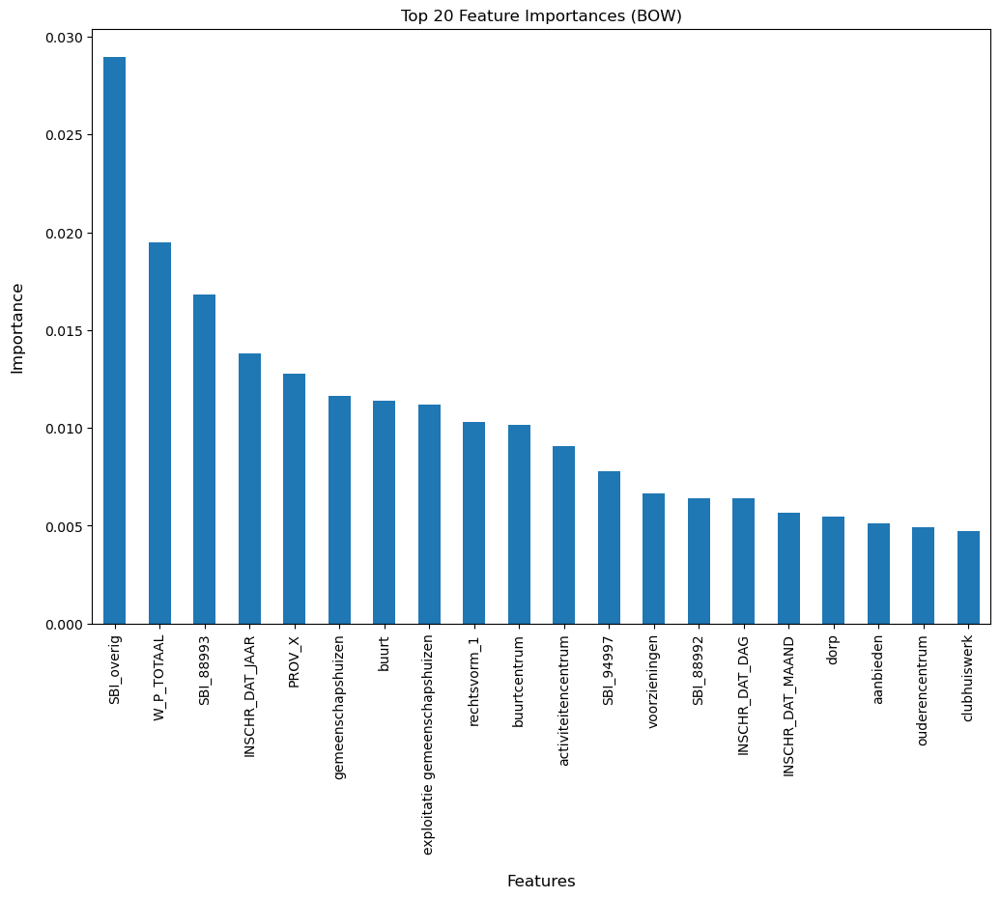

In [ ]:
#get feature importances
feature_importances22BOW = best_rf_classifier_bow.feature_importances_

#convert to a pandas series for plotting purposes
features = X_bow2022.columns if hasattr(X_bow2022, 'columns') else np.arange(len(feature_importances22BOW))
importance_series22BOW = pd.Series(feature_importances22BOW, index=features)

#sort the importances in descending order
importance_series_sorted22BOW = importance_series22BOW.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features = importance_series_sorted22BOW.head(N)

#print the top 20 feature importances
print("Top 20 Feature Importances:\n BOW 2022" , top_n_features)

#plot the feature importances
plt.figure(figsize=(12, 8))

top_n_features.plot(kind='bar')
plt.title('Top 20 Feature Importances (BOW)')
plt.xlabel('Features',fontsize=12,labelpad=15)
plt.ylabel('Importance',fontsize=12,labelpad=15)
plt.show()

Top N Feature Importances:
 BOW 2023 SBI_overig                        0.028963
W_P_TOTAAL                        0.019481
SBI_88993                         0.016808
INSCHR_DAT_JAAR                   0.013822
PROV_X                            0.012792
gemeenschapshuizen                0.011649
buurt                             0.011411
exploitatie gemeenschapshuizen    0.011191
rechtsvorm_1                      0.010292
buurtcentrum                      0.010165
activiteitencentrum               0.009062
SBI_94997                         0.007766
voorzieningen                     0.006662
SBI_88992                         0.006412
INSCHR_DAT_DAG                    0.006388
INSCHR_DAT_MAAND                  0.005678
dorp                              0.005487
aanbieden                         0.005123
ouderencentrum                    0.004908
clubhuiswerk                      0.004718
dtype: float64


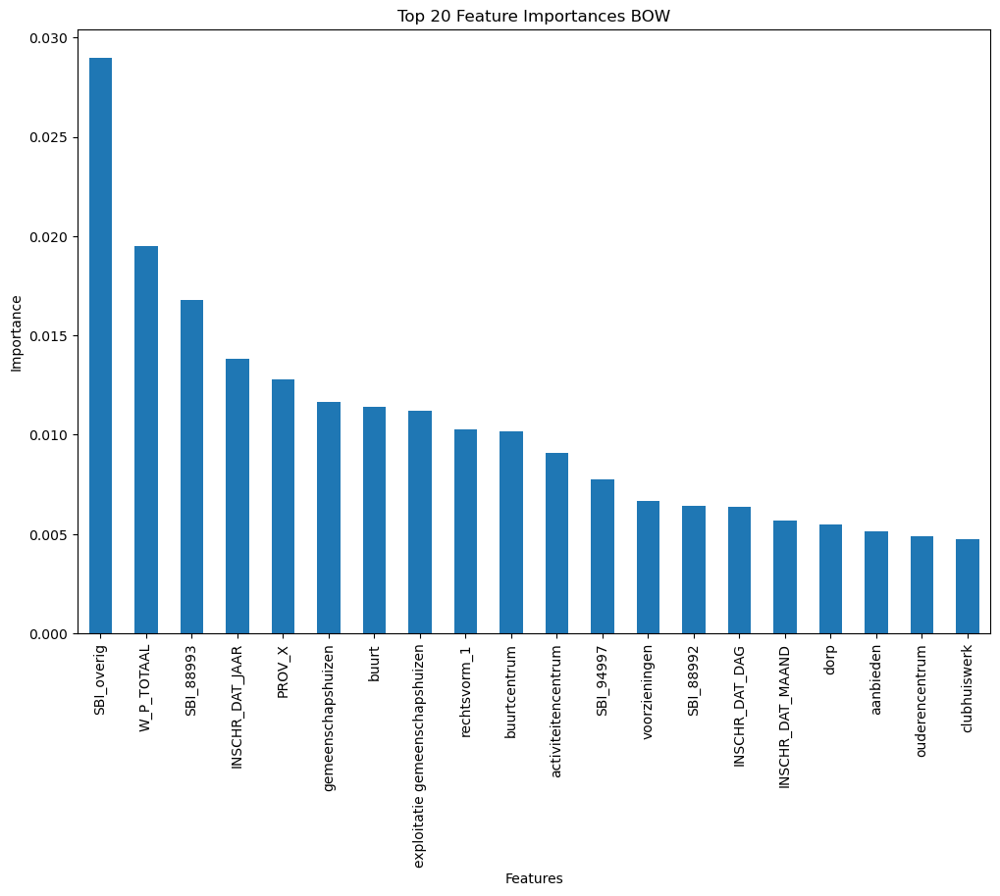

In [ ]:
#get feature importances
feature_importances23BOW = best_rf_classifier_bow.feature_importances_

#convert to a pandas series for plotting purposes
features23 = X_bow2023.columns if hasattr(X_bow2023, 'columns') else np.arange(len(feature_importances23BOW))
importance_series23BOW = pd.Series(feature_importances23BOW, index=features23)

#sort the importances in descending order
importance_series_sorted23BOW = importance_series23BOW.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features23 = importance_series_sorted23BOW.head(N)

#print the top 20 feature importances
print("Top N Feature Importances:\n BOW 2023" , top_n_features)

#plot the top 20 feature importances
plt.figure(figsize=(12, 8))
top_n_features23.plot(kind='bar')
plt.title('Top 20 Feature Importances BOW')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

## Print Mistakes

In [ ]:
#2022 data
y_true = y_bow2022
y_pred = y_test_pred_bow2022

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negatives = np.where((y_true == 1) & (y_pred == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negatives)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakes = X_bow2022.iloc[false_negatives]
y_true_mistakes = y_true.iloc[false_negatives]
y_pred_mistakes = y_pred[false_negatives]

mistake_indices=X_test_mistakes.index

Number of false negatives (mistakes on class 1): 27


In [ ]:
df_mistakes = df_KVK2022.loc[mistake_indices]


In [ ]:
#2023 data
y_true = y_bow2023
y_pred = y_test_pred_bow2023



#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negatives = np.where((y_true == 1) & (y_pred == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negatives)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakes = X_bow2023.iloc[false_negatives]
y_true_mistakes = y_true.iloc[false_negatives]
y_pred_mistakes = y_pred[false_negatives]

mistake_indices23=X_test_mistakes.index
df_mistakes23 = df_KVK2023.loc[mistake_indices23]
df_mistakes23

Number of false negatives (mistakes on class 1): 24


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
12,dienstencentrum senioren lemmer,0,dienstencentrum senioren lemmer,welzijnswerk ontmoetingscentrum ouderen,2010,11,9,1,1,0,...,0,0,1,0,0,0,0,0,0,dienstencentrum senioren lemmer dienstencentru...
20,mandala,0,mandala,sociaalcultureelwerk,2011,4,26,1,0,0,...,0,0,1,0,0,0,0,0,0,mandala mandala sociaalcultureelwerk
47,cultureel welzijnscentrum chinese brug,0,cultureel welzijnscentrum chinese brug,sociaalculturele educatieve maatschappelijke a...,2013,10,4,1,0,0,...,0,0,1,0,0,0,0,0,0,cultureel welzijnscentrum chinese brug culture...
76,ontmoetingsruimte kbo t klepke,0,ontmoetingsruimte kbo t klepke,ouderenwerk,2011,4,12,1,0,0,...,0,1,0,0,0,0,0,0,0,ontmoetingsruimte kbo t klepke ontmoetingsruim...
97,stichting cultuurhuys kroon,0,stichting cultuurhuys kroon,beheren exploiteren sociaal cultureel centrum,2015,1,23,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting cultuurhuys kroon stichting cultuurh...
110,goede herder zaal,0,goede herder zaal,ontmoetingsruimte gericht ouderenbeleid parochie,2010,8,3,1,1,0,...,0,0,1,0,0,0,0,0,0,goede herder zaal goede herder zaal ontmoeting...
145,dorpshuis poort bv,6,dorpshuis poort bv,exploitatie een meerdere verenigingsgebouwen d...,2014,7,9,1,0,0,...,0,0,0,0,0,0,0,0,0,dorpshuis poort bv dorpshuis poort bv exploita...
168,wijkcentrum schieringen,0,wijkcentrum schieringen,wijkcentrum afhaalpunt post nl,2011,5,3,1,0,0,...,0,0,1,0,0,0,0,0,0,wijkcentrum schieringen wijkcentrum schieringe...
183,verenigingsgebouw koels,0,verenigingsgebouw koels,exploitatie verenigingsgebouw exploitatie hore...,2014,4,12,1,0,0,...,0,0,0,1,0,0,0,0,0,verenigingsgebouw koels verenigingsgebouw koel...
187,kleine loef,0,kleine loef,exploitatie gemeenschapshuis,2011,3,15,1,0,0,...,0,0,1,0,0,0,0,0,0,kleine loef kleine loef exploitatie gemeenscha...


# TF-IDF

In [74]:
#combining all textual data into 1 column
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
#replace NaN values with empty strings
df_labelled_tfidf[text_columns] = df_labelled_tfidf[text_columns].fillna('')
#combine all text columns into one
df_labelled_tfidf['combined_text'] = df_labelled_tfidf[text_columns].apply(lambda row: ' '.join(row), axis=1)



In [75]:
#initialize the TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()

#fit and transform the combined_text column
tfidf_matrix = tfidf_vectorizer.fit_transform(df_labelled_tfidf['combined_text'])

In [76]:
#get feature names
feature_names = tfidf_vectorizer.get_feature_names_out()
#create df from tfidf matrix
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)
#combine tfidf dataframe with the rest of the dataframe
tfidf_df = pd.concat([df_labelled, tfidf_df], axis=1)

### Create dataframe for tf-idf for the 2022 dataset

In [77]:
#combining all textual data into 1 column
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
# Replace NaN values with empty strings
df_labelled_tfidf22[text_columns] = df_labelled_tfidf22[text_columns].fillna('')
# Combine all text columns into one
df_labelled_tfidf22['combined_text'] = df_labelled_tfidf22[text_columns].apply(lambda row: ' '.join(row), axis=1)

In [78]:
#fit and transform the combined_text column
tfidf_matrix22 = tfidf_vectorizer.fit_transform(df_labelled_tfidf22['combined_text'])
#get feature names
feature_names = tfidf_vectorizer.get_feature_names_out()
#create df from tfidf matrix
tfidf_df22 = pd.DataFrame(tfidf_matrix22.toarray(), columns=feature_names)
#combine tfidf dataframe with the rest of the dataframe
tfidf_df22 = pd.concat([df_labelled_tfidf22, tfidf_df22], axis=1)

### Create dataframe with tf-idf for the 2023 dataset

In [79]:
#replace NaN values with empty strings
df_labelled_tfidf23[text_columns] = df_labelled_tfidf23[text_columns].fillna('')
#combine all text columns into one
df_labelled_tfidf23['combined_text'] = df_labelled_tfidf23[text_columns].apply(lambda row: ' '.join(row), axis=1)

In [80]:
#fit and transform the combined_text column
tfidf_matrix23 = tfidf_vectorizer.fit_transform(df_labelled_tfidf23['combined_text'])
#get feature names
feature_names = tfidf_vectorizer.get_feature_names_out()
#create df from tfidf matrix
tfidf_df23 = pd.DataFrame(tfidf_matrix23.toarray(), columns=feature_names)
#combine tfidf dataframe with the rest of the dataframe
tfidf_df23 = pd.concat([df_labelled_tfidf23, tfidf_df23], axis=1)

In [81]:
text_columns_drop_com = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving','combined_text']
tfidf_df22.drop(columns=text_columns_drop_com, inplace=True)
tfidf_df23.drop(columns=text_columns_drop_com, inplace=True)

tfidf_df.drop(columns=text_columns_drop_com, inplace=True)


## Ensure that all dataframes are the same

In [82]:
#identify all unique columns across the three dataframes
all_columns = set(tfidf_df.columns).union(set(tfidf_df22.columns)).union(set(tfidf_df23.columns))

#add missing columns to each dataframe with 0 values
for col in all_columns:
    if col not in tfidf_df.columns:
        tfidf_df[col] = 0
    if col not in tfidf_df22.columns:
        tfidf_df22[col] = 0
    if col not in tfidf_df23.columns:
        tfidf_df23[col] = 0

#esure all dataframes have the columns in the same order
tfidf_df = tfidf_df[sorted(all_columns)]
tfidf_df22 = tfidf_df22[sorted(all_columns)]
tfidf_df23 = tfidf_df23[sorted(all_columns)]

C:\Users\SaidKalee\AppData\Local\Temp\ipykernel_5088\2551854941.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tfidf_df22[col] = 0
C:\Users\SaidKalee\AppData\Local\Temp\ipykernel_5088\2551854941.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tfidf_df22[col] = 0
C:\Users\SaidKalee\AppData\Local\Temp\ipykernel_5088\2551854941.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using p

## Start classification and tuning

In [83]:
#split data into label and features
X_tf = tfidf_df.drop(columns=['label'])  #features
y_tf = tfidf_df['label']  #label

#split the data into training and test sets
X_train_tf, X_test_tf, y_train_tf, y_test_tf = train_test_split(X_tf, y_tf, test_size=0.25, random_state=42)

In [84]:
rf_classifier_tf = RandomForestClassifier(n_estimators=25, random_state=42)
rf_classifier_tf.fit(X_train_tf, y_train_tf)

#predict labels for the test data
y_pred_tf = rf_classifier_tf.predict(X_test_tf)

#calculate accuracy
accuracy_rftf = accuracy_score(y_test_tf, y_pred_tf)
print("Accuracy (Random Forest before tuning):", accuracy_rftf)

Accuracy (Random Forest before tuning): 0.8125


In [85]:
#parameter grid
param_grid = {
    'n_estimators': [50, 100,150],
    'max_depth': [40,50,70],
    'min_samples_split': [2, 5,10],
    'min_samples_leaf': [1,2,4],
}

#create a classifier
rf_classifier_tf = RandomForestClassifier(random_state=42)

#create a GridSearchCV object with 5 folds
grid_search_tf = GridSearchCV(estimator=rf_classifier_tf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring = 'f1')

#fit the grid search to the training data
grid_search_tf.fit(X_train_tf, y_train_tf)

#print the best parameters found
print("Best parameters found: ", grid_search_tf.best_params_)

#use the best estimator to make predictions
best_rf_classifier_tf = grid_search_tf.best_estimator_

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters found:  {'max_depth': 70, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


In [86]:
#evaluate using 10-Fold Cross-Validation on the training set
cross_val_scores_tf = cross_val_score(best_rf_classifier_tf, X_train_tf, y_train_tf, cv=10)

#calculate and print the mean accuracy from cross-validation
mean_cross_val_accuracy_tf = cross_val_scores_tf.mean()
print("Mean Cross-Validation Accuracy (Random Forest after tuning):", mean_cross_val_accuracy_tf)

#predict on the test set
y_pred_tf = best_rf_classifier_tf.predict(X_test_tf)

#calculate accuracy on the test set
accuracy_rf_test_tf = accuracy_score(y_test_tf, y_pred_tf)
print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf)

Mean Cross-Validation Accuracy (Random Forest after tuning): 0.8592691622103388
Test Accuracy (Random Forest after tuning): 0.8392857142857143


In [87]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_tf = accuracy_score(y_test_tf, y_pred_tf)
precision_rf_test_tf = precision_score(y_test_tf, y_pred_tf)
recall_rf_test_tf= recall_score(y_test_tf, y_pred_tf)
f1_rf_test_tf = f1_score(y_test_tf, y_pred_tf)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf)

Test Accuracy (Random Forest after tuning): 0.8392857142857143
Test Precision (Random Forest after tuning): 0.9615384615384616
Test Recall (Random Forest after tuning): 0.5952380952380952
Test F1-score (Random Forest after tuning): 0.7352941176470588


In [88]:
print(classification_report(y_test_tf, y_pred_tf))

              precision    recall  f1-score   support

           0       0.80      0.99      0.88        70
           1       0.96      0.60      0.74        42

    accuracy                           0.84       112
   macro avg       0.88      0.79      0.81       112
weighted avg       0.86      0.84      0.83       112



## Classify the 2022 and 2023 data


In [89]:
#split the label from the rest of the data
X_tfidf_df22 = tfidf_df22.drop(columns=['label'])  #features
y_tfidf_df22 = tfidf_df22['label']  #label

y_test_pred_tfidf_df22 = best_rf_classifier_tf.predict(X_tfidf_df22)




In [90]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_tf2022 = accuracy_score(y_tfidf_df22, y_test_pred_tfidf_df22)
precision_rf_test_tf2022 = precision_score(y_tfidf_df22, y_test_pred_tfidf_df22)
recall_rf_test_tf2022 = recall_score(y_tfidf_df22, y_test_pred_tfidf_df22)
f1_rf_test_tf2022 = f1_score(y_tfidf_df22, y_test_pred_tfidf_df22)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf2022)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf2022)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf2022)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf2022)

Test Accuracy (Random Forest after tuning): 0.9142857142857143
Test Precision (Random Forest after tuning): 0.5454545454545454
Test Recall (Random Forest after tuning): 0.1935483870967742
Test F1-score (Random Forest after tuning): 0.2857142857142857


In [91]:
print(classification_report(y_tfidf_df22, y_test_pred_tfidf_df22))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95       319
           1       0.55      0.19      0.29        31

    accuracy                           0.91       350
   macro avg       0.74      0.59      0.62       350
weighted avg       0.89      0.91      0.90       350



In [92]:
#same for 2023
#split the label from the rest of the data
X_tfidf_df23 = tfidf_df23.drop(columns=['label'])  #features
y_tfidf_df23 = tfidf_df23['label']  #label

y_test_pred_tfidf_df23 = best_rf_classifier_tf.predict(X_tfidf_df23)


In [93]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_tf2023 = accuracy_score(y_tfidf_df23, y_test_pred_tfidf_df23)
precision_rf_test_tf2023 = precision_score(y_tfidf_df23, y_test_pred_tfidf_df23)
recall_rf_test_tf2023 = recall_score(y_tfidf_df23, y_test_pred_tfidf_df23)
f1_rf_test_tf2023 = f1_score(y_tfidf_df23, y_test_pred_tfidf_df23)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf2023)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf2023)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf2023)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf2023)

Test Accuracy (Random Forest after tuning): 0.92
Test Precision (Random Forest after tuning): 0.375
Test Recall (Random Forest after tuning): 0.11538461538461539
Test F1-score (Random Forest after tuning): 0.1764705882352941


In [94]:
print(classification_report(y_tfidf_df23, y_test_pred_tfidf_df23))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       324
           1       0.38      0.12      0.18        26

    accuracy                           0.92       350
   macro avg       0.65      0.55      0.57       350
weighted avg       0.89      0.92      0.90       350



## Outcome analysis

Top N Feature Importances:
 TF-DF 2022 SBI_overig            0.059808
PROV_X                0.039908
INSCHR_DAT_JAAR       0.037059
exploitatie           0.025663
SBI_88993             0.019169
INSCHR_DAT_MAAND      0.015880
ua                    0.014821
W_P_TOTAAL            0.014215
rechtsvorm_1          0.012830
INSCHR_DAT_DAG        0.012621
stichting             0.011241
buurt                 0.011203
dorp                  0.011082
rechtsvorm_74         0.009981
gemeenschapshuizen    0.009289
inwoners              0.007805
SBI_88992             0.007460
buurtcentrum          0.007287
zorgcooperatie        0.006591
faciliteiten          0.006470
dtype: float64


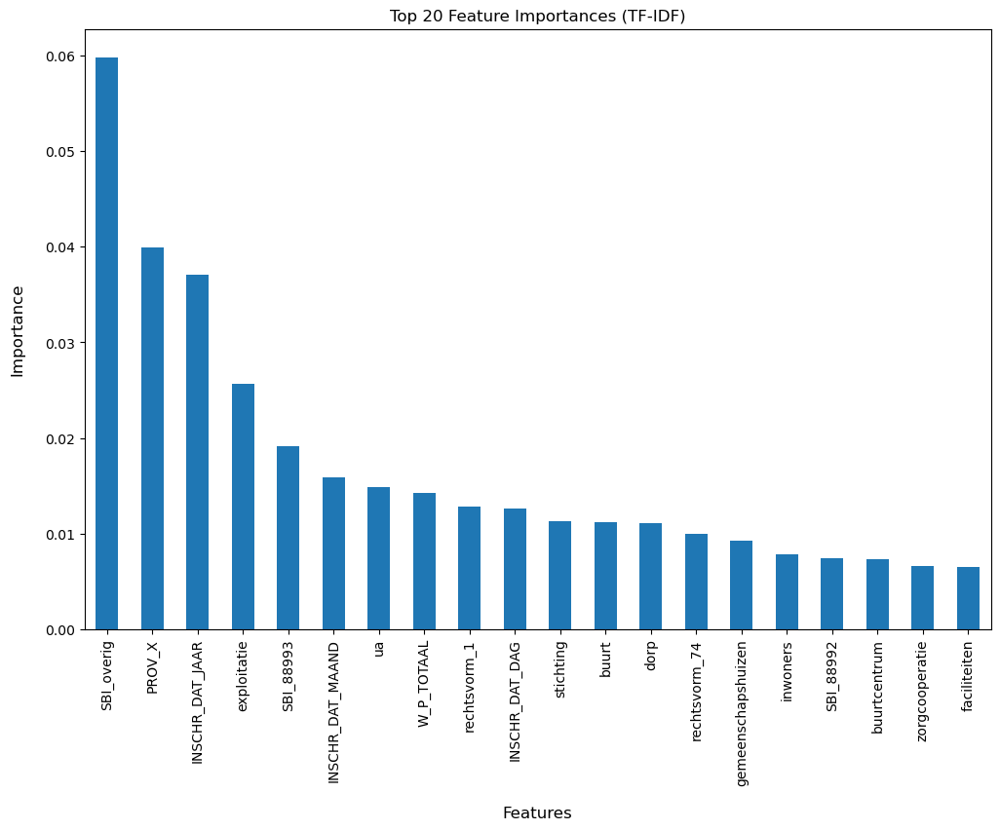

In [ ]:
#get feature importances
feature_importances22TF_IDF = best_rf_classifier_tf.feature_importances_

#convert to a pandas series for plotting purposes
featuresTF22 = X_tfidf_df22.columns if hasattr(X_bow2022, 'columns') else np.arange(len(feature_importances22TF_IDF))
importance_series22TF = pd.Series(feature_importances22TF_IDF, index=featuresTF22)

#sort the importances in descending order
importance_series_sorted22TF = importance_series22TF.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_featuresTF22 = importance_series_sorted22TF.head(N)

#print the top 20 feature importances
print("Top N Feature Importances:\n TF-DF 2022" , top_n_featuresTF22)

#plot the top 20 feature importances
plt.figure(figsize=(12, 8))

top_n_featuresTF22.plot(kind='bar')
plt.title('Top 20 Feature Importances (TF-IDF)')
plt.xlabel('Features',fontsize=12,labelpad=15)
plt.ylabel('Importance',fontsize=12,labelpad=15)
plt.show()

Top N Feature Importances:
 TF-DF 2023 SBI_overig            0.059808
PROV_X                0.039908
INSCHR_DAT_JAAR       0.037059
exploitatie           0.025663
SBI_88993             0.019169
INSCHR_DAT_MAAND      0.015880
ua                    0.014821
W_P_TOTAAL            0.014215
rechtsvorm_1          0.012830
INSCHR_DAT_DAG        0.012621
stichting             0.011241
buurt                 0.011203
dorp                  0.011082
rechtsvorm_74         0.009981
gemeenschapshuizen    0.009289
inwoners              0.007805
SBI_88992             0.007460
buurtcentrum          0.007287
zorgcooperatie        0.006591
faciliteiten          0.006470
dtype: float64


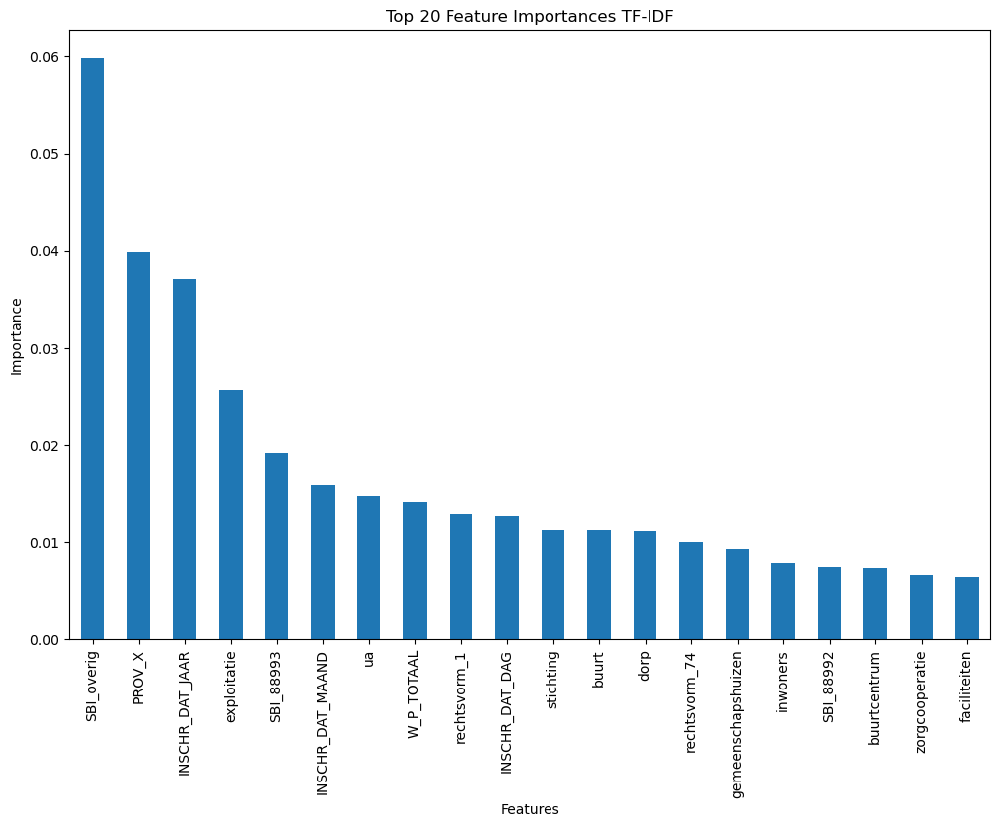

In [ ]:
#get feature importances
feature_importances23TF_IDF = best_rf_classifier_tf.feature_importances_

#convert to a pandas series for plotting purposes
featuresTF23 = X_tfidf_df23.columns if hasattr(X_bow2023, 'columns') else np.arange(len(feature_importances23TF_IDF))
importance_series23TF = pd.Series(feature_importances23TF_IDF, index=featuresTF23)

#sort the importances in descending order
importance_series_sorted23TF = importance_series23TF.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_featuresTF23 = importance_series_sorted23TF.head(N)

#print the top 20 feature importances
print("Top N Feature Importances:\n TF-DF 2023" , top_n_featuresTF23)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_featuresTF23.plot(kind='bar')
plt.title('Top 20 Feature Importances TF-IDF')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

## Print mistakes

In [ ]:
#2022 data
y_truetf22 = y_tfidf_df22
y_predtf22 = y_test_pred_tfidf_df22



#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativestf22 = np.where((y_truetf22 == 1) & (y_predtf22 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativestf22)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesTF22 = X_tfidf_df22.iloc[false_negativestf22]

mistake_indicesTF=X_test_mistakesTF22.index


df_mistakesTF22 = df_KVK2022.loc[mistake_indicesTF]
df_mistakesTF22

Number of false negatives (mistakes on class 1): 25


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,...,1,0,0,0,0,0,0,0,0,cooperatie duurzaam gortel niersen ua cooperat...
20,stichting dogma,0,stichting dogma,bevorderen kunst cultuur name mensen verstande...,2020,2,27,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting dogma stichting dogma bevorderen kun...
28,stichting streekcentrum scheerwolde,0,stichting streekcentrum scheerwo,oprichten instandhouden exploiteren gebouw sch...,1966,3,4,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting streekcentrum scheerwolde stichting ...
46,stichting steunpunt ouderen riethoven,0,stichting steunpunt ouderen,welzijnswerk ouderen,2011,2,18,1,1,0,...,0,0,1,0,0,0,0,0,0,stichting steunpunt ouderen riethoven stichtin...
50,czaar,0,czaar,sociaalcultureel werk,2010,12,29,1,0,0,...,0,0,1,0,0,0,0,0,0,czaar czaar sociaalcultureel werk
74,jong nederland lovenbesterd,0,jong nederland lovenbesterd,jeug jongerenwerk,2011,4,20,1,0,0,...,0,0,1,0,0,0,0,0,0,jong nederland lovenbesterd jong nederland lov...
89,buurtvereniging st isidorus,0,buurtvereniging st isidorus,buurtvereniging,2011,1,12,1,0,0,...,0,1,0,0,0,0,0,0,0,buurtvereniging st isidorus buurtvereniging st...
111,dorpshuis,0,dorpshuis,exploitatie gemeenschapshuis,2011,1,17,1,0,0,...,0,0,1,0,0,0,0,0,0,dorpshuis dorpshuis exploitatie gemeenschapshuis
117,buurtvereniging flora,0,buurtvereniging flora,buurtvereniging,2011,4,18,1,0,0,...,0,1,0,0,0,0,0,0,0,buurtvereniging flora buurtvereniging flora bu...
126,st centrale dorpenraad landelijk noord,0,st centrale dorpenraad landelij,sociaalcultureel werk,2011,1,19,1,0,0,...,0,0,1,0,0,0,0,0,0,st centrale dorpenraad landelijk noord st cent...


In [ ]:
#2023 data
y_truetf23 = y_tfidf_df23
y_predtf23 = y_test_pred_tfidf_df23

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativestf23 = np.where((y_truetf23 == 1) & (y_predtf23 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativestf23)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesTF23 = X_tfidf_df23.iloc[false_negativestf23]

mistake_indicesTF23=X_test_mistakesTF23.index

df_mistakesTF23 = df_KVK2023.loc[mistake_indicesTF23]
df_mistakesTF23

Number of false negatives (mistakes on class 1): 23


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
12,dienstencentrum senioren lemmer,0,dienstencentrum senioren lemmer,welzijnswerk ontmoetingscentrum ouderen,2010,11,9,1,1,0,...,0,0,1,0,0,0,0,0,0,dienstencentrum senioren lemmer dienstencentru...
20,mandala,0,mandala,sociaalcultureelwerk,2011,4,26,1,0,0,...,0,0,1,0,0,0,0,0,0,mandala mandala sociaalcultureelwerk
47,cultureel welzijnscentrum chinese brug,0,cultureel welzijnscentrum chinese brug,sociaalculturele educatieve maatschappelijke a...,2013,10,4,1,0,0,...,0,0,1,0,0,0,0,0,0,cultureel welzijnscentrum chinese brug culture...
76,ontmoetingsruimte kbo t klepke,0,ontmoetingsruimte kbo t klepke,ouderenwerk,2011,4,12,1,0,0,...,0,1,0,0,0,0,0,0,0,ontmoetingsruimte kbo t klepke ontmoetingsruim...
97,stichting cultuurhuys kroon,0,stichting cultuurhuys kroon,beheren exploiteren sociaal cultureel centrum,2015,1,23,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting cultuurhuys kroon stichting cultuurh...
110,goede herder zaal,0,goede herder zaal,ontmoetingsruimte gericht ouderenbeleid parochie,2010,8,3,1,1,0,...,0,0,1,0,0,0,0,0,0,goede herder zaal goede herder zaal ontmoeting...
145,dorpshuis poort bv,6,dorpshuis poort bv,exploitatie een meerdere verenigingsgebouwen d...,2014,7,9,1,0,0,...,0,0,0,0,0,0,0,0,0,dorpshuis poort bv dorpshuis poort bv exploita...
168,wijkcentrum schieringen,0,wijkcentrum schieringen,wijkcentrum afhaalpunt post nl,2011,5,3,1,0,0,...,0,0,1,0,0,0,0,0,0,wijkcentrum schieringen wijkcentrum schieringe...
183,verenigingsgebouw koels,0,verenigingsgebouw koels,exploitatie verenigingsgebouw exploitatie hore...,2014,4,12,1,0,0,...,0,0,0,1,0,0,0,0,0,verenigingsgebouw koels verenigingsgebouw koel...
223,stichting rebellenclub zuidermeer,0,stichting rebellenclub zuidermeer,sociaalcultureel werk,2011,2,24,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting rebellenclub zuidermeer stichting re...


# LDA classification

In [95]:
#combining all textual data into 1 column
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
#replace NaN values with empty strings
df_labelledlda[text_columns] = df_labelledlda[text_columns].fillna('')
#combine all text columns into one
df_labelledlda['combined_text'] = df_labelledlda[text_columns].apply(lambda row: ' '.join(row), axis=1)

Optimal number of topics (k): 11


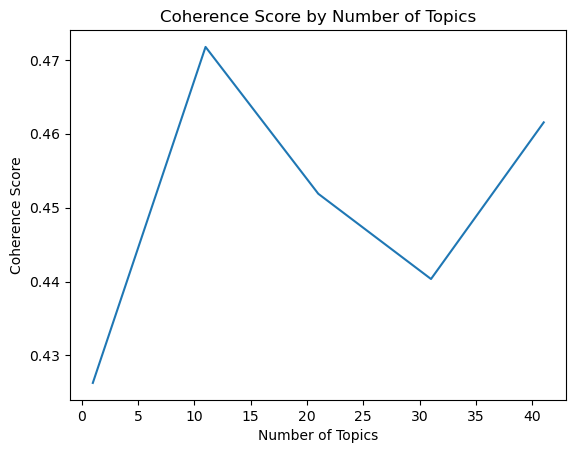

In [96]:
#convert documents into lists
documents = df_labelledlda['combined_text'].tolist()

#intialize CountVectorizer
vectorizer = CountVectorizer()

#fit and transform the combined text column into a bow
bow = vectorizer.fit_transform(documents)

#extract feature names
feature_names = vectorizer.get_feature_names_out()

#gensim expects a list of tokenized texts a list of words is created
tokenized_docs = [doc.split() for doc in documents]

#create a gensim dictionary from the tokens
dictionary = corpora.Dictionary(tokenized_docs)

#convert bow matrix to gensim corpus (bow)
#using the CountVectorizer's vocabulary to create a corpus
corpus = [dictionary.doc2bow(doc.split()) for doc in documents]

# function created to compute coherence score
def compute_coherence_values(corpus, dictionary, k, texts):
    lda_model = gensim.models.LdaModel(corpus=corpus,
                                       id2word=dictionary,
                                       num_topics=k,
                                       random_state=42,
                                       chunksize=100,
                                       passes=10,
                                       per_word_topics=True)
    coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
    return coherence_model_lda.get_coherence()

#define range of k values
min_k = 1
max_k = 50
step = 10
k_values = range(min_k, max_k + 1, step)

#compute coherence scores for different k values
coherence_values = []
for k in k_values:
    coherence_score = compute_coherence_values(corpus=corpus, dictionary=dictionary, k=k, texts=tokenized_docs)
    coherence_values.append(coherence_score)

#find optimal k with highest coherence score
optimal_k = k_values[np.argmax(coherence_values)]
print("Optimal number of topics (k):", optimal_k)

#plot coherence values to visualize
plt.plot(k_values, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Score by Number of Topics")
plt.show()


In [97]:
#topic modeling using the LDA algorithm
from sklearn.decomposition import LatentDirichletAllocation

LDA = LatentDirichletAllocation(n_components=11, random_state=0)
LDA.fit_transform(bow)

array([[0.00699308, 0.00699337, 0.00699345, ..., 0.00699309, 0.0069933 ,
        0.00699331],
       [0.01136364, 0.88636156, 0.01136482, ..., 0.01136364, 0.01136403,
        0.01136387],
       [0.00378792, 0.00378796, 0.00378802, ..., 0.9621203 , 0.00378793,
        0.00378789],
       ...,
       [0.0082649 , 0.00826477, 0.00826466, ..., 0.00826471, 0.00826446,
        0.91735271],
       [0.01010136, 0.01010164, 0.0101017 , ..., 0.01010113, 0.01010125,
        0.01010176],
       [0.01010136, 0.01010159, 0.01010157, ..., 0.01010113, 0.01010118,
        0.89898668]])

In [98]:
#rows correspond to topics, and columns correspond to words
#values indicate the importance of each word in each topic
print(LDA.components_)

[[0.09090909 0.09090909 2.09091206 ... 0.09090909 0.09090909 0.09090909]
 [0.09090909 0.09090909 0.09091138 ... 0.09090909 0.09090909 0.09090909]
 [0.09090909 0.09090909 4.59163623 ... 0.09090909 0.09090909 0.09090909]
 ...
 [0.09090909 0.09092851 0.19457186 ... 0.09090909 0.09090909 1.09090909]
 [0.09090909 0.09090909 0.09090909 ... 0.09090909 0.09090909 0.09090909]
 [0.09090909 0.09090909 3.09091166 ... 0.09090909 1.09090909 0.09090909]]


In [99]:
#iterate over each topic learned by the LDA model and print the top 15 most important words for each topic.
#each topic is represented by a list of words based on their importance in the topic.
for i, t in enumerate(LDA.components_):
  hottopics = t.argsort()[:-15 -1:-1 ]
  print("Topic {}".format(i + 1) + " " + " ".join([feature_names[j] for j in hottopics]))

Topic 1 stichting gemeenschapshuis adviesorganen samenwerkings overkoepelende organen gebied exploitatie welzijnswerk delft activiteiten thuiszorg fonds fondsen ouderen
Topic 2 stichting ua zorgcooperatie dorp beheren kwetsbare werk wonen bevorderen buurt dagbesteding blijven maatschappelijke welzijn mensen
Topic 3 stichting buurt gebied vereniging ua bv begeleiding leden cooperatie alsmede ten diensten doel cooperatieve alle
Topic 4 mensen stichting begeleiding geven beperking bv hulp coaching stellen trainingen maken ondersteunen financiele maatschap maatschappelijke
Topic 5 stichting ua leden cooperatie cooperatieve enof vereniging belangen activiteiten coop ondersteunen filosoferen ter ondersteuning sociale
Topic 6 leden cooperatie ua buurtcentrum ten overeenkomsten behoeve stoffelijke behoeften bedrijf uitoefenen einde belangen doet uitoefent
Topic 7 stichting zorg welzijn begeleiding mensen buurthuis individuele ten activiteiten advies daartoe exploitatie dementie beperking natuu

#### Feature computation

In [100]:
topic_distributions = LDA.fit_transform(bow)

#create column names for the topics
topic_columns = ["Topic {}".format(i+1) for i in range(topic_distributions.shape[1])]

#add topic distributions as columns to df_labelled
for i, column in enumerate(topic_columns):
    df_labelledlda[column] = topic_distributions[:, i]

##### Topic modelling and feature computation dataset 2022

In [101]:
LDA = LatentDirichletAllocation(n_components=11, random_state=0)
LDA.fit_transform(bow2022)

array([[0.00649354, 0.00649363, 0.00649351, ..., 0.00649352, 0.00649352,
        0.00649351],
       [0.00303035, 0.00303055, 0.00303057, ..., 0.00303072, 0.00303032,
        0.00303053],
       [0.00413224, 0.95867657, 0.00413226, ..., 0.00413283, 0.00413239,
        0.00413235],
       ...,
       [0.00413233, 0.00413227, 0.00413237, ..., 0.95867693, 0.0041324 ,
        0.00413228],
       [0.94318109, 0.00568183, 0.00568184, ..., 0.00568188, 0.00568191,
        0.00568188],
       [0.00568186, 0.00568187, 0.00568196, ..., 0.00568187, 0.94318094,
        0.00568182]])

In [102]:

topic_distributions2022 = LDA.fit_transform(bow2022)

#create column names for the topics
topic_columns2022 = ["Topic {}".format(i+1) for i in range(topic_distributions2022.shape[1])]

#add topic distributions as columns to df_labelled
for i, column in enumerate(topic_columns2022):
    df_lda2022.loc[:, column] = topic_distributions2022[:, i]

##### Topic modelling and feature computation dataset 2023

In [103]:
topic_distributions2023 = LDA.fit_transform(bow2023)

#create column names for the topics
topic_columns2023 = ["Topic {}".format(i+1) for i in range(topic_distributions2023.shape[1])]

#add topic distributions as columns to df_labelled
for i, column in enumerate(topic_columns2023):
    df_lda2023.loc[:, column] = topic_distributions2023[:, i]

#### Drop textual data

In [104]:
text_columns_drop = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']

df_lda2022.drop(columns=text_columns_drop, inplace=True)
df_lda2023.drop(columns=text_columns_drop, inplace=True)


In [105]:
text_columns_drop = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving','combined_text']

df_labelledlda.drop(columns=text_columns_drop, inplace=True)

## Start classification and tuning

In [106]:
X = df_labelledlda.drop(columns=['label'])  # Features
y = df_labelledlda['label']  # Label

#split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [107]:
rf_classifier_LDA = RandomForestClassifier(n_estimators=25, random_state=42)
rf_classifier_LDA.fit(X_train, y_train)

#predict labels for the test data
y_pred_rf_LDA = rf_classifier_LDA.predict(X_test)

#calculate accuracy
accuracy_rf_LDA = accuracy_score(y_test, y_pred_rf_LDA)
print("Accuracy (Random Forest before tuning):", accuracy_rf_LDA)

Accuracy (Random Forest before tuning): 0.8035714285714286


In [108]:
#parameter grid
param_grid = {
    'n_estimators': [50, 100,150, 200],
    'max_depth': [5,10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
}

#create a classifier
rf_classifier_LDA = RandomForestClassifier(random_state=42)

#create a GridSearchCV object with 10 folds
grid_search_LDA = GridSearchCV(estimator=rf_classifier_LDA, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring = 'f1')

#fit the grid search to the training data
grid_search_LDA.fit(X_train, y_train)

#print the best parameters found
print("Best parameters found: ", grid_search_LDA.best_params_)

#use the best estimator to make predictions
best_rf_classifier_LDA = grid_search_LDA.best_estimator_

Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best parameters found:  {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [109]:
#evaluate using 10-Fold Cross-Validation on the training set
cross_val_scores_LDA = cross_val_score(best_rf_classifier_LDA, X_train, y_train, cv=10)

#calculate and print the mean accuracy from cross-validation
mean_cross_val_accuracy_LDA = cross_val_scores_LDA.mean()
print("Mean Cross-Validation Accuracy (Random Forest after tuning):", mean_cross_val_accuracy_LDA)

#predict on the test set
y_test_pred_LDA = best_rf_classifier_LDA.predict(X_test)

#calculate accuracy on the test set
accuracy_rf_test_LDA= accuracy_score(y_test, y_test_pred_LDA)
print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_LDA)

Mean Cross-Validation Accuracy (Random Forest after tuning): 0.8472370766488414
Test Accuracy (Random Forest after tuning): 0.7946428571428571


In [110]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_LDA = accuracy_score(y_test, y_test_pred_LDA)
precision_rf_test_LDA = precision_score(y_test, y_test_pred_LDA)
recall_rf_test_LDA= recall_score(y_test, y_test_pred_LDA)
f1_rf_test_LDA = f1_score(y_test, y_test_pred_LDA)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_LDA)
print("Test Precision (Random Forest after tuning):", precision_rf_test_LDA)
print("Test Recall (Random Forest after tuning):", recall_rf_test_LDA)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_LDA)

Test Accuracy (Random Forest after tuning): 0.7946428571428571
Test Precision (Random Forest after tuning): 0.9130434782608695
Test Recall (Random Forest after tuning): 0.5
Test F1-score (Random Forest after tuning): 0.6461538461538461


In [111]:
print(classification_report(y_test, y_test_pred_LDA))

              precision    recall  f1-score   support

           0       0.76      0.97      0.86        70
           1       0.91      0.50      0.65        42

    accuracy                           0.79       112
   macro avg       0.84      0.74      0.75       112
weighted avg       0.82      0.79      0.78       112



## Classification for the 2022 and 2023 test data

In [112]:
#split the label from the rest of the data

X_lda_df22 = df_lda2022.drop(columns=['label'])  #features
y_lda_df22 = df_lda2022['label']  #label
#order the 2022 data in the same way as the training data
X_lda_df22 = df_lda2022[X_test.columns]

y_test_pred_lda_df22 = best_rf_classifier_LDA.predict(X_lda_df22)



In [113]:
accuracy_rf_test_tf2022 = accuracy_score(y_lda_df22, y_test_pred_lda_df22)
precision_rf_test_tf2022 = precision_score(y_lda_df22, y_test_pred_lda_df22)
recall_rf_test_tf2022 = recall_score(y_lda_df22, y_test_pred_lda_df22)
f1_rf_test_tf2022 = f1_score(y_lda_df22, y_test_pred_lda_df22)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf2022)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf2022)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf2022)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf2022)

Test Accuracy (Random Forest after tuning): 0.8971428571428571
Test Precision (Random Forest after tuning): 0.0
Test Recall (Random Forest after tuning): 0.0
Test F1-score (Random Forest after tuning): 0.0


In [114]:
print(classification_report(y_lda_df22, y_test_pred_lda_df22))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95       319
           1       0.00      0.00      0.00        31

    accuracy                           0.90       350
   macro avg       0.46      0.49      0.47       350
weighted avg       0.83      0.90      0.86       350



In [115]:
#and 2023
#split the label from the rest of the data
X_lda_df23 = df_lda2023.drop(columns=['label'])  #features
y_lda_df23 = df_lda2023['label']  #label
#order the 2022 data in the same way as the training data
X_lda_df23 = X_lda_df23[X_test.columns]

y_test_pred_lda_df23 = best_rf_classifier_LDA.predict(X_lda_df23)



In [116]:
accuracy_rf_test_tf2023 = accuracy_score(y_lda_df23, y_test_pred_lda_df23)
precision_rf_test_tf2023 = precision_score(y_lda_df23, y_test_pred_lda_df23)
recall_rf_test_tf2023 = recall_score(y_lda_df23, y_test_pred_lda_df23)
f1_rf_test_tf2023 = f1_score(y_lda_df23, y_test_pred_lda_df23)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf2023)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf2023)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf2023)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf2023)

Test Accuracy (Random Forest after tuning): 0.92
Test Precision (Random Forest after tuning): 0.25
Test Recall (Random Forest after tuning): 0.038461538461538464
Test F1-score (Random Forest after tuning): 0.06666666666666668


In [117]:
print(classification_report(y_lda_df23, y_test_pred_lda_df23))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       324
           1       0.25      0.04      0.07        26

    accuracy                           0.92       350
   macro avg       0.59      0.51      0.51       350
weighted avg       0.88      0.92      0.89       350



## Outcome analysis

Top N Feature Importances:
 LDA 2022 SBI_overig          0.129064
Topic 2             0.077949
PROV_X              0.059867
INSCHR_DAT_JAAR     0.059511
Topic 6             0.046623
Topic 1             0.046350
Topic 9             0.039234
INSCHR_DAT_MAAND    0.038727
INSCHR_DAT_DAG      0.038242
Topic 7             0.036429
Topic 4             0.036130
Topic 8             0.035686
Topic 3             0.034217
Topic 10            0.032910
Topic 5             0.032129
Topic 11            0.031395
rechtsvorm_1        0.026257
rechtsvorm_61       0.025888
W_P_TOTAAL          0.025555
SBI_88993           0.023115
dtype: float64


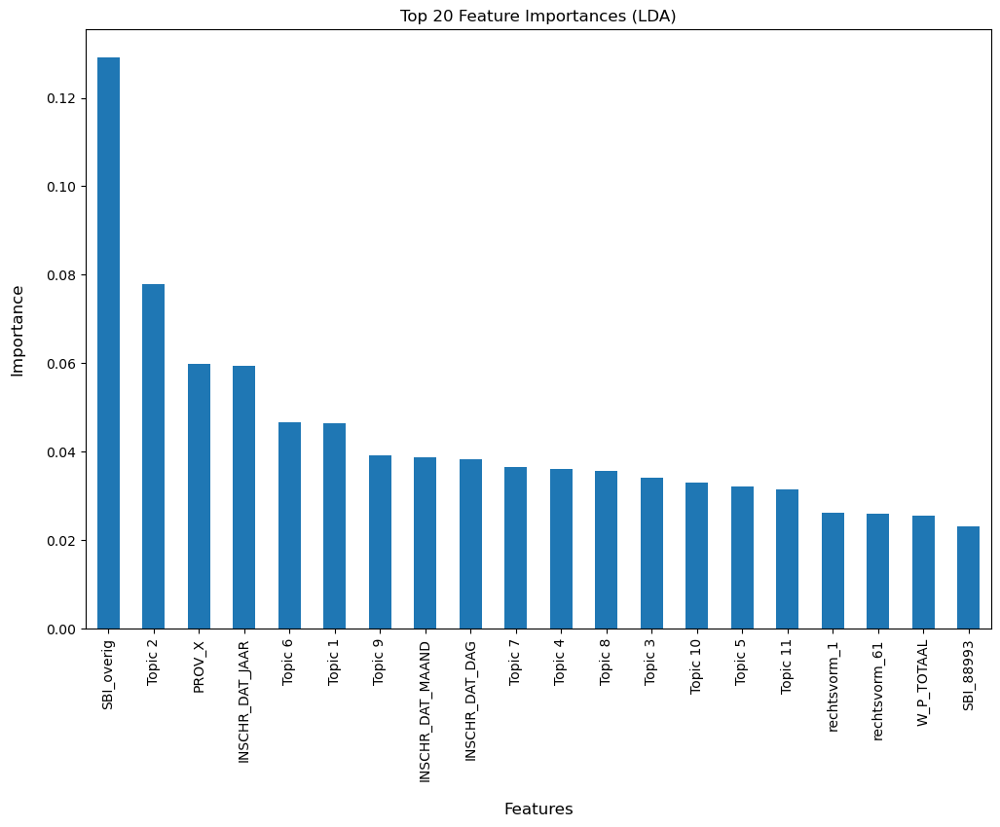

In [ ]:
#get feature importances
feature_importances22LDA = best_rf_classifier_LDA.feature_importances_

#convert to a pandas series for plotting purposes
featuresLDA22 = X_lda_df22.columns if hasattr(X_lda_df22, 'columns') else np.arange(len(feature_importances22LDA))
importance_series22LDA = pd.Series(feature_importances22LDA, index=featuresLDA22)

#sort the importances in descending order
importance_series_sorted22LDA = importance_series22LDA.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_featuresLDA22 = importance_series_sorted22LDA.head(N)

#print the top 20 feature importances
print("Top N Feature Importances:\n LDA 2022" , top_n_featuresLDA22)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_featuresLDA22.plot(kind='bar')
plt.title('Top 20 Feature Importances (LDA)')
plt.xlabel('Features',fontsize=12,labelpad=16)
plt.ylabel('Importance',fontsize=12,labelpad=16)
plt.show()

Top N Feature Importances:
 LDA 2023 SBI_overig          0.129064
Topic 2             0.077949
PROV_X              0.059867
INSCHR_DAT_JAAR     0.059511
Topic 6             0.046623
Topic 1             0.046350
Topic 9             0.039234
INSCHR_DAT_MAAND    0.038727
INSCHR_DAT_DAG      0.038242
Topic 7             0.036429
Topic 4             0.036130
Topic 8             0.035686
Topic 3             0.034217
Topic 10            0.032910
Topic 5             0.032129
Topic 11            0.031395
rechtsvorm_1        0.026257
rechtsvorm_61       0.025888
W_P_TOTAAL          0.025555
SBI_88993           0.023115
dtype: float64


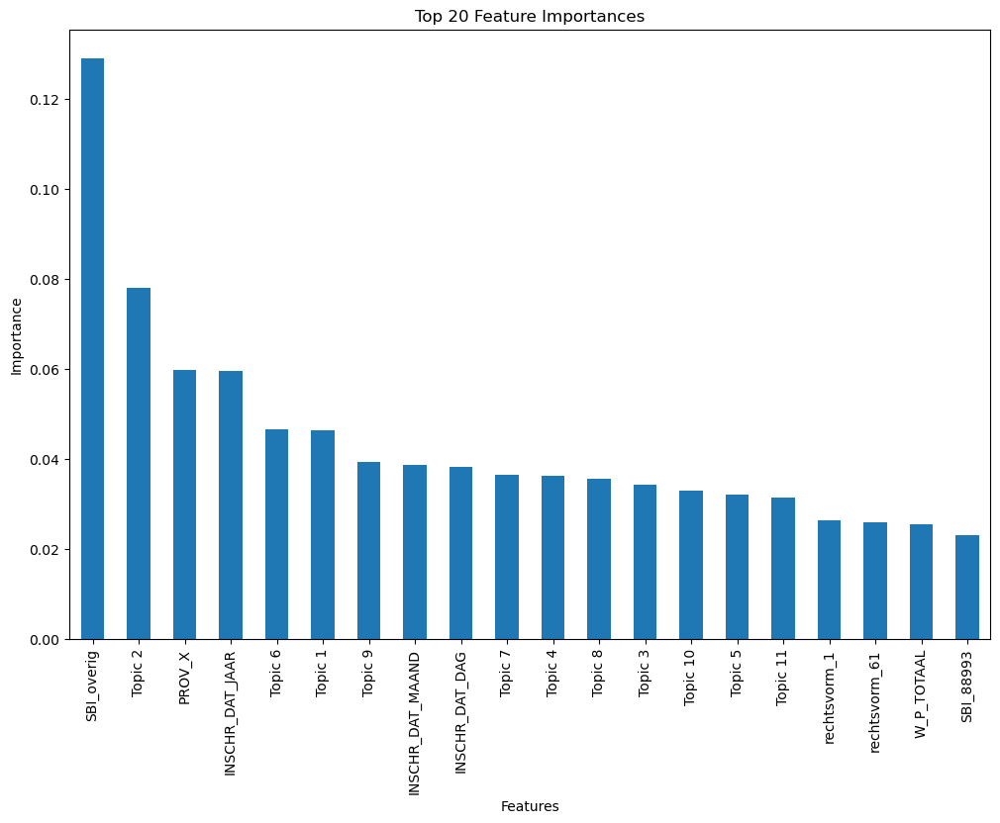

In [ ]:
#get feature importances
feature_importances23LDA = best_rf_classifier_LDA.feature_importances_

#convert to a pandas series for plotting purposes
featuresLDA23 = X_lda_df23.columns if hasattr(X_lda_df23, 'columns') else np.arange(len(feature_importances23LDA))
importance_series23LDA = pd.Series(feature_importances23LDA, index=featuresLDA23)

#sort the importances in descending order
importance_series_sorted23LDA = importance_series23LDA.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_featuresLDA23 = importance_series_sorted23LDA.head(N)

#print the top 20 feature importances
print("Top N Feature Importances:\n LDA 2023" , top_n_featuresLDA23)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_featuresLDA23.plot(kind='bar')
plt.title('Top 20 Feature Importances')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

## Print mistakes

In [ ]:
#2022 data
y_truelda22 = y_lda_df22
y_predlda22 = y_test_pred_lda_df22


#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativeslda22 = np.where((y_truelda22 == 1) & (y_predlda22 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativeslda22)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakeslda22 = X_lda_df22.iloc[false_negativeslda22]

mistake_indiceslda22=X_test_mistakeslda22.index

df_mistakeslda22 = df_KVK2022.loc[mistake_indiceslda22]
df_mistakeslda22

Number of false negatives (mistakes on class 1): 31


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,...,1,0,0,0,0,0,0,0,0,cooperatie duurzaam gortel niersen ua cooperat...
20,stichting dogma,0,stichting dogma,bevorderen kunst cultuur name mensen verstande...,2020,2,27,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting dogma stichting dogma bevorderen kun...
28,stichting streekcentrum scheerwolde,0,stichting streekcentrum scheerwo,oprichten instandhouden exploiteren gebouw sch...,1966,3,4,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting streekcentrum scheerwolde stichting ...
31,dorpsraadcooperatie meeden ua,0,dorpsraadcooperatie meeden ua,kwaliteit leefomgeving meeden waarborgen verbe...,2008,8,29,1,0,0,...,1,0,0,0,0,0,0,0,0,dorpsraadcooperatie meeden ua dorpsraadcoopera...
46,stichting steunpunt ouderen riethoven,0,stichting steunpunt ouderen,welzijnswerk ouderen,2011,2,18,1,1,0,...,0,0,1,0,0,0,0,0,0,stichting steunpunt ouderen riethoven stichtin...
50,czaar,0,czaar,sociaalcultureel werk,2010,12,29,1,0,0,...,0,0,1,0,0,0,0,0,0,czaar czaar sociaalcultureel werk
74,jong nederland lovenbesterd,0,jong nederland lovenbesterd,jeug jongerenwerk,2011,4,20,1,0,0,...,0,0,1,0,0,0,0,0,0,jong nederland lovenbesterd jong nederland lov...
84,stichting centrum ouderen kemphaan,0,stichting centrum ouderen,exploitatie gemeenschapshuis,2010,12,21,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting centrum ouderen kemphaan stichting c...
89,buurtvereniging st isidorus,0,buurtvereniging st isidorus,buurtvereniging,2011,1,12,1,0,0,...,0,1,0,0,0,0,0,0,0,buurtvereniging st isidorus buurtvereniging st...
102,buurthuis wel,0,buurthuis wel,buurt clubhuis werk samenlevingsopbouwwerk,2010,10,11,1,0,0,...,0,0,1,0,0,0,0,0,0,buurthuis wel buurthuis wel buurt clubhuis wer...


In [ ]:
#2023 data
y_truelda23 = y_lda_df23
y_predlda23 = y_test_pred_lda_df23



#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativeslda23 = np.where((y_truelda23 == 1) & (y_predlda23 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativeslda23)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakeslda23 = X_lda_df23.iloc[false_negativeslda23]

mistake_indiceslda23=X_test_mistakeslda23.index


df_mistakeslda23 = df_KVK2023.loc[mistake_indiceslda23]
df_mistakeslda23

Number of false negatives (mistakes on class 1): 25


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
12,dienstencentrum senioren lemmer,0,dienstencentrum senioren lemmer,welzijnswerk ontmoetingscentrum ouderen,2010,11,9,1,1,0,...,0,0,1,0,0,0,0,0,0,dienstencentrum senioren lemmer dienstencentru...
47,cultureel welzijnscentrum chinese brug,0,cultureel welzijnscentrum chinese brug,sociaalculturele educatieve maatschappelijke a...,2013,10,4,1,0,0,...,0,0,1,0,0,0,0,0,0,cultureel welzijnscentrum chinese brug culture...
76,ontmoetingsruimte kbo t klepke,0,ontmoetingsruimte kbo t klepke,ouderenwerk,2011,4,12,1,0,0,...,0,1,0,0,0,0,0,0,0,ontmoetingsruimte kbo t klepke ontmoetingsruim...
97,stichting cultuurhuys kroon,0,stichting cultuurhuys kroon,beheren exploiteren sociaal cultureel centrum,2015,1,23,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting cultuurhuys kroon stichting cultuurh...
110,goede herder zaal,0,goede herder zaal,ontmoetingsruimte gericht ouderenbeleid parochie,2010,8,3,1,1,0,...,0,0,1,0,0,0,0,0,0,goede herder zaal goede herder zaal ontmoeting...
145,dorpshuis poort bv,6,dorpshuis poort bv,exploitatie een meerdere verenigingsgebouwen d...,2014,7,9,1,0,0,...,0,0,0,0,0,0,0,0,0,dorpshuis poort bv dorpshuis poort bv exploita...
158,vereniging plaatselijk belang bontebok,0,vereniging plaatselijk belang bontebok,buurt clubhuiswerk samenlevingsopbouwwerk spec...,2011,8,4,1,0,0,...,0,1,0,0,0,0,0,0,0,vereniging plaatselijk belang bontebok verenig...
168,wijkcentrum schieringen,0,wijkcentrum schieringen,wijkcentrum afhaalpunt post nl,2011,5,3,1,0,0,...,0,0,1,0,0,0,0,0,0,wijkcentrum schieringen wijkcentrum schieringe...
183,verenigingsgebouw koels,0,verenigingsgebouw koels,exploitatie verenigingsgebouw exploitatie hore...,2014,4,12,1,0,0,...,0,0,0,1,0,0,0,0,0,verenigingsgebouw koels verenigingsgebouw koel...
187,kleine loef,0,kleine loef,exploitatie gemeenschapshuis,2011,3,15,1,0,0,...,0,0,1,0,0,0,0,0,0,kleine loef kleine loef exploitatie gemeenscha...


# Word2Vec classification

In [7]:
from gensim.models import KeyedVectors

#download model at : https://github.com/coosto/dutch-word-embeddings/releases
model_path = "model/model.bin"

#load the model
word2vec_model = KeyedVectors.load_word2vec_format(model_path, binary=True)


In [8]:
#map text data to embeddings
def text_to_embeddings(text):
    embeddings = []
    for word in text.split():  # Split the text into words
        if word in word2vec_model:
            embeddings.append(word2vec_model[word])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(word2vec_model.vector_size)  # Return zero vector if no embeddings found
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
# create and map 'combined_text' column to embeddings
df_labelledword2vec['combined_text'] = df_labelledword2vec[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)
X = np.vstack(df_labelledword2vec['combined_text'].apply(text_to_embeddings))
non_textual_features = df_labelledword2vec.drop(columns=['combined_text'])
#combine non-textual features with the textual embeddings
X_combined = np.hstack((non_textual_features.values, X ))
#convert the combined array into a DataFrame
columns = list(non_textual_features.columns) + [f"embedding_{i}" for i in range(X.shape[1])]
df_combined = pd.DataFrame(data=X_combined, columns=columns)


In [9]:
df_combined

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,...,embedding_290,embedding_291,embedding_292,embedding_293,embedding_294,embedding_295,embedding_296,embedding_297,embedding_298,embedding_299
0,maatschap beheer mfc tiendeveen,0,maatschap beheer mfc tiendeveen,beheren multifunctioneel centrum tiendeveen,2013,3,14,0,0,0,...,-0.78844,0.377587,0.43476,1.056103,0.441386,0.882229,0.17975,-0.319408,0.410715,0.689206
1,aktiviteitencentrum alletahof,0,aktiviteitencentrum alletahof,buurt clubhuiswerk samenlevingsopbouwwerk,2011,2,16,0,0,0,...,-0.599467,0.300803,-0.394048,-0.497775,0.482712,-0.225908,0.471948,0.123489,-0.423275,0.486374
2,cooperatie stationspark deurne ua,0,cooperatie stationspark deurne,kwaliteit woon werk leefomgeving gebied rondom...,2014,12,23,0,0,0,...,-0.403064,-0.032874,-0.048174,0.887613,0.304408,-0.552161,0.558786,-0.304508,-0.083794,-0.014172
3,cooperatie sustar ua,0,cooperatie sustar ua,bieden ondersteuning organisaties ontwerp real...,2022,7,1,0,0,0,...,-0.578522,0.042857,0.667543,1.014175,0.071266,0.251424,0.857688,-0.603213,0.183781,-0.102225
4,jasmijnsteede centraal wonen ouderen,0,jasmijnsteede centraal wonen vo,groepswonen ouderen,2011,4,20,1,0,0,...,-0.320039,0.51038,-0.470386,1.18449,0.795671,-0.560223,0.787227,-0.877959,-0.217581,0.50533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,verenig groepsw oud ouderlandshoek,0,vereniging groepswonen ouder,bejaardenverenigingen,1990,3,6,0,0,0,...,0.835629,0.259642,-0.426648,0.285223,0.065858,0.099974,0.330006,-0.718647,-0.193774,0.484173
442,bewonersvereniging centraal wonen banier,0,bewonersvereniging centraal wone,verhuur onroerend goed,1979,10,26,0,0,0,...,-0.495314,0.387463,0.248839,0.843353,0.111081,-0.162675,0.70795,-0.424812,0.229741,-0.010889
443,stichting dorpsraad venzelderheide,5,stichting dorpsraad venzelderhe,belangenverenigingen bezighouden meente activi...,1981,6,26,0,0,0,...,-0.110881,-0.565129,-0.606205,0.641044,-0.335654,0.289748,1.286742,-0.548057,0.769617,-0.091649
444,stichting wijkraad lovenbesterd,0,stichting wijkraad lovenbesterd,buurthuiswerk samenlevingsopbouwwerk,1988,7,4,0,0,0,...,-0.2894,-0.688069,-0.520702,1.279057,-0.316061,0.365628,1.957906,-0.038729,1.625446,0.265042


#### Create dataframes for 2022 and 2023

In [42]:
df_word2vec22['combined_text'] = df_word2vec22[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)
X2022 = np.vstack(df_word2vec22['combined_text'].apply(text_to_embeddings))
non_textual_features2022 = df_word2vec22.drop(columns=['combined_text'])
#combine non-textual features with the textual embeddings
X_combined2022 = np.hstack((non_textual_features2022.values, X2022))
#convert the combined array into a DataFrame
columns2022 = list(non_textual_features2022.columns) + [f"embedding_{i}" for i in range(X2022.shape[1])]
df_combined2022 = pd.DataFrame(data=X_combined2022, columns=columns2022)

In [43]:
df_word2vec23['combined_text'] = df_word2vec23[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)
X2023 = np.vstack(df_word2vec23['combined_text'].apply(text_to_embeddings))
non_textual_features2023 = df_word2vec23.drop(columns=['combined_text'])
#combine non-textual features with the textual embeddings
X_combined2023 = np.hstack((non_textual_features2023.values, X2023))
#convert the combined array into a DataFrame
columns2023 = list(non_textual_features2023.columns) + [f"embedding_{i}" for i in range(X2023.shape[1])]
df_combined2023 = pd.DataFrame(data=X_combined2023, columns=columns2023)

#### Drop textual data

In [44]:
text_columns_drop = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_combined2022.drop(columns=text_columns_drop, inplace=True)

df_combined2023.drop(columns=text_columns_drop, inplace=True)

In [20]:
text_columns_dropcomb = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_combined.drop(columns=text_columns_dropcomb, inplace=True)


## Start classication and tuning

In [22]:
yw2v = df_combined["label"]
yw2v = yw2v.astype(int)

X_comb= df_combined.drop(columns=['label'])

In [23]:
#split data into training and testing sets
X_trainw2v, X_testw2v, y_trainw2v, y_testw2v = train_test_split(X_comb, yw2v, test_size=0.25, random_state=42)


In [24]:
rf_classifierw2v = RandomForestClassifier(n_estimators=25, random_state=42)
rf_classifierw2v.fit(X_trainw2v, y_trainw2v)

#predict labels for the test data
y_pred_rfw2v = rf_classifierw2v.predict(X_testw2v)

#calculate accuracy
accuracy_rfw2v = accuracy_score(y_testw2v, y_pred_rfw2v)
print("Accuracy (Random Forest before tuning):", accuracy_rfw2v)

Accuracy (Random Forest before tuning): 0.8571428571428571


In [25]:
#parameter grid
param_grid = {
    'n_estimators': [50, 100,150],
    'max_depth': [5, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4,5],
}

#create a classifier
rf_classifier_w2v = RandomForestClassifier(random_state=42)

#create a GridSearchCV object with 10 folds
grid_searchw2v = GridSearchCV(estimator=rf_classifier_w2v, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='f1')

#fit the grid search to the training data
grid_searchw2v.fit(X_trainw2v, y_trainw2v)

#print the best parameters found
print("Best parameters found: ", grid_searchw2v.best_params_)

#use the best estimator to make predictions
best_rf_classifier_w2v = grid_searchw2v.best_estimator_

Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best parameters found:  {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 150}


In [26]:
#evaluate using 10-Fold Cross-Validation on the training set
cross_val_scores_w2v = cross_val_score(best_rf_classifier_w2v, X_trainw2v, y_trainw2v, cv=10)

#calculate and print the mean accuracy from cross-validation
mean_cross_val_accuracy_w2v = cross_val_scores_w2v.mean()
print("Mean Cross-Validation Accuracy (Random Forest after tuning):", mean_cross_val_accuracy_w2v)

#predict on the test set
y_test_pred_w2v = best_rf_classifier_w2v.predict(X_testw2v)

#calculate accuracy on the test set
accuracy_rf_test_w2v= accuracy_score(y_testw2v, y_test_pred_w2v)
print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_w2v)

Mean Cross-Validation Accuracy (Random Forest after tuning): 0.85
Test Accuracy (Random Forest after tuning): 0.8482142857142857


In [27]:
accuracy_rf_test_w2v= accuracy_score(y_testw2v, y_test_pred_w2v)
precision_rf_test_w2v= precision_score(y_testw2v, y_test_pred_w2v)
recall_rf_test_w2v= recall_score(y_testw2v, y_test_pred_w2v)
f1_rf_test_w2v= f1_score(y_testw2v, y_test_pred_w2v)


print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_w2v)
print("Test Precision (Random Forest after tuning):", precision_rf_test_w2v)
print("Test Recall (Random Forest after tuning):", recall_rf_test_w2v)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_w2v)

Test Accuracy (Random Forest after tuning): 0.8482142857142857
Test Precision (Random Forest after tuning): 0.9310344827586207
Test Recall (Random Forest after tuning): 0.6428571428571429
Test F1-score (Random Forest after tuning): 0.7605633802816901


In [28]:
print(classification_report(y_testw2v, y_test_pred_w2v))

              precision    recall  f1-score   support

           0       0.82      0.97      0.89        70
           1       0.93      0.64      0.76        42

    accuracy                           0.85       112
   macro avg       0.88      0.81      0.82       112
weighted avg       0.86      0.85      0.84       112



## Classification for the 2022 and 2023 data

In [29]:
yw2v22 = df_combined2022["label"]
yw2v22 = yw2v22.astype(int)

X_comb22= df_combined2022.drop(columns=['label'])
X_comb22 = X_comb22[X_trainw2v.columns]


NameError: name 'df_combined2022' is not defined

In [46]:
y_test_pred_w2v22 = best_rf_classifier_w2v.predict(X_comb22)

In [47]:
accuracy_rf_test_w2v22= accuracy_score(yw2v22, y_test_pred_w2v22)
precision_rf_test_w2v22= precision_score(yw2v22, y_test_pred_w2v22)
recall_rf_test_w2v22= recall_score(yw2v22, y_test_pred_w2v22)
f1_rf_test_w2v22= f1_score(yw2v22, y_test_pred_w2v22)


print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_w2v22)
print("Test Precision (Random Forest after tuning):", precision_rf_test_w2v22)
print("Test Recall (Random Forest after tuning):", recall_rf_test_w2v22)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_w2v22)

Test Accuracy (Random Forest after tuning): 0.8971428571428571
Test Precision (Random Forest after tuning): 0.44680851063829785
Test Recall (Random Forest after tuning): 0.6774193548387096
Test F1-score (Random Forest after tuning): 0.5384615384615384


In [48]:
print(classification_report(yw2v22, y_test_pred_w2v22))

              precision    recall  f1-score   support

           0       0.97      0.92      0.94       319
           1       0.45      0.68      0.54        31

    accuracy                           0.90       350
   macro avg       0.71      0.80      0.74       350
weighted avg       0.92      0.90      0.91       350



In [49]:
yw2v23 = df_combined2023["label"]
yw2v23 = yw2v23.astype(int)

X_comb23= df_combined2023.drop(columns=['label'])
X_comb23 = X_comb23[X_trainw2v.columns]
y_test_pred_w2v23 = best_rf_classifier_w2v.predict(X_comb23)

In [50]:
accuracy_rf_test_w2v23= accuracy_score(yw2v23, y_test_pred_w2v23)
precision_rf_test_w2v23= precision_score(yw2v23, y_test_pred_w2v23)
recall_rf_test_w2v23= recall_score(yw2v23, y_test_pred_w2v23)
f1_rf_test_w2v23= f1_score(yw2v23, y_test_pred_w2v23)


print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_w2v23)
print("Test Precision (Random Forest after tuning):", precision_rf_test_w2v23)
print("Test Recall (Random Forest after tuning):", recall_rf_test_w2v23)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_w2v23)

Test Accuracy (Random Forest after tuning): 0.9028571428571428
Test Precision (Random Forest after tuning): 0.3888888888888889
Test Recall (Random Forest after tuning): 0.5384615384615384
Test F1-score (Random Forest after tuning): 0.45161290322580644


In [51]:
print(classification_report(yw2v23, y_test_pred_w2v23))

              precision    recall  f1-score   support

           0       0.96      0.93      0.95       324
           1       0.39      0.54      0.45        26

    accuracy                           0.90       350
   macro avg       0.68      0.74      0.70       350
weighted avg       0.92      0.90      0.91       350



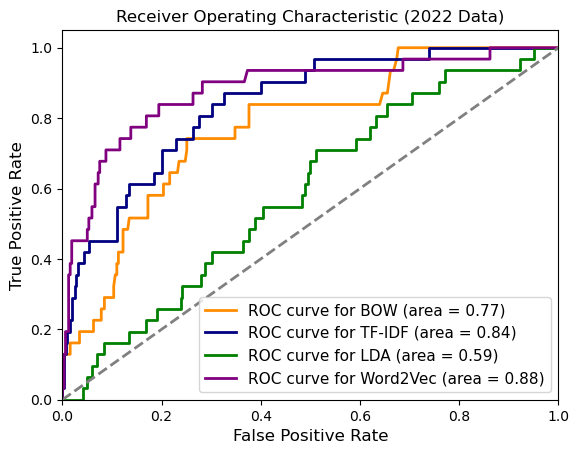

In [119]:
#compute predicted probabilities
y_test_pred_proba_bow_df22 = best_rf_classifier_bow.predict_proba(X_bow2022)
y_test_pred_proba_tfidf_df22 = best_rf_classifier_tf.predict_proba(X_tfidf_df22)
y_test_pred_proba_lda_df22 = best_rf_classifier_LDA.predict_proba(X_lda_df22)
y_test_pred_proba_w2v_df22 = best_rf_classifier_w2v.predict_proba(X_comb22)


plt.figure()

#colors for different models
colors = cycle(['darkorange', 'navy', 'green', 'purple'])

#model names
model_names = ['BOW', 'TF-IDF', 'LDA', 'Word2Vec']
pred_probas = [y_test_pred_proba_bow_df22, y_test_pred_proba_tfidf_df22, y_test_pred_proba_lda_df22, y_test_pred_proba_w2v_df22]
true_labels = [y_bow2022, y_tfidf_df22, y_lda_df22, yw2v22]

#plot ROC curves for class 1 from each model
for pred_proba, true_label, model_name, color in zip(pred_probas, true_labels, model_names, colors):
    fpr, tpr, _ = roc_curve(true_label, pred_proba[:, 1])  # Class 1 is usually the second column in predict_proba
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2,
             label=f'ROC curve for {model_name} (area = {roc_auc:.2f})')

#plotting the diagonal line for random chance
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

#plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic (2022 Data)')
plt.legend(loc='lower right', fontsize=11)
plt.show()

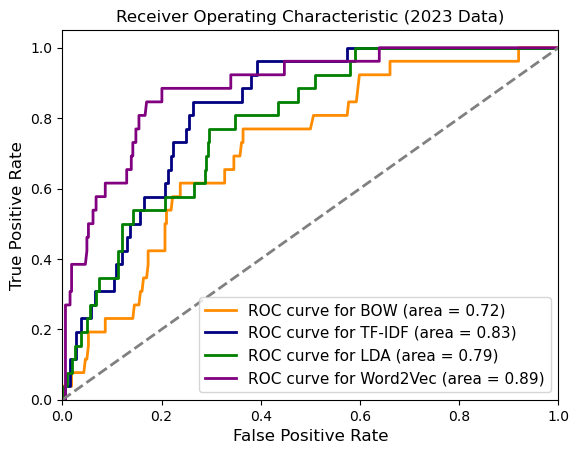

In [121]:
#compute predicted probabilities
y_test_pred_proba_bow_df23 = best_rf_classifier_bow.predict_proba(X_bow2023)
y_test_pred_proba_tfidf_df23 = best_rf_classifier_tf.predict_proba(X_tfidf_df23)
y_test_pred_proba_lda_df23 = best_rf_classifier_LDA.predict_proba(X_lda_df23)
y_test_pred_proba_w2v_df23 = best_rf_classifier_w2v.predict_proba(X_comb23)


plt.figure()

#colors for different models
colors = cycle(['darkorange', 'navy', 'green', 'purple'])

#model names
model_names = ['BOW', 'TF-IDF', 'LDA', 'Word2Vec']
pred_probas = [y_test_pred_proba_bow_df23, y_test_pred_proba_tfidf_df23, y_test_pred_proba_lda_df23, y_test_pred_proba_w2v_df23]
true_labels = [y_bow2023, y_tfidf_df23, y_lda_df23, yw2v23]

#plot ROC curves for class 1 from each model
for pred_proba, true_label, model_name, color in zip(pred_probas, true_labels, model_names, colors):
    fpr, tpr, _ = roc_curve(true_label, pred_proba[:, 1])  # Class 1 is usually the second column in predict_proba
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2,
             label=f'ROC curve for {model_name} (area = {roc_auc:.2f})')

#plotting the diagonal line for random chance
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

#plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic (2023 Data)')
plt.legend(loc='lower right', fontsize=11)
plt.show()

In [120]:
import pickle

#compute ROC data
roc_data = {}
model_names = ['BOW', 'TF-IDF', 'LDA', 'Word2Vec']
pred_probas = [y_test_pred_proba_bow_df22, y_test_pred_proba_tfidf_df22, y_test_pred_proba_lda_df22, y_test_pred_proba_w2v_df22]
true_labels = [y_bow2022, y_tfidf_df22, y_lda_df22, yw2v22]

for model_name, pred_proba, true_label in zip(model_names, pred_probas, true_labels):
    fpr, tpr, _ = roc_curve(true_label, pred_proba[:, 1])  # Assuming class 1 is the second column
    roc_auc = auc(fpr, tpr)
    roc_data[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

#save ROC data to file
with open('roc_data.pkl', 'wb') as f:
    pickle.dump(roc_data, f)

In [122]:
#compute ROC data
roc_data = {}
model_names = ['BOW', 'TF-IDF', 'LDA', 'Word2Vec']
pred_probas = [y_test_pred_proba_bow_df23, y_test_pred_proba_tfidf_df23, y_test_pred_proba_lda_df23, y_test_pred_proba_w2v_df23]
true_labels = [y_bow2023, y_tfidf_df23, y_lda_df23, yw2v23]

for model_name, pred_proba, true_label in zip(model_names, pred_probas, true_labels):
    fpr, tpr, _ = roc_curve(true_label, pred_proba[:, 1])  # Assuming class 1 is the second column
    roc_auc = auc(fpr, tpr)
    roc_data[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

#save ROC data to file
with open('roc_data23.pkl', 'wb') as f:
    pickle.dump(roc_data, f)

## Outcome analysis

Top N Feature Importances:
 Word2vec 2022 embedding_194    0.033282
embedding_34     0.029448
embedding_41     0.025759
SBI_overig       0.024577
embedding_140    0.023400
embedding_167    0.017580
embedding_271    0.016080
embedding_117    0.015901
embedding_215    0.014180
embedding_141    0.012754
embedding_137    0.012672
embedding_90     0.012559
embedding_191    0.012187
embedding_157    0.011861
embedding_245    0.011228
embedding_189    0.011116
embedding_138    0.011104
embedding_242    0.010939
embedding_26     0.010676
embedding_45     0.010377
dtype: float64


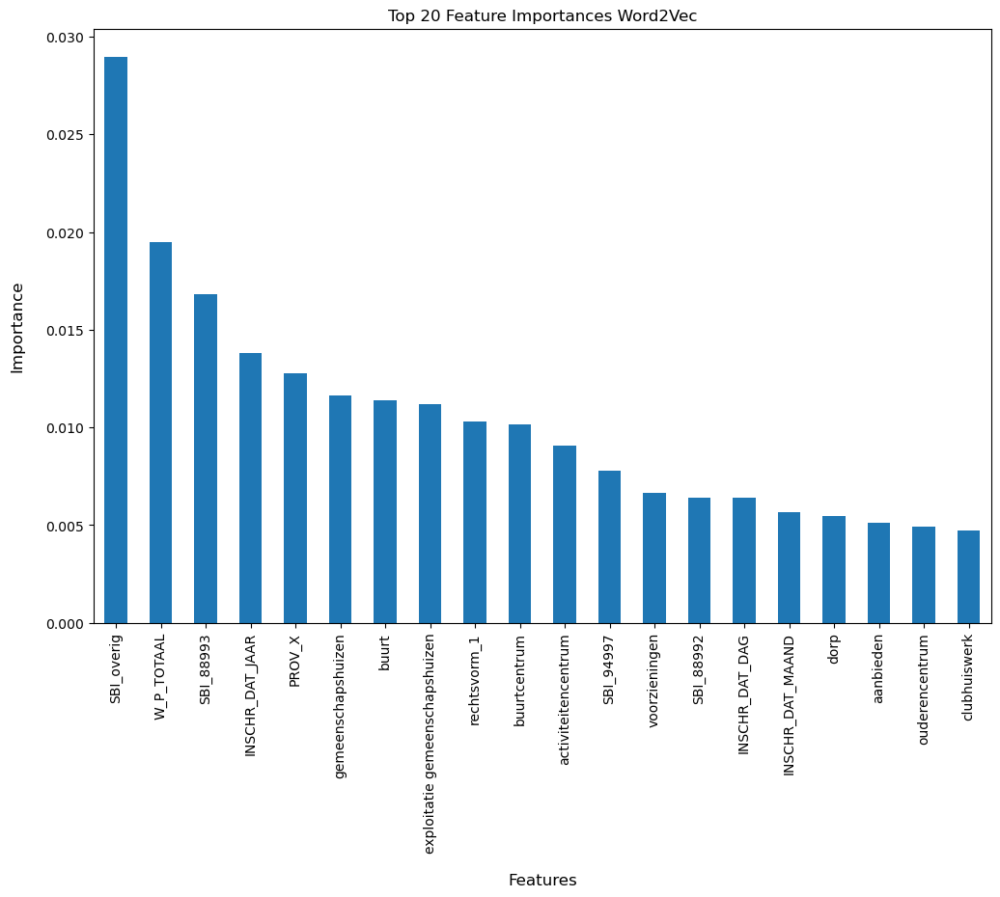

In [ ]:
#get feature importances
feature_importances22 = rf_classifierw2v.feature_importances_

#convert to a pandas series for plotting purposes
features = X_comb22.columns if hasattr(X_comb22, 'columns') else np.arange(len(feature_importances))
importance_series22 = pd.Series(feature_importances22, index=features)

#sort the importances in descending order
importance_series_sorted22 = importance_series22.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features22 = importance_series_sorted22.head(N)

print("Top N Feature Importances:\n Word2vec 2022" , top_n_features22)

#plot the top 20 feature importances
plt.figure(figsize=(12, 8))
top_n_features.plot(kind='bar')
plt.title('Top 20 Feature Importances Word2Vec')
plt.xlabel('Features',fontsize=12,labelpad=15)
plt.ylabel('Importance',fontsize=12,labelpad=16)
plt.show()

Top N Feature Importances:
 Word2vec 2023 embedding_194    0.033282
embedding_34     0.029448
embedding_41     0.025759
SBI_overig       0.024577
embedding_140    0.023400
embedding_167    0.017580
embedding_271    0.016080
embedding_117    0.015901
embedding_215    0.014180
embedding_141    0.012754
embedding_137    0.012672
embedding_90     0.012559
embedding_191    0.012187
embedding_157    0.011861
embedding_245    0.011228
embedding_189    0.011116
embedding_138    0.011104
embedding_242    0.010939
embedding_26     0.010676
embedding_45     0.010377
dtype: float64


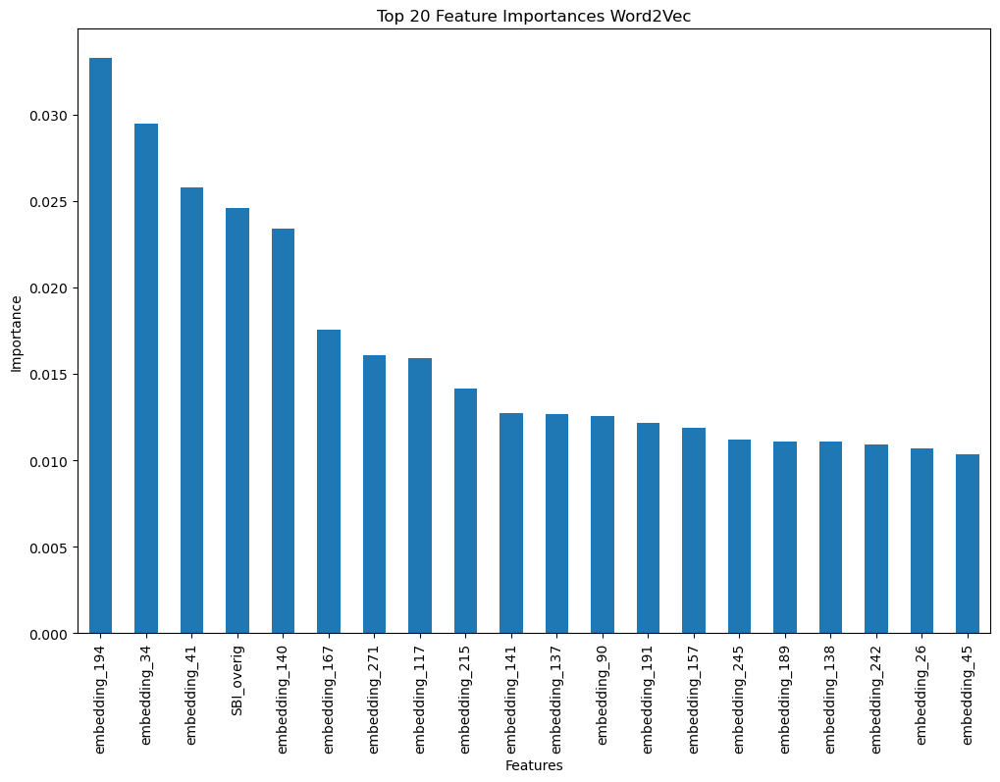

In [ ]:
#get feature importances
feature_importances23 = rf_classifierw2v.feature_importances_

#convert to a pandas series for plotting purposes
features23 = X_comb23.columns if hasattr(X_comb23, 'columns') else np.arange(len(feature_importances23))
importance_series23 = pd.Series(feature_importances23, index=features)

#sort the importances in descending order
importance_series_sorted23 = importance_series23.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features23 = importance_series_sorted23.head(N)

print("Top N Feature Importances:\n Word2vec 2023" , top_n_features23)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_features23.plot(kind='bar')
plt.title('Top 20 Feature Importances Word2Vec')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

## Print mistakes

In [ ]:
#2022 data
y_truew2v22 = yw2v22
y_predw2v22= y_test_pred_w2v22

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativesw2v22 = np.where((y_truew2v22 == 1) & (y_predw2v22 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativesw2v22)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesw2v22 = X_comb22.iloc[false_negativesw2v22]


mistake_indicesw2v22=X_test_mistakesw2v22.index

df_mistakesw2v22 = df_KVK2022.loc[mistake_indicesw2v22]
df_mistakesw2v22

Number of false negatives (mistakes on class 1): 15


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,...,1,0,0,0,0,0,0,0,0,cooperatie duurzaam gortel niersen ua cooperat...
20,stichting dogma,0,stichting dogma,bevorderen kunst cultuur name mensen verstande...,2020,2,27,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting dogma stichting dogma bevorderen kun...
28,stichting streekcentrum scheerwolde,0,stichting streekcentrum scheerwo,oprichten instandhouden exploiteren gebouw sch...,1966,3,4,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting streekcentrum scheerwolde stichting ...
46,stichting steunpunt ouderen riethoven,0,stichting steunpunt ouderen,welzijnswerk ouderen,2011,2,18,1,1,0,...,0,0,1,0,0,0,0,0,0,stichting steunpunt ouderen riethoven stichtin...
50,czaar,0,czaar,sociaalcultureel werk,2010,12,29,1,0,0,...,0,0,1,0,0,0,0,0,0,czaar czaar sociaalcultureel werk
74,jong nederland lovenbesterd,0,jong nederland lovenbesterd,jeug jongerenwerk,2011,4,20,1,0,0,...,0,0,1,0,0,0,0,0,0,jong nederland lovenbesterd jong nederland lov...
126,st centrale dorpenraad landelijk noord,0,st centrale dorpenraad landelij,sociaalcultureel werk,2011,1,19,1,0,0,...,0,0,1,0,0,0,0,0,0,st centrale dorpenraad landelijk noord st cent...
140,t dorpshuus,0,t dorpshuus,sociaalcultureel werk,2012,3,1,1,0,0,...,0,1,0,0,0,0,0,0,0,t dorpshuus t dorpshuus sociaalcultureel werk
176,dorpscentrum d ouw school,0,dorpscentrum d ouw school,lokaalruimte alle plaatselijke verenigingen ma...,2010,8,3,1,0,0,...,0,0,1,0,0,0,0,0,0,dorpscentrum d ouw school dorpscentrum d ouw s...
220,oan e feart,0,oan e feart,exploitatie gemeenschaps dorpshuizen wijkcentr...,2011,5,4,1,0,0,...,0,0,1,0,0,0,0,0,0,oan e feart oan e feart exploitatie gemeenscha...


In [ ]:
#2023 data
y_truew2v23 = yw2v23
y_predw2v23= y_test_pred_w2v23

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativesw2v23 = np.where((y_truew2v23 == 1) & (y_predw2v23 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativesw2v23)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesw2v23 = X_comb22.iloc[false_negativesw2v23]


mistake_indicesw2v23=X_test_mistakesw2v23.index

df_mistakesw2v23 = df_KVK2023.loc[mistake_indicesw2v23]
df_mistakesw2v23

Number of false negatives (mistakes on class 1): 13


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,combined_text
47,cultureel welzijnscentrum chinese brug,0,cultureel welzijnscentrum chinese brug,sociaalculturele educatieve maatschappelijke a...,2013,10,4,1,0,0,...,0,0,1,0,0,0,0,0,0,cultureel welzijnscentrum chinese brug culture...
97,stichting cultuurhuys kroon,0,stichting cultuurhuys kroon,beheren exploiteren sociaal cultureel centrum,2015,1,23,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting cultuurhuys kroon stichting cultuurh...
145,dorpshuis poort bv,6,dorpshuis poort bv,exploitatie een meerdere verenigingsgebouwen d...,2014,7,9,1,0,0,...,0,0,0,0,0,0,0,0,0,dorpshuis poort bv dorpshuis poort bv exploita...
158,vereniging plaatselijk belang bontebok,0,vereniging plaatselijk belang bontebok,buurt clubhuiswerk samenlevingsopbouwwerk spec...,2011,8,4,1,0,0,...,0,1,0,0,0,0,0,0,0,vereniging plaatselijk belang bontebok verenig...
223,stichting rebellenclub zuidermeer,0,stichting rebellenclub zuidermeer,sociaalcultureel werk,2011,2,24,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting rebellenclub zuidermeer stichting re...
250,wassenaarse senioren bond,5,wassenaarse senioren bond,middagen organiseren ouderen,2015,12,18,1,0,0,...,0,1,0,0,0,0,0,0,0,wassenaarse senioren bond wassenaarse senioren...
273,stg vr verpleeghuis wiedenbroek,0,stichting vrienden verpleeghuis wiedenbroek,verlenen steun morele materiele zin bewoners v...,2010,12,30,1,0,0,...,0,0,1,0,0,0,0,0,0,stg vr verpleeghuis wiedenbroek stichting vrie...
285,stichting t vinkhuys,12,stichting t vinkhuys,verhuur zalen verkoop alcoholische dranken,1995,12,22,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting t vinkhuys stichting t vinkhuys verh...
314,stichting koinonia,0,stichting koinonia,sociaalcultureel werk,2011,1,17,1,0,0,...,0,0,1,0,0,0,0,0,0,stichting koinonia stichting koinonia sociaalc...
318,msivo,0,msivo,bevorderen participatie multiculturele gemeens...,2018,10,25,1,0,0,...,0,0,1,0,0,0,0,0,0,msivo msivo bevorderen participatie multicultu...


# Bert embeddings

In [5]:
#load pre-trained RobBERT model
model = RobertaModel.from_pretrained("pdelobelle/robbert-v2-dutch-base")



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/467M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at pdelobelle/robbert-v2-dutch-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [9]:
#combine all text columns together
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_labelledBERT[text_columns] = df_labelledBERT[text_columns].fillna('')
df_labelledBERT['combined_text'] = df_labelledBERT[text_columns].apply(lambda row: ' '.join(row), axis=1)
df_labelledBERT['combined_text']

0      maatschap beheer mfc tiendeveen maatschap behe...
1      aktiviteitencentrum alletahof aktiviteitencent...
2      cooperatie stationspark deurne ua cooperatie s...
3      cooperatie sustar ua cooperatie sustar ua bied...
4      jasmijnsteede centraal wonen ouderen jasmijnst...
                             ...                        
441    verenig groepsw oud ouderlandshoek vereniging ...
442    bewonersvereniging centraal wonen banier bewon...
443    stichting dorpsraad venzelderheide stichting d...
444    stichting wijkraad lovenbesterd stichting wijk...
445    stichting wijkorganisatie ring stichting wijko...
Name: combined_text, Length: 446, dtype: object

In [10]:
#initialize the tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

#function to generate embeddings for a given list of tokenized text
def generate_embeddings(tokenized_text):
    #convert tokenized text to PyTorch tensor
    input_ids = torch.tensor([tokenized_text])

    #generate embeddings
    with torch.no_grad():
        outputs = model(input_ids)

    #extract embeddings from the last layer
    last_hidden_states = outputs.last_hidden_state

    #aggregate embeddings by taking the mean across tokens
    sentence_embedding = torch.mean(last_hidden_states, dim=1)

    return sentence_embedding.numpy()

#tokenize the text
def tokenize_text(text):
    return tokenizer.encode(text, add_special_tokens=True)

#apply tokenization to the combined text column
df_labelledBERT['tokenized_text'] = df_labelledBERT['combined_text'].apply(tokenize_text)



tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [11]:
#reset the index of df_labelledBERT
df_labelledBERT.reset_index(drop=True, inplace=True)

#iterate through each row and generate embeddings for the tokenized text
embeddings_list = []
for tokens in df_labelledBERT['tokenized_text']:
    embeddings = generate_embeddings(tokens)
    #reshape the embeddings to remove the singleton dimension
    embeddings_list.append(embeddings.reshape(-1))

#convert the list of embeddings to a NumPy array
embeddings_array = np.array(embeddings_list)

#define names for the columns containing BERT embeddings
embedding_column_names = [f"embedding_{i}" for i in range(embeddings_array.shape[1])]

#create a dataframe for the embeddings with column names
df_embeddings = pd.DataFrame(embeddings_array, columns=embedding_column_names)

#concatenate the embeddings df with the original df
df_combined = pd.concat([df_labelledBERT, df_embeddings], axis=1)

In [12]:
text_columns_drop= [ 'HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving', 'tokenized_text','combined_text']
df_combined.drop(columns=text_columns_drop, inplace=True)

In [13]:
df_combined

,W_P_TOTAAL,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,SBI_88993,SBI_88999,SBI_94991,...,embedding_758,embedding_759,embedding_760,embedding_761,embedding_762,embedding_763,embedding_764,embedding_765,embedding_766,embedding_767
0,0,2013,3,14,0,0,0,0,1,0,...,-0.178963,-0.137083,0.068810,-0.118853,-0.301773,-0.642930,0.054623,0.049942,-0.191393,-0.295151
1,0,2011,2,16,0,0,0,1,0,0,...,-0.288891,-0.330569,0.066791,-0.149613,-0.249627,-0.563567,-0.016703,-0.152190,-0.051833,-0.110446
2,0,2014,12,23,0,0,0,0,0,0,...,-0.267762,-0.186225,-0.028815,-0.050177,0.051175,-0.432902,-0.077667,-0.162487,-0.009170,-0.372573
3,0,2022,7,1,0,0,0,0,0,0,...,-0.197911,-0.249592,0.042959,-0.025402,0.037047,-0.464045,0.154669,-0.055327,-0.323566,-0.343268
4,0,2011,4,20,1,0,0,0,0,0,...,-0.244630,-0.125719,0.222123,0.095495,-0.265960,0.002496,-0.068288,0.053687,-0.215517,-0.282015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,0,1990,3,6,0,0,0,0,0,1,...,-0.357554,-0.156122,0.101225,-0.128987,-0.126602,-0.265198,-0.004591,-0.307778,0.019161,-0.285913
442,0,1979,10,26,0,0,0,0,0,0,...,-0.471994,-0.164028,0.104941,0.103320,-0.244575,-0.296367,-0.067645,0.004019,-0.201287,-0.245365
443,5,1981,6,26,0,0,0,0,0,0,...,-0.307913,-0.153467,-0.181976,0.005773,-0.276531,-0.501782,0.048252,-0.118281,-0.153676,-0.139501
444,0,1988,7,4,0,0,0,1,0,0,...,-0.242644,-0.341352,-0.158692,0.170800,-0.142303,-0.409857,-0.034867,-0.234142,-0.337726,-0.135811


## Create 2022 +2023 datasets

In [14]:
df_labelledBERT22[text_columns] = df_labelledBERT22[text_columns].fillna('')
df_labelledBERT22['combined_text'] = df_labelledBERT22[text_columns].apply(lambda row: ' '.join(row), axis=1)

In [15]:
#apply tokenization to the combined text column
df_labelledBERT22['tokenized_text'] = df_labelledBERT22['combined_text'].apply(tokenize_text)

In [16]:
#reset the index of df_labelledBERT
df_labelledBERT22.reset_index(drop=True, inplace=True)

#iterate through each row and generate embeddings for the tokenized text
embeddings22_list = []
for tokens in df_labelledBERT22['tokenized_text']:
    embeddings22 = generate_embeddings(tokens)
    #reshape the embeddings22 to remove the singleton dimension
    embeddings22_list.append(embeddings22.reshape(-1))

#convert the list of embeddings22 to a NumPy array
embeddings22_array = np.array(embeddings22_list)

#define names for the columns containing BERT embeddings22
embedding_column_names22 = [f"embedding_{i}" for i in range(embeddings22_array.shape[1])]

#create a dataframe for the embeddings22 with column names
df_embeddings22 = pd.DataFrame(embeddings22_array, columns=embedding_column_names22)

#concatenate the embeddings22 df with the original df
df_combined22 = pd.concat([df_labelledBERT22, df_embeddings22], axis=1)

In [17]:
#same for 2023
df_labelledBERT23[text_columns] = df_labelledBERT23[text_columns].fillna('')
df_labelledBERT23['combined_text'] = df_labelledBERT23[text_columns].apply(lambda row: ' '.join(row), axis=1)

In [18]:
#apply tokenization to the combined text column
df_labelledBERT23['tokenized_text'] = df_labelledBERT23['combined_text'].apply(tokenize_text)

#iterate through each row and generate embeddings for the tokenized text
embeddings23_list = []
for tokens in df_labelledBERT23['tokenized_text']:
    embeddings23 = generate_embeddings(tokens)
    #reshape the embeddings22 to remove the singleton dimension
    embeddings23_list.append(embeddings23.reshape(-1))

#convert the list of embeddings22 to a NumPy array
embeddings23_array = np.array(embeddings23_list)

#define names for the columns containing BERT embeddings22
embedding_column_names23 = [f"embedding_{i}" for i in range(embeddings23_array.shape[1])]

#create a dataframe for the embeddings22 with column names
df_embeddings23 = pd.DataFrame(embeddings23_array, columns=embedding_column_names23)

#concatenate the embeddings22 df with the original df
df_combined23 = pd.concat([df_labelledBERT23, df_embeddings23], axis=1)

In [19]:
df_combined23

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,embedding_758,embedding_759,embedding_760,embedding_761,embedding_762,embedding_763,embedding_764,embedding_765,embedding_766,embedding_767
0,regenboog gespecial residentiele zorg,1,regenboog gespecialiseerde residentiele zorg,geven ondersteunende begeleiding thuissituatie...,2008,10,16,0,0,0,...,-0.376313,-0.246505,0.083638,0.033170,-0.109933,-0.466503,0.060192,0.000255,-0.315405,-0.411852
1,dorpscentrum d ouw school,0,dorpscentrum d ouw school,lokaalruimte alle plaatselijke verenigingen ma...,2010,8,3,0,0,0,...,-0.298280,-0.176062,-0.045995,-0.159026,0.014165,-0.363528,0.120958,-0.191417,-0.164756,-0.139241
2,rk zorg begeleiding,1,rk zorg begeleiding,jeugdzorg alsmede ondersteunen begeleiden geha...,2018,7,18,0,0,0,...,-0.269998,-0.119703,-0.038987,-0.103566,0.017976,-0.237324,-0.059464,-0.016597,-0.114699,-0.389778
3,cannock chase public,85,cannock chase public,aanbieden diensten overheden gericht handhavin...,1987,3,26,0,0,0,...,-0.362382,-0.153955,0.078581,0.043270,-0.083699,-0.261886,0.010859,-0.264789,-0.060207,-0.306951
4,societeit tyche,0,societeit tyche,studentenvereniging,2011,5,6,0,0,0,...,-0.460108,-0.199389,0.022709,0.267296,-0.113427,-0.648420,0.017125,-0.011263,-0.125006,-0.146652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,stichting streekcentrum scheerwolde,0,stichting streekcentrum scheerwolde,oprichten instandhouden exploiteren gebouw sch...,1966,3,4,1,0,0,...,-0.229031,-0.437841,0.082154,-0.084231,-0.250569,-0.228150,-0.066824,-0.018778,-0.036145,-0.188900
346,cultuur campus,0,cultuur campus,bevorderen ban levendig cultureel klimaat acti...,2011,3,16,0,0,0,...,-0.366070,-0.350627,-0.136699,0.018313,-0.015867,-0.336848,0.159377,-0.063109,0.084725,-0.403132
347,enjoy dagbesteding zorg,2,enjoy dagbesteding zorg,aanbieden dagbesteding zorgbesteding,2019,9,16,0,0,0,...,-0.591623,-0.256228,0.304851,0.033076,-0.300760,-0.359984,-0.027330,-0.203283,-0.137110,-0.185394
348,ontmoetingscentrum viskenij,0,ontmoetingscentrum viskenij,ontmoetingscentrum verenigingen jeugdsoos,2011,8,4,1,0,0,...,-0.454637,-0.169922,0.131349,0.046565,-0.162636,-0.181855,0.189629,-0.058438,-0.318009,-0.145562


In [20]:
df_combined22.drop(columns=text_columns_drop, inplace=True)
df_combined23.drop(columns=text_columns_drop, inplace=True)

## Ensure that dataframes have same columns

In [21]:
#identify all unique columns across the three DataFrames
all_columns = set(df_combined.columns).union(set(df_combined22.columns)).union(set(df_combined23.columns))

#add missing columns to each DataFrame with 0 values
for col in all_columns:
    if col not in df_combined.columns:
        df_combined[col] = 0
    if col not in df_combined22.columns:
        df_combined22[col] = 0
    if col not in df_combined23.columns:
        df_combined23[col] = 0

#esure all DataFrames have the columns in the same order
df_combined = df_combined[sorted(all_columns)]
df_combined22 = df_combined22[sorted(all_columns)]
df_combined23 = df_combined23[sorted(all_columns)]

## Start classification and tuning



In [22]:
Xbert = df_combined.drop(columns=['label'])
ybert= df_combined['label']

#split the data into training and test sets
X_trainbert, X_testbert, y_trainbert, y_testbert = train_test_split(Xbert, ybert, test_size=0.25, random_state=42)

In [23]:

rf_classifier_bert = RandomForestClassifier(n_estimators=25, random_state=42)
rf_classifier_bert.fit(X_trainbert, y_trainbert)

#predict labels for the test data
y_predbertrf= rf_classifier_bert.predict(X_testbert)

#calculate accuracy
accuracy = accuracy_score(y_testbert, y_predbertrf)
print("Accuracy (Random Forest):", accuracy)

Accuracy (Random Forest): 0.7589285714285714


In [24]:
#parameter grid
param_grid = {
    'n_estimators': [10,15, 50, 100],
    'max_depth': [10,20, 30,40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4,5],
}

#create a classifier
rf_classifier_bert = RandomForestClassifier(random_state=42)

#create a GridSearchCV object with 10 folds
grid_search_bert = GridSearchCV(estimator=rf_classifier_bert, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring ='f1')

#fit the grid search to the training data
grid_search_bert.fit(X_trainbert, y_trainbert)

#print the best parameters found
print("Best parameters found: ", grid_search_bert.best_params_)

#use the best estimator to make predictions
best_rf_classifier_bert = grid_search_bert.best_estimator_

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Best parameters found:  {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 15}


In [25]:
#evaluate using 10-Fold Cross-Validation on the training set
cross_val_scores_bert = cross_val_score(best_rf_classifier_bert, X_trainbert, y_trainbert, cv=10)

#calculate and print the mean accuracy from cross-validation
mean_cross_val_accuracy_LDA = cross_val_scores_bert.mean()
print("Mean Cross-Validation Accuracy (Random Forest after tuning):", mean_cross_val_accuracy_LDA)

#predict on the test set
y_test_pred_bert = best_rf_classifier_bert.predict(X_testbert)

#calculate accuracy on the test set
accuracy_rf_test_bert= accuracy_score(y_testbert, y_test_pred_bert)
print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_bert)

Mean Cross-Validation Accuracy (Random Forest after tuning): 0.7813725490196078
Test Accuracy (Random Forest after tuning): 0.7678571428571429


In [26]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_bert = accuracy_score(y_testbert, y_predbertrf)
precision_rf_test_bert = precision_score(y_testbert, y_predbertrf)
recall_rf_test_bert = recall_score(y_testbert, y_predbertrf)
f1_rf_test_bert = f1_score(y_testbert, y_predbertrf)

print("Test Accuracy (Random Forest with BERT):", accuracy_rf_test_bert)
print("Test Precision (Random Forest with BERT):", precision_rf_test_bert)
print("Test Recall (Random Forest with BERT):", recall_rf_test_bert)
print("Test F1-score (Random Forest with BERT):", f1_rf_test_bert)

Test Accuracy (Random Forest with BERT): 0.7589285714285714
Test Precision (Random Forest with BERT): 0.8260869565217391
Test Recall (Random Forest with BERT): 0.4523809523809524
Test F1-score (Random Forest with BERT): 0.5846153846153845


In [27]:
print(classification_report(y_testbert, y_predbertrf))

              precision    recall  f1-score   support

           0       0.74      0.94      0.83        70
           1       0.83      0.45      0.58        42

    accuracy                           0.76       112
   macro avg       0.78      0.70      0.71       112
weighted avg       0.77      0.76      0.74       112



## Classification for the 2022 and 2023 data

In [28]:
Xbert22 = df_combined22.drop(columns=['label'])
ybert22= df_combined22['label']
y_predbertrf22= best_rf_classifier_bert.predict(Xbert22)


In [29]:
accuracy_rf_test_tf2022 = accuracy_score(ybert22, y_predbertrf22)
precision_rf_test_tf2022 = precision_score(ybert22, y_predbertrf22)
recall_rf_test_tf2022 = recall_score(ybert22, y_predbertrf22)
f1_rf_test_tf2022 = f1_score(ybert22, y_predbertrf22)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf2022)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf2022)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf2022)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf2022)

Test Accuracy (Random Forest after tuning): 0.8714285714285714
Test Precision (Random Forest after tuning): 0.26666666666666666
Test Recall (Random Forest after tuning): 0.25806451612903225
Test F1-score (Random Forest after tuning): 0.26229508196721313


In [30]:
print(classification_report(ybert22, y_predbertrf22))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       319
           1       0.27      0.26      0.26        31

    accuracy                           0.87       350
   macro avg       0.60      0.59      0.60       350
weighted avg       0.87      0.87      0.87       350



In [31]:
#and 2023
Xbert23 = df_combined23.drop(columns=['label'])
ybert23= df_combined23['label']
y_predbertrf23= best_rf_classifier_bert.predict(Xbert23)

In [32]:
accuracy_rf_test_tf2023 = accuracy_score(ybert23, y_predbertrf23)
precision_rf_test_tf2023 = precision_score(ybert23, y_predbertrf23)
recall_rf_test_tf2023 = recall_score(ybert23, y_predbertrf23)
f1_rf_test_tf2023 = f1_score(ybert23, y_predbertrf23)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_tf2023)
print("Test Precision (Random Forest after tuning):", precision_rf_test_tf2023)
print("Test Recall (Random Forest after tuning):", recall_rf_test_tf2023)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_tf2023)

Test Accuracy (Random Forest after tuning): 0.8857142857142857
Test Precision (Random Forest after tuning): 0.0625
Test Recall (Random Forest after tuning): 0.038461538461538464
Test F1-score (Random Forest after tuning): 0.04761904761904762


In [33]:
print(classification_report(ybert23, y_predbertrf23))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       324
           1       0.06      0.04      0.05        26

    accuracy                           0.89       350
   macro avg       0.49      0.50      0.49       350
weighted avg       0.86      0.89      0.87       350



<function matplotlib.pyplot.show(close=None, block=None)>

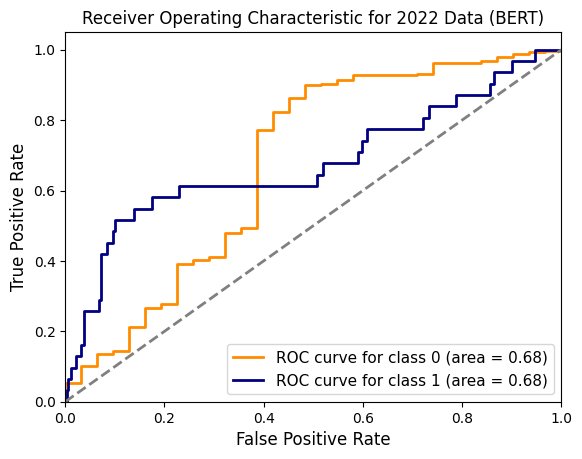

In [34]:
y_test_pred_proba_bert_df22 = best_rf_classifier_bert.predict_proba(Xbert22)
#colors for different classes
colors = cycle(['darkorange', 'navy'])

plt.figure()

for i, color in zip(range(y_test_pred_proba_bert_df22.shape[1]), colors):
    #compute ROC curve and ROC area for each class
    fpr, tpr, _ = roc_curve(ybert22 == i, y_test_pred_proba_bert_df22[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2,
             label=f'ROC curve for class {i} (area = {roc_auc:.2f})')

#plotting the diagonal line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic for 2022 Data (BERT)')
plt.legend(loc='lower right', fontsize=11)
plt.show

## Outcome analysis

Top N Feature Importances:
 BERT 2022 SBI_overig       0.088264
embedding_101    0.017715
embedding_716    0.016912
embedding_637    0.016017
PROV_X           0.016011
embedding_729    0.015568
embedding_713    0.015482
embedding_471    0.013215
embedding_487    0.012977
embedding_552    0.012901
embedding_436    0.012657
embedding_279    0.012558
embedding_9      0.012447
embedding_375    0.010895
embedding_455    0.010584
embedding_276    0.010198
embedding_266    0.010077
embedding_728    0.009837
embedding_351    0.009727
embedding_391    0.009677
dtype: float64


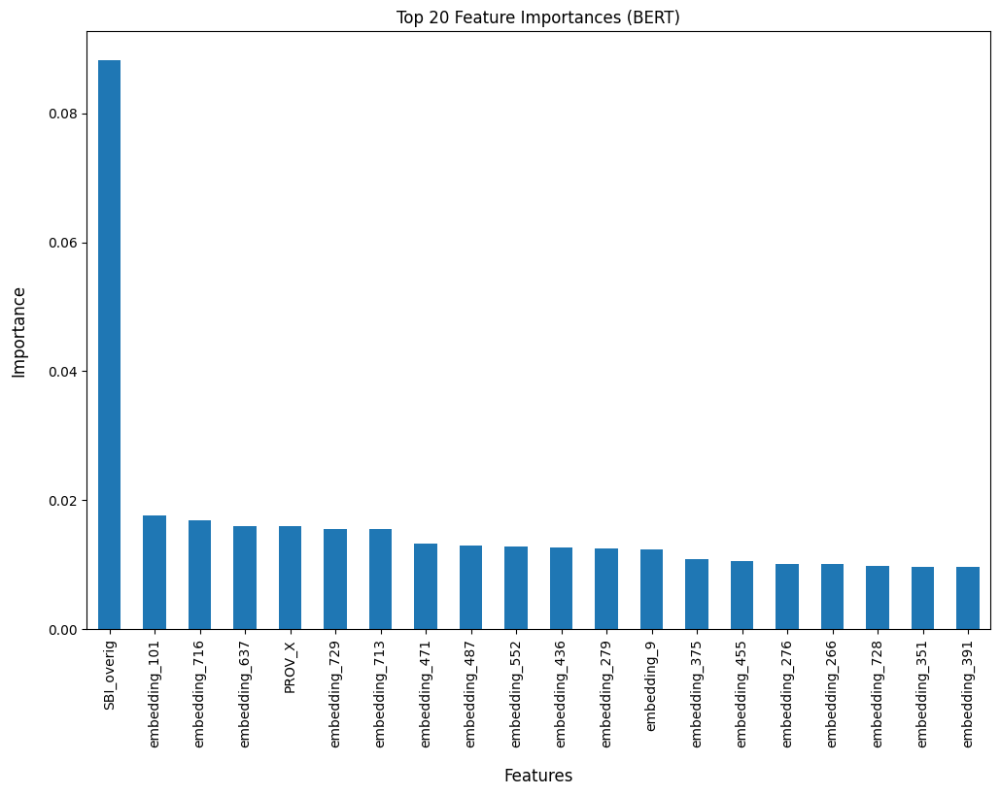

In [38]:
#get feature importances
feature_importances22bert = best_rf_classifier_bert.feature_importances_

#convert to a pandas series for plotting purposes
features22bert = Xbert22.columns if hasattr(Xbert22, 'columns') else np.arange(len(feature_importances22bert))
importance_series22BERT = pd.Series(feature_importances22bert, index=features22bert)

#sort the importances in descending order
importance_series_sorted22BERT = importance_series22BERT.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features22BERT = importance_series_sorted22BERT.head(N)

print("Top N Feature Importances:\n BERT 2022" , top_n_features22BERT)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_features22BERT.plot(kind='bar')
plt.title('Top 20 Feature Importances (BERT)')
plt.xlabel('Features',fontsize=12,labelpad=15)
plt.ylabel('Importance',fontsize=12,labelpad=15)
plt.show()

Top N Feature Importances:
 BERT 2023 SBI_overig       0.088264
embedding_101    0.017715
embedding_716    0.016912
embedding_637    0.016017
PROV_X           0.016011
embedding_729    0.015568
embedding_713    0.015482
embedding_471    0.013215
embedding_487    0.012977
embedding_552    0.012901
embedding_436    0.012657
embedding_279    0.012558
embedding_9      0.012447
embedding_375    0.010895
embedding_455    0.010584
embedding_276    0.010198
embedding_266    0.010077
embedding_728    0.009837
embedding_351    0.009727
embedding_391    0.009677
dtype: float64


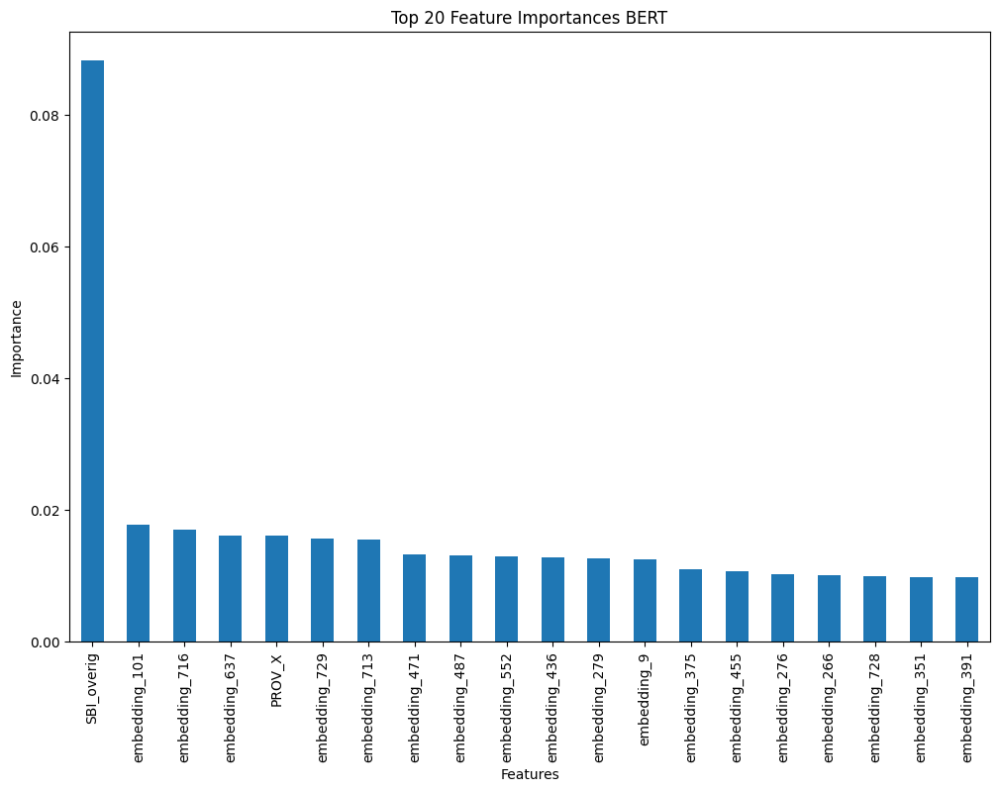

In [37]:
#get feature importances
feature_importances23bert = best_rf_classifier_bert.feature_importances_

#convert to a pandas series for plotting purposes
features23bert = Xbert23.columns if hasattr(Xbert23, 'columns') else np.arange(len(feature_importances23bert))
importance_series23BERT = pd.Series(feature_importances23bert, index=features23bert)

#sort the importances in descending order
importance_series_sorted23BERT = importance_series23BERT.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features23BERT = importance_series_sorted23BERT.head(N)

print("Top N Feature Importances:\n BERT 2023" , top_n_features23BERT)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_features23BERT.plot(kind='bar')
plt.title('Top 20 Feature Importances BERT')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

## Print mistakes

In [74]:
#2022 data
y_truebert22 = ybert22
y_predbert22= y_predbertrf22

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativesbert22 = np.where((y_truebert22 == 1) & (y_predbert22 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativesbert22)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesbert22 = Xbert22.iloc[false_negativesbert22]


mistake_indicesbert22=X_test_mistakesbert22.index
df_mistakesbert22 = df_KVK2022.loc[mistake_indicesbert22]
df_mistakesbert22

Number of false negatives (mistakes on class 1): 23


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,...,0,1,0,0,0,0,0,0,0,0
20,stichting dogma,0,stichting dogma,bevorderen kunst cultuur name mensen verstande...,2020,2,27,1,0,0,...,0,0,0,1,0,0,0,0,0,0
28,stichting streekcentrum scheerwolde,0,stichting streekcentrum scheerwo,oprichten instandhouden exploiteren gebouw sch...,1966,3,4,1,0,0,...,0,0,0,1,0,0,0,0,0,0
31,dorpsraadcooperatie meeden ua,0,dorpsraadcooperatie meeden ua,kwaliteit leefomgeving meeden waarborgen verbe...,2008,8,29,1,0,0,...,0,1,0,0,0,0,0,0,0,0
46,stichting steunpunt ouderen riethoven,0,stichting steunpunt ouderen,welzijnswerk ouderen,2011,2,18,1,1,0,...,0,0,0,1,0,0,0,0,0,0
74,jong nederland lovenbesterd,0,jong nederland lovenbesterd,jeug jongerenwerk,2011,4,20,1,0,0,...,0,0,0,1,0,0,0,0,0,0
84,stichting centrum ouderen kemphaan,0,stichting centrum ouderen,exploitatie gemeenschapshuis,2010,12,21,1,0,0,...,0,0,0,1,0,0,0,0,0,0
111,dorpshuis,0,dorpshuis,exploitatie gemeenschapshuis,2011,1,17,1,0,0,...,0,0,0,1,0,0,0,0,0,0
117,buurtvereniging flora,0,buurtvereniging flora,buurtvereniging,2011,4,18,1,0,0,...,0,0,1,0,0,0,0,0,0,0
128,speeltuinvereniging oostendam,0,speeltuinvereniging oostendam,sociaalcultureel werk,2011,5,26,1,0,0,...,0,0,1,0,0,0,0,0,0,0


In [40]:
#2023 data
y_truebert23 = ybert23
y_predbert23= y_predbertrf23

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativesbert23 = np.where((y_truebert23 == 1) & (y_predbert23 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativesbert23)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesbert23 = Xbert23.iloc[false_negativesbert23]

mistake_indicesbert23=X_test_mistakesbert23.index
print(mistake_indicesbert23)
df_mistakesbert23 = df_KVK2023.loc[mistake_indicesbert23]
df_mistakesbert23

Number of false negatives (mistakes on class 1): 25
Index([ 20,  47,  76,  97, 110, 145, 158, 168, 183, 187, 198, 223, 230, 250,
       273, 285, 288, 314, 318, 330, 338, 342, 345, 348, 349],
      dtype='int64')


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88
20,mandala,0,mandala,sociaalcultureelwerk,2011,4,26,1,0,0,...,0,0,0,1,0,0,0,0,0,0
47,cultureel welzijnscentrum chinese brug,0,cultureel welzijnscentrum chinese brug,sociaalculturele educatieve maatschappelijke a...,2013,10,4,1,0,0,...,0,0,0,1,0,0,0,0,0,0
76,ontmoetingsruimte kbo t klepke,0,ontmoetingsruimte kbo t klepke,ouderenwerk,2011,4,12,1,0,0,...,0,0,1,0,0,0,0,0,0,0
97,stichting cultuurhuys kroon,0,stichting cultuurhuys kroon,beheren exploiteren sociaal cultureel centrum,2015,1,23,1,0,0,...,0,0,0,1,0,0,0,0,0,0
110,goede herder zaal,0,goede herder zaal,ontmoetingsruimte gericht ouderenbeleid parochie,2010,8,3,1,1,0,...,0,0,0,1,0,0,0,0,0,0
145,dorpshuis poort bv,6,dorpshuis poort bv,exploitatie een meerdere verenigingsgebouwen d...,2014,7,9,1,0,0,...,1,0,0,0,0,0,0,0,0,0
158,vereniging plaatselijk belang bontebok,0,vereniging plaatselijk belang bontebok,buurt clubhuiswerk samenlevingsopbouwwerk spec...,2011,8,4,1,0,0,...,0,0,1,0,0,0,0,0,0,0
168,wijkcentrum schieringen,0,wijkcentrum schieringen,wijkcentrum afhaalpunt post nl,2011,5,3,1,0,0,...,0,0,0,1,0,0,0,0,0,0
183,verenigingsgebouw koels,0,verenigingsgebouw koels,exploitatie verenigingsgebouw exploitatie hore...,2014,4,12,1,0,0,...,0,0,0,0,1,0,0,0,0,0
187,kleine loef,0,kleine loef,exploitatie gemeenschapshuis,2011,3,15,1,0,0,...,0,0,0,1,0,0,0,0,0,0


# BERT topic

In [41]:
!pip install bertopic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 8.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86

In [42]:
from bertopic import BERTopic


In [87]:
#combine all text columns together
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_labelledBERTtopic[text_columns] = df_labelledBERTtopic[text_columns].fillna('')
df_labelledBERTtopic['combined_text'] = df_labelledBERTtopic[text_columns].apply(lambda row: ' '.join(row), axis=1)
df_labelledBERTtopic['combined_text']

0      maatschap beheer mfc tiendeveen maatschap behe...
1      aktiviteitencentrum alletahof aktiviteitencent...
2      cooperatie stationspark deurne ua cooperatie s...
3      cooperatie sustar ua cooperatie sustar ua bied...
4      jasmijnsteede centraal wonen ouderen jasmijnst...
                             ...                        
441    verenig groepsw oud ouderlandshoek vereniging ...
442    bewonersvereniging centraal wonen banier bewon...
443    stichting dorpsraad venzelderheide stichting d...
444    stichting wijkraad lovenbesterd stichting wijk...
445    stichting wijkorganisatie ring stichting wijko...
Name: combined_text, Length: 446, dtype: object

2024-06-16 15:18:20,669 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/14 [00:00<?, ?it/s]

2024-06-16 15:18:23,846 - BERTopic - Embedding - Completed ✓
2024-06-16 15:18:23,850 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:18:27,629 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:18:27,636 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:18:27,746 - BERTopic - Cluster - Completed ✓
2024-06-16 15:18:27,785 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:18:28,116 - BERTopic - Representation - Completed ✓
2024-06-16 15:18:29,054 - BERTopic - Embedding - Transforming documents to embeddings.


min_cluster_size: 5, Coherence Score: 0.47033535656234193, Number of Topics: 22


Batches:   0%|          | 0/14 [00:00<?, ?it/s]

2024-06-16 15:18:32,356 - BERTopic - Embedding - Completed ✓
2024-06-16 15:18:32,358 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:18:34,963 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:18:34,965 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:18:34,983 - BERTopic - Cluster - Completed ✓
2024-06-16 15:18:34,988 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:18:35,014 - BERTopic - Representation - Completed ✓
2024-06-16 15:18:35,201 - BERTopic - Embedding - Transforming documents to embeddings.


min_cluster_size: 10, Coherence Score: 0.452069343300714, Number of Topics: 11


Batches:   0%|          | 0/14 [00:00<?, ?it/s]

2024-06-16 15:18:38,499 - BERTopic - Embedding - Completed ✓
2024-06-16 15:18:38,502 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:18:42,178 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:18:42,181 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:18:42,208 - BERTopic - Cluster - Completed ✓
2024-06-16 15:18:42,216 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:18:42,259 - BERTopic - Representation - Completed ✓
2024-06-16 15:18:42,475 - BERTopic - Embedding - Transforming documents to embeddings.


min_cluster_size: 15, Coherence Score: 0.5706219893538894, Number of Topics: 6


Batches:   0%|          | 0/14 [00:00<?, ?it/s]

2024-06-16 15:18:46,004 - BERTopic - Embedding - Completed ✓
2024-06-16 15:18:46,007 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:18:48,625 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:18:48,628 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:18:48,646 - BERTopic - Cluster - Completed ✓
2024-06-16 15:18:48,652 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:18:48,675 - BERTopic - Representation - Completed ✓


min_cluster_size: 20, Coherence Score: 0.5909443766156136, Number of Topics: 4


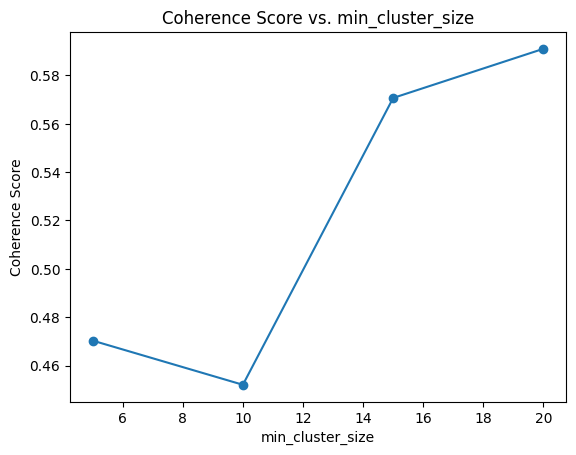

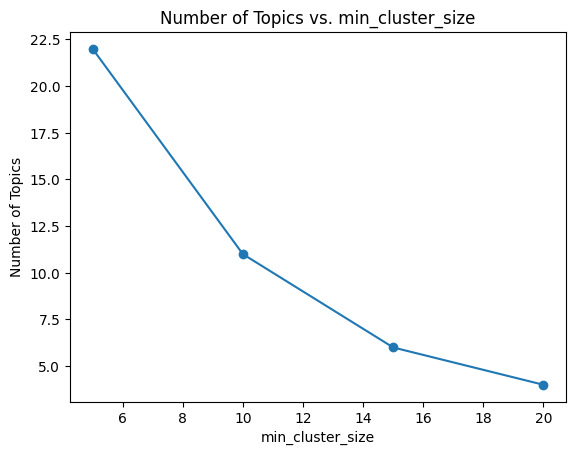

In [88]:
random.seed(42)
docs = df_labelledBERTtopic['combined_text']
#create a function to find the optimal amount of topics using the coherence score.
#this is done by adjusting the min_cluster_size of the HDBSCAN model
def calculate_coherence_score(docs, min_cluster_size):
    #create HDBSCAN model with the specified min_cluster_size
    hdbscan_model = HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

    #create BERTopic model
    topic_model = BERTopic(hdbscan_model=hdbscan_model, language="dutch", verbose=True)

    #fit the model on the documents
    topics, probs = topic_model.fit_transform(docs)

    #get topic words
    topic_words = topic_model.get_topics()

    #prepare data for coherence score
    texts = [doc.split() for doc in docs]
    topic_tokens = [[word for word, _ in topic_words[topic]] for topic in topic_words if topic != -1 and len(topic_words[topic]) > 0]

    if not topic_tokens:
      #if there are no valid topics,coherence score is 0
        return 0, len(set(topics))

    #create a dictionary and corpus needed for the coherence model
    dictionary = Dictionary(texts)
    corpus = [dictionary.doc2bow(text) for text in texts]

    #calculate coherence score
    coherence_model = CoherenceModel(topics=topic_tokens, texts=texts, dictionary=dictionary, coherence='c_v')
    coherence = coherence_model.get_coherence()
    #return the coherence score and the amount of topics for each score
    return coherence, len(set(topics))

#in a range of 5 to 20
min_cluster_sizes = range(5, 25, 5)

#iniatilize the lists for coherence scores and the number of topics
coherence_scores = []
num_topics = []


# go through the min_cluster sizes and calculate coherence for each number of topics
for min_cluster_size in min_cluster_sizes:
    coherence, n_topics = calculate_coherence_score(docs, min_cluster_size)
    coherence_scores.append(coherence)
    num_topics.append(n_topics)
    print(f"min_cluster_size: {min_cluster_size}, Coherence Score: {coherence}, Number of Topics: {n_topics}")

#plot coherence Scores
plt.plot(min_cluster_sizes, coherence_scores, marker='o')
plt.xlabel('min_cluster_size')
plt.ylabel('Coherence Score')
plt.title('Coherence Score vs. min_cluster_size')
plt.show()

#plot number of topics
plt.plot(min_cluster_sizes, num_topics, marker='o')
plt.xlabel('min_cluster_size')
plt.ylabel('Number of Topics')
plt.title('Number of Topics vs. min_cluster_size')
plt.show()


In [92]:
hdbscan_model = HDBSCAN(min_cluster_size=14, metric='euclidean', cluster_selection_method='eom')

In [93]:

#the optimal number of topics is 5 as they optimal min_cluster_size was 14
topic_model = BERTopic(language="dutch",verbose='TRUE',hdbscan_model=hdbscan_model)
docs=df_labelledBERTtopic['combined_text']
topics, probs = topic_model.fit_transform(docs)


2024-06-16 15:21:27,128 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/14 [00:00<?, ?it/s]

2024-06-16 15:21:31,589 - BERTopic - Embedding - Completed ✓
2024-06-16 15:21:31,594 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:21:38,027 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:21:38,029 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:21:38,053 - BERTopic - Cluster - Completed ✓
2024-06-16 15:21:38,060 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:21:38,096 - BERTopic - Representation - Completed ✓


In [95]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,131,-1_stichting_bv_ontwikkelen_gebied,"[stichting, bv, ontwikkelen, gebied, stellen, ...",[stichting buurt terschelling stichting buurt ...
1,0,148,0_zorg_stichting_welzijn_begeleiding,"[zorg, stichting, welzijn, begeleiding, mensen...",[stichting schouderaanschouder stichting schou...
2,1,68,1_cooperatie_leden_ua_belangen,"[cooperatie, leden, ua, belangen, cooperatieve...",[cooperatieve vereniging porcplus ba cooperati...
3,2,48,2_exploitatie_stichting_gemeenschapshuizen_gem...,"[exploitatie, stichting, gemeenschapshuizen, g...",[buurtcentrum forum buurtcentrum forum exploit...
4,3,29,3_jeugdland_jeugd_jongeren_jongerencentrum,"[jeugdland, jeugd, jongeren, jongerencentrum, ...",[vereniging dorpsbelangen annerveenschekanaal ...
5,4,22,4_buurt_ouderencentrum_buurthuis_cooperatie,"[buurt, ouderencentrum, buurthuis, cooperatie,...",[cooperatie ecodorp boekel ba cooperatie ecodo...


In [96]:
topic_representations = topic_model.topic_representations_

#create a dictionary to store the top 15 words for each topic
top_15_words_per_topic = {}

for topic, words_scores in topic_representations.items():
    #extract the top 15 words for the current topic
    top_15_words = [word for word, score in words_scores[:15]]
    top_15_words_per_topic[topic] = top_15_words

#display the top 15 words for each topic
for topic, words in top_15_words_per_topic.items():
    print(f"Topic {topic}: {words}")

Topic -1: ['stichting', 'bv', 'ontwikkelen', 'gebied', 'stellen', 'organiseren', 'werk', 'buurt', 'sport', 'dialoog']
Topic 0: ['zorg', 'stichting', 'welzijn', 'begeleiding', 'mensen', 'gebied', 'ondersteuning', 'ua', 'zorgcooperatie', 'beperking']
Topic 1: ['cooperatie', 'leden', 'ua', 'belangen', 'cooperatieve', 'ten', 'behartigen', 'uitoefenen', 'overeenkomsten', 'stoffelijke']
Topic 2: ['exploitatie', 'stichting', 'gemeenschapshuizen', 'gemeenschapshuis', 'buurtcentrum', 'buurthuis', 'vitaal', 'verhuur', 'dorp', 'huis']
Topic 3: ['jeugdland', 'jeugd', 'jongeren', 'jongerencentrum', 'jongerenwerk', 'activiteiten', 'bv', 'vereniging', 'kader', 'jeugdhuis']
Topic 4: ['buurt', 'ouderencentrum', 'buurthuis', 'cooperatie', 'ecodorp', 'oudehaske', 'wlz', 'boekel', 'stg', 'eten']


In [97]:
#get the probability distribution per topic for the rows
topic_distr, _ = topic_model.approximate_distribution(docs)

100%|██████████| 1/1 [00:00<00:00, 17.87it/s]


In [98]:
topics_df = pd.DataFrame(topic_distr, columns=[f"Probability_Topic_{i}" for i in range(topic_distr.shape[1])])
topics_df

,Probability_Topic_0,Probability_Topic_1,Probability_Topic_2,Probability_Topic_3,Probability_Topic_4
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.120514,0.879486
2,0.000000,1.000000,0.000000,0.000000,0.000000
3,0.117674,0.859533,0.000000,0.000000,0.022792
4,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
441,0.000000,0.000000,0.000000,0.000000,0.000000
442,0.000000,0.000000,1.000000,0.000000,0.000000
443,0.162994,0.000000,0.837006,0.000000,0.000000
444,0.131195,0.000000,0.868805,0.000000,0.000000


In [99]:
df_with_topics = pd.concat([df_labelledBERTtopic.reset_index(drop=True), topics_df], axis=1)

### BERTtopic for *2022*

In [100]:
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_labelledBERTtopic22[text_columns] = df_labelledBERTtopic22[text_columns].fillna('')
df_labelledBERTtopic22['combined_text'] = df_labelledBERTtopic22[text_columns].apply(lambda row: ' '.join(row), axis=1)
df_labelledBERTtopic22['combined_text']

0      scouting ernst kempengroep scouting ernst kemp...
1      cooperatie duurzaam gortel niersen ua cooperat...
2      cvve winkelcentr gagel ua cooperatieve verenig...
3      cooperatie nieuwe energie ua cooperatie nieuwe...
4      verbindingskamer verbindingskamer adviesburo g...
                             ...                        
345    mari coaching mari coaching coaching relatie c...
346    bv baekerhoes bv baekerhoes beheer exploitatie...
347    lukt beheer bv lukt beheer bv beheren stamrech...
348    stichting valere bewind stichting valere bewin...
349    bureau nab bureau nab begeleiding verwerken ro...
Name: combined_text, Length: 350, dtype: object

In [101]:
#generate topics
hdbscan_model22 = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom')
docs22 = df_labelledBERTtopic22['combined_text']
topic_model22 = BERTopic(language="dutch",verbose='TRUE',hdbscan_model=hdbscan_model22)
docs22=df_labelledBERTtopic22['combined_text']
topics, probs = topic_model22.fit_transform(docs22)


2024-06-16 15:21:56,994 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/11 [00:00<?, ?it/s]

2024-06-16 15:22:00,225 - BERTopic - Embedding - Completed ✓
2024-06-16 15:22:00,227 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:22:04,224 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:22:04,231 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:22:04,248 - BERTopic - Cluster - Completed ✓
2024-06-16 15:22:04,256 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:22:04,278 - BERTopic - Representation - Completed ✓


In [102]:
topic_model22.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,55,-1_bv_amsterdam_exploiteren_beheren,"[bv, amsterdam, exploiteren, beheren, gebied, ...",[zorgzuster nederland bv zorgzuster nederland ...
1,0,138,0_stichting_coaching_begeleiding_zorg,"[stichting, coaching, begeleiding, zorg, mense...",[saskia begeleiding zorg saskia begeleiding zo...
2,1,76,1_werk_stichting_sociaalcultureel_exploitatie,"[werk, stichting, sociaalcultureel, exploitati...",[art gallery voute art gallery voute verkoop v...
3,2,45,2_ua_leden_cooperatie_stoffelijke,"[ua, leden, cooperatie, stoffelijke, belangen,...",[duurzaam beilen ua duurzaam beilen ua stoffel...
4,3,19,3_scouting_groep_jeugd_stichting,"[scouting, groep, jeugd, stichting, scout, soc...",[scouting kardinaal mindszenty groep scouting ...
5,4,17,4_jeugd_nederland_jongerenwerk_jong,"[jeugd, nederland, jongerenwerk, jong, jongere...",[dissel dissel buurt clubhuiswerk samenlevings...


In [103]:
#get the probability distribution per topic for the rows
topic_distr22,_ = topic_model22.approximate_distribution(docs22)

100%|██████████| 1/1 [00:00<00:00, 32.24it/s]


In [104]:
topic_distr22.shape

(350, 5)

In [105]:
topics_df22 = pd.DataFrame(topic_distr22, columns=[f"Probability_Topic_{i}" for i in range(topic_distr22.shape[1])])
topics_df22

,Probability_Topic_0,Probability_Topic_1,Probability_Topic_2,Probability_Topic_3,Probability_Topic_4
0,0.000000,0.000000,0.0,1.0,0.0
1,0.000000,0.000000,1.0,0.0,0.0
2,0.000000,0.000000,1.0,0.0,0.0
3,0.000000,0.000000,1.0,0.0,0.0
4,0.215862,0.784138,0.0,0.0,0.0
...,...,...,...,...,...
345,1.000000,0.000000,0.0,0.0,0.0
346,0.000000,1.000000,0.0,0.0,0.0
347,1.000000,0.000000,0.0,0.0,0.0
348,0.606377,0.393623,0.0,0.0,0.0


In [106]:
df_with_topics22 = pd.concat([df_labelledBERTtopic22.reset_index(drop=True), topics_df22], axis=1)

### BERTtopic for *2023*


In [108]:
text_columns = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_labelledBERTtopic23[text_columns] = df_labelledBERTtopic23[text_columns].fillna('')
df_labelledBERTtopic23['combined_text'] = df_labelledBERTtopic23[text_columns].apply(lambda row: ' '.join(row), axis=1)
df_labelledBERTtopic23['combined_text']


#generate topics
hdbscan_model23 = HDBSCAN(min_cluster_size=11, metric='euclidean', cluster_selection_method='eom')
docs23 = df_labelledBERTtopic23['combined_text']
topic_model23 = BERTopic(language="dutch",verbose='TRUE',hdbscan_model=hdbscan_model23)
docs23=df_labelledBERTtopic23['combined_text']
topics, probs = topic_model23.fit_transform(docs23)
topic_model23.get_topic_info()

2024-06-16 15:22:28,113 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/11 [00:00<?, ?it/s]

2024-06-16 15:22:32,768 - BERTopic - Embedding - Completed ✓
2024-06-16 15:22:32,776 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-16 15:22:37,749 - BERTopic - Dimensionality - Completed ✓
2024-06-16 15:22:37,754 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-16 15:22:37,770 - BERTopic - Cluster - Completed ✓
2024-06-16 15:22:37,777 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-16 15:22:37,810 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,81,-1_zorg_bv_advies_kinderen,"[zorg, bv, advies, kinderen, scouting, stichti...",[ankh zorgburo ankh zorgburo bemiddelingsburea...
1,0,122,0_ua_stichting_leden_cooperatieve,"[ua, stichting, leden, cooperatieve, verenigin...",[oxbow netherlands cooperatieve ua oxbow nethe...
2,1,84,1_coaching_begeleiding_training_geven,"[coaching, begeleiding, training, geven, media...",[compas coaching training compas coaching trai...
3,2,32,2_begeleiding_zorg_care_mensen,"[begeleiding, zorg, care, mensen, beperking, g...",[rk zorg begeleiding rk zorg begeleiding jeugd...
4,3,19,3_stichting_centrum_activiteiten_vrienden,"[stichting, centrum, activiteiten, vrienden, z...",[bv centrum hofdael bv centrum hofdael facilit...
5,4,12,4_senioren_ouderen_ouderenzorg_stichting,"[senioren, ouderen, ouderenzorg, stichting, th...",[dienstencentrum senioren lemmer dienstencentr...


In [109]:
#get the probability distribution per topic for the rows
topic_distr23,_ = topic_model23.approximate_distribution(docs23)
#create dataframe with topics
topics_df23 = pd.DataFrame(topic_distr23, columns=[f"Probability_Topic_{i}" for i in range(topic_distr23.shape[1])])
topics_df23

100%|██████████| 1/1 [00:00<00:00, 27.67it/s]


,Probability_Topic_0,Probability_Topic_1,Probability_Topic_2,Probability_Topic_3,Probability_Topic_4
0,0.000000,0.082491,0.917509,0.000000,0.00000
1,0.000000,0.000000,0.000000,0.000000,0.00000
2,0.000000,0.180758,0.819242,0.000000,0.00000
3,0.000000,0.000000,0.000000,0.000000,0.00000
4,0.000000,0.000000,0.000000,0.000000,0.00000
...,...,...,...,...,...
345,0.035113,0.000000,0.000000,0.932267,0.03262
346,1.000000,0.000000,0.000000,0.000000,0.00000
347,0.000000,0.000000,1.000000,0.000000,0.00000
348,0.000000,0.000000,0.000000,0.000000,0.00000


In [110]:
df_with_topics23 = pd.concat([df_labelledBERTtopic23.reset_index(drop=True), topics_df23], axis=1)

## Start classification and tuning

In [111]:
#drop all the textual data and the topic 0, as this is a topic that is generated to detect noise
df_with_topics.drop(columns=['combined_text','HN45','H_NAAM_VOL','Probability_Topic_0','Bedrijfsomschrijving'], inplace=True)


In [112]:
df_with_topics22.drop(columns=['combined_text','HN45','H_NAAM_VOL','Probability_Topic_0','Bedrijfsomschrijving'], inplace=True)
df_with_topics23.drop(columns=['combined_text','HN45','H_NAAM_VOL','Probability_Topic_0','Bedrijfsomschrijving'], inplace=True)


In [113]:
#extract label
X_btopic = df_with_topics.drop(columns=['label'])
y_btopic = df_with_topics['label']

#split the data into training and test sets
X_trainbtopic, X_testbtopic, y_trainbtopic, y_testbtopic = train_test_split(X_btopic, y_btopic, test_size=0.25, random_state=42)

In [114]:

rf_classifier_btopic = RandomForestClassifier(n_estimators=25, random_state=42)
rf_classifier_btopic.fit(X_trainbtopic, y_trainbtopic)

#predict labels for the test data
y_pred_btopic = rf_classifier_btopic.predict(X_testbtopic)

#calculate accuracy
accuracy_btopic = accuracy_score(y_testbtopic, y_pred_btopic)
print("Accuracy (Random Forest before tuning):", accuracy_btopic)

Accuracy (Random Forest before tuning): 0.8125


In [115]:
#parameter grid
param_grid = {
    'n_estimators': [5, 15, 50, 100],
    'max_depth': [5, 10, 20, 30,40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4,5,10],
}

#create a classifier
rf_classifier_btopic = RandomForestClassifier(random_state=42)

#create a GridSearchCV object with 10 folds
grid_search_btopic = GridSearchCV(estimator=rf_classifier_btopic, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='f1')

#fit the grid search to the training data
grid_search_btopic.fit(X_trainbtopic, y_trainbtopic)

#print the best parameters found
print("Best parameters found: ", grid_search_btopic.best_params_)

#use the best estimator to make predictions
best_rf_classifier_btopic = grid_search_btopic.best_estimator_

Fitting 5 folds for each of 300 candidates, totalling 1500 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best parameters found:  {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 15}


In [116]:
#evaluate using 10-Fold Cross-Validation on the training set
cross_val_scores_btopic = cross_val_score(best_rf_classifier_btopic, X_trainbtopic, y_trainbtopic, cv=10)

#calculate and print the mean accuracy from cross-validation
mean_cross_val_accuracy_btopic = cross_val_scores_btopic.mean()
print("Mean Cross-Validation Accuracy (Random Forest after tuning):", mean_cross_val_accuracy_btopic)

#predict on the test set
y_test_pred_btopic = best_rf_classifier_btopic.predict(X_testbtopic)

#calculate accuracy on the test set
accuracy_rf_test_btopic = accuracy_score(y_testbtopic, y_test_pred_btopic)
print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_btopic)

Mean Cross-Validation Accuracy (Random Forest after tuning): 0.8713903743315508
Test Accuracy (Random Forest after tuning): 0.7767857142857143


In [117]:
#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_btopic = accuracy_score(y_testbtopic, y_test_pred_btopic)
precision_rf_test_btopic = precision_score(y_testbtopic, y_test_pred_btopic)
recall_rf_test_btopic = recall_score(y_testbtopic, y_test_pred_btopic)
f1_rf_test_btopic = f1_score(y_testbtopic, y_test_pred_btopic)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_btopic)
print("Test Precision (Random Forest after tuning):", precision_rf_test_btopic)
print("Test Recall (Random Forest after tuning):", recall_rf_test_btopic)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_btopic)

Test Accuracy (Random Forest after tuning): 0.7767857142857143
Test Precision (Random Forest after tuning): 0.7575757575757576
Test Recall (Random Forest after tuning): 0.5952380952380952
Test F1-score (Random Forest after tuning): 0.6666666666666667


In [118]:
print(classification_report(y_testbtopic, y_test_pred_btopic))

              precision    recall  f1-score   support

           0       0.78      0.89      0.83        70
           1       0.76      0.60      0.67        42

    accuracy                           0.78       112
   macro avg       0.77      0.74      0.75       112
weighted avg       0.77      0.78      0.77       112



## Classification for 2022 and 2023 test data

In [119]:
Xberttopic22 = df_with_topics22.drop(columns=['label'])
yberttopic22= df_with_topics22['label']
Xberttopic22 = Xberttopic22[X_trainbtopic.columns]

y_predberttop22= best_rf_classifier_btopic.predict(Xberttopic22)

#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_btopic22 = accuracy_score(yberttopic22, y_predberttop22)
precision_rf_test_btopic22 = precision_score(yberttopic22, y_predberttop22)
recall_rf_test_btopic22 = recall_score(yberttopic22, y_predberttop22)
f1_rf_test_btopic22 = f1_score(yberttopic22, y_predberttop22)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_btopic22)
print("Test Precision (Random Forest after tuning):", precision_rf_test_btopic22)
print("Test Recall (Random Forest after tuning):", recall_rf_test_btopic22)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_btopic22)

Test Accuracy (Random Forest after tuning): 0.84
Test Precision (Random Forest after tuning): 0.1794871794871795
Test Recall (Random Forest after tuning): 0.22580645161290322
Test F1-score (Random Forest after tuning): 0.2


In [120]:
print(classification_report(yberttopic22, y_predberttop22))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91       319
           1       0.18      0.23      0.20        31

    accuracy                           0.84       350
   macro avg       0.55      0.56      0.56       350
weighted avg       0.86      0.84      0.85       350



In [121]:
Xberttopic23 = df_with_topics23.drop(columns=['label'])
yberttopic23= df_with_topics23['label']
Xberttopic23 = Xberttopic23[X_trainbtopic.columns]


In [122]:
y_predberttop23= best_rf_classifier_btopic.predict(Xberttopic23)


#calculate accuracy, precision, recall, and F1-score on the test set
accuracy_rf_test_btopic23 = accuracy_score(yberttopic23, y_predberttop23)
precision_rf_test_btopic23 = precision_score(yberttopic23, y_predberttop23)
recall_rf_test_btopic23 = recall_score(yberttopic23, y_predberttop23)
f1_rf_test_btopic23 = f1_score(yberttopic23, y_predberttop23)

print("Test Accuracy (Random Forest after tuning):", accuracy_rf_test_btopic23)
print("Test Precision (Random Forest after tuning):", precision_rf_test_btopic23)
print("Test Recall (Random Forest after tuning):", recall_rf_test_btopic23)
print("Test F1-score (Random Forest after tuning):", f1_rf_test_btopic23)

Test Accuracy (Random Forest after tuning): 0.8857142857142857
Test Precision (Random Forest after tuning): 0.15
Test Recall (Random Forest after tuning): 0.11538461538461539
Test F1-score (Random Forest after tuning): 0.13043478260869565


In [123]:
print(classification_report(yberttopic23, y_predberttop23))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       324
           1       0.15      0.12      0.13        26

    accuracy                           0.89       350
   macro avg       0.54      0.53      0.53       350
weighted avg       0.87      0.89      0.88       350



## Outcome analysis



<function matplotlib.pyplot.show(close=None, block=None)>

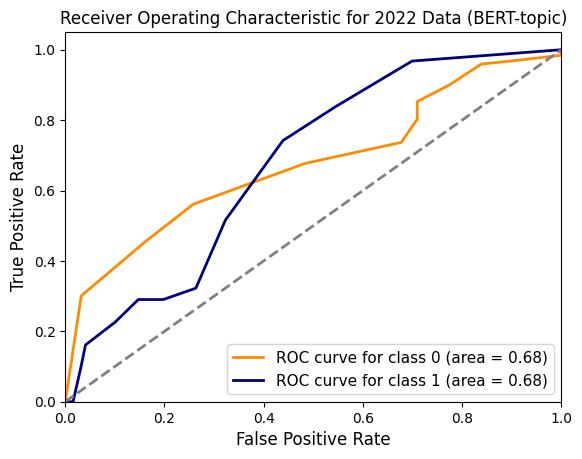

In [124]:
y_test_pred_proba_berttop_df22 = best_rf_classifier_btopic.predict_proba(Xberttopic22)

#colors for different classes
colors = cycle(['darkorange', 'navy'])

plt.figure()

for i, color in zip(range(y_test_pred_proba_berttop_df22.shape[1]), colors):
    #compute ROC curve and ROC area for each class
    fpr, tpr, _ = roc_curve(yberttopic22 == i, y_test_pred_proba_berttop_df22[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2,
             label=f'ROC curve for class {i} (area = {roc_auc:.2f})')

#plotting the diagonal line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic for 2022 Data (BERT-topic)')
plt.legend(loc='lower right', fontsize=11)
plt.show

Top N Feature Importances:
 BERTopic 2022 SBI_overig             0.165141
INSCHR_DAT_JAAR        0.110849
Probability_Topic_2    0.080443
INSCHR_DAT_DAG         0.074645
INSCHR_DAT_MAAND       0.066341
PROV_X                 0.065006
rechtsvorm_61          0.054590
Probability_Topic_4    0.053070
Probability_Topic_1    0.037609
W_P_TOTAAL             0.027070
SBI_94997              0.023851
SBI_88993              0.020499
SBI_88999              0.017560
Probability_Topic_3    0.017395
PROV_G                 0.017173
rechtsvorm_74          0.015395
rechtsvorm_1           0.014692
PROV_P                 0.014337
PROV_K                 0.013437
rechtsvorm_41          0.012290
dtype: float64


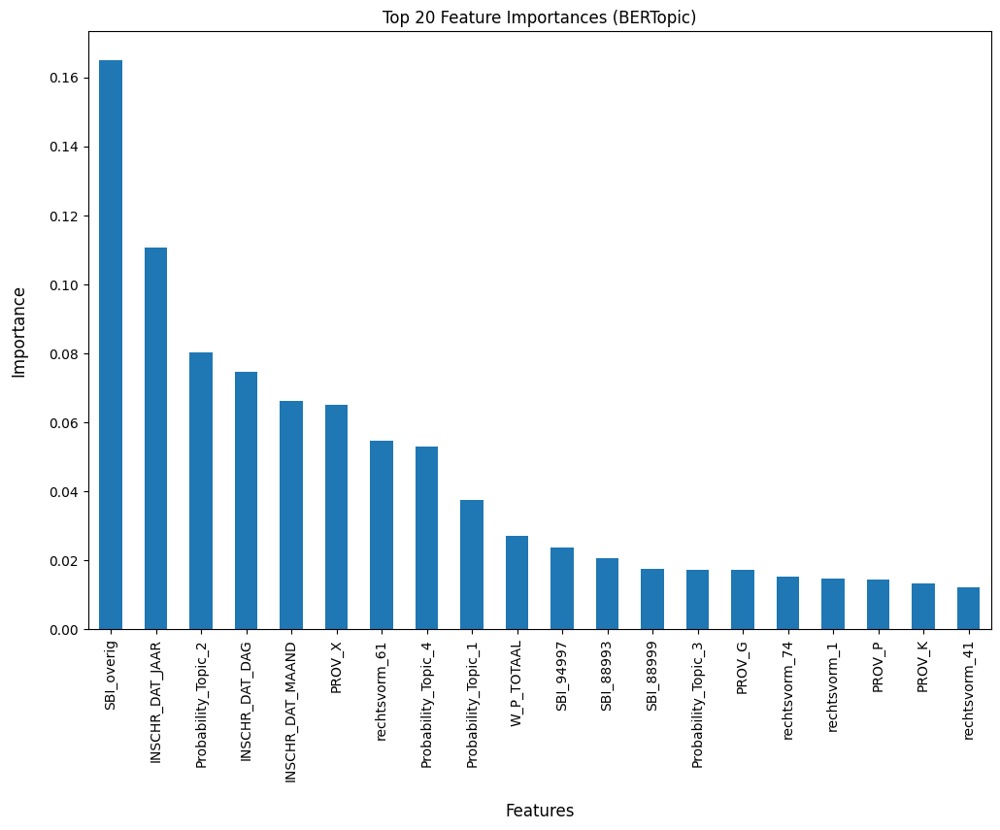

In [136]:
#get feature importances
feature_importances22bertopic = best_rf_classifier_btopic.feature_importances_

#convert to a pandas series for plotting purposes
features22bertopic = Xberttopic22.columns if hasattr(Xberttopic22, 'columns') else np.arange(len(feature_importances22bertopic))
importance_series22BERTopic = pd.Series(feature_importances22bertopic, index=features22bertopic)

#sort the importances in descending order
importance_series_sorted22BERTopic = importance_series22BERTopic.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features22BERTopic = importance_series_sorted22BERTopic.head(N)

print("Top N Feature Importances:\n BERTopic 2022" , top_n_features22BERTopic)

#plot the top 20 feature importances
plt.figure(figsize=(12, 8))
top_n_features22BERTopic.plot(kind='bar')
plt.title('Top 20 Feature Importances (BERTopic)')
plt.xlabel('Features',fontsize=12,labelpad=16)
plt.ylabel('Importance',fontsize=12,labelpad=16)
plt.show()

Top N Feature Importances:
 BERTopic 2023 SBI_overig             0.165141
INSCHR_DAT_JAAR        0.110849
Probability_Topic_2    0.080443
INSCHR_DAT_DAG         0.074645
INSCHR_DAT_MAAND       0.066341
PROV_X                 0.065006
rechtsvorm_61          0.054590
Probability_Topic_4    0.053070
Probability_Topic_1    0.037609
W_P_TOTAAL             0.027070
SBI_94997              0.023851
SBI_88993              0.020499
SBI_88999              0.017560
Probability_Topic_3    0.017395
PROV_G                 0.017173
rechtsvorm_74          0.015395
rechtsvorm_1           0.014692
PROV_P                 0.014337
PROV_K                 0.013437
rechtsvorm_41          0.012290
dtype: float64


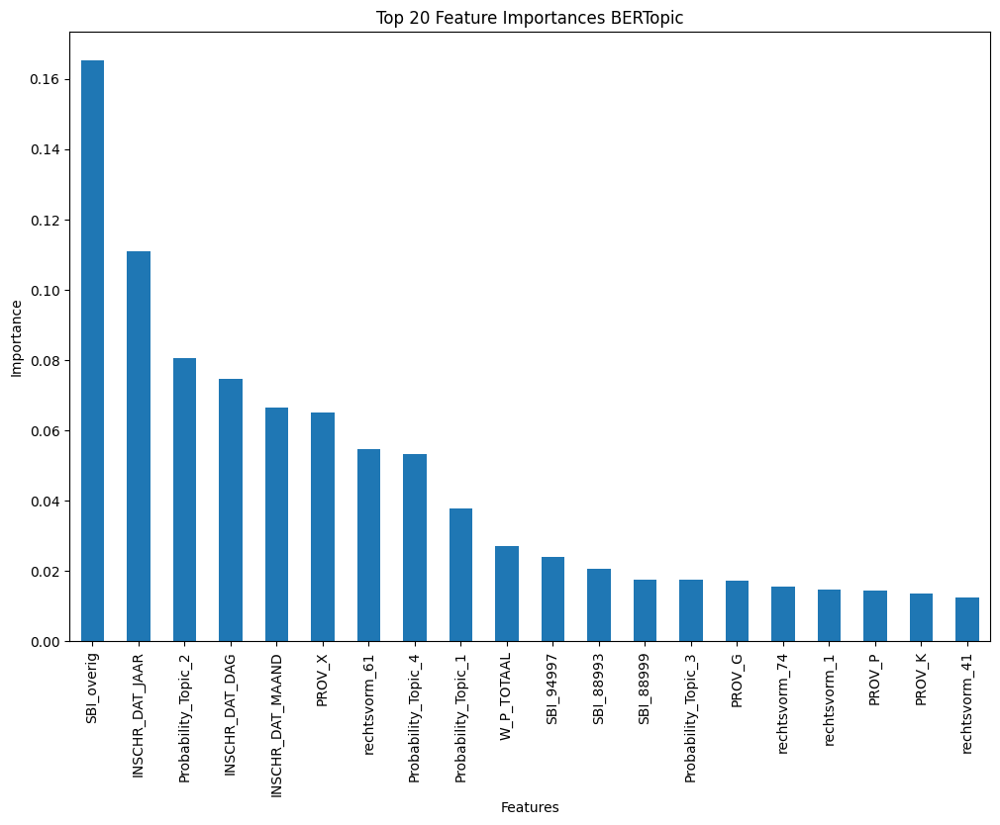

In [127]:
#get feature importances
feature_importances23bertopic = best_rf_classifier_btopic.feature_importances_

#convert to a pandas series for plotting purposes
features23bertopic = Xberttopic23.columns if hasattr(Xberttopic23, 'columns') else np.arange(len(feature_importances23bertopic))
importance_series23BERTopic = pd.Series(feature_importances23bertopic, index=features23bertopic)

#sort the importances in descending order
importance_series_sorted23BERTopic = importance_series23BERTopic.sort_values(ascending=False)

#select the top 20 most important features
N = 20
top_n_features23BERTopic = importance_series_sorted23BERTopic.head(N)

print("Top N Feature Importances:\n BERTopic 2023" , top_n_features23BERTopic)

#plot the top N feature importances
plt.figure(figsize=(12, 8))
top_n_features23BERTopic.plot(kind='bar')
plt.title('Top 20 Feature Importances BERTopic')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

In [128]:
#2022 data
y_truebertopic22 = yberttopic22
y_predbertopic22= y_predberttop22


#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativesbertopic22 = np.where((y_truebertopic22 == 1) & (y_predbertopic22 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativesbertopic22)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesbertopic22 = Xberttopic22.iloc[false_negativesbertopic22]

mistake_indicesbertopic22=X_test_mistakesbertopic22.index

df_mistakesbertopic22 = df_KVK2022.loc[mistake_indicesbertopic22]
df_mistakesbertopic22

Number of false negatives (mistakes on class 1): 24


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88
20,stichting dogma,0,stichting dogma,bevorderen kunst cultuur name mensen verstande...,2020,2,27,1,0,0,...,0,0,0,1,0,0,0,0,0,0
31,dorpsraadcooperatie meeden ua,0,dorpsraadcooperatie meeden ua,kwaliteit leefomgeving meeden waarborgen verbe...,2008,8,29,1,0,0,...,0,1,0,0,0,0,0,0,0,0
46,stichting steunpunt ouderen riethoven,0,stichting steunpunt ouderen,welzijnswerk ouderen,2011,2,18,1,1,0,...,0,0,0,1,0,0,0,0,0,0
50,czaar,0,czaar,sociaalcultureel werk,2010,12,29,1,0,0,...,0,0,0,1,0,0,0,0,0,0
84,stichting centrum ouderen kemphaan,0,stichting centrum ouderen,exploitatie gemeenschapshuis,2010,12,21,1,0,0,...,0,0,0,1,0,0,0,0,0,0
89,buurtvereniging st isidorus,0,buurtvereniging st isidorus,buurtvereniging,2011,1,12,1,0,0,...,0,0,1,0,0,0,0,0,0,0
102,buurthuis wel,0,buurthuis wel,buurt clubhuis werk samenlevingsopbouwwerk,2010,10,11,1,0,0,...,0,0,0,1,0,0,0,0,0,0
111,dorpshuis,0,dorpshuis,exploitatie gemeenschapshuis,2011,1,17,1,0,0,...,0,0,0,1,0,0,0,0,0,0
117,buurtvereniging flora,0,buurtvereniging flora,buurtvereniging,2011,4,18,1,0,0,...,0,0,1,0,0,0,0,0,0,0
126,st centrale dorpenraad landelijk noord,0,st centrale dorpenraad landelij,sociaalcultureel werk,2011,1,19,1,0,0,...,0,0,0,1,0,0,0,0,0,0


In [129]:
#2023 data

y_truebertopic23 = yberttopic23
y_predbertopic23= y_predberttop23

#find the indices where the true label is 1 but the predicted label is 0 (false negatives)
false_negativesbertopic23 = np.where((y_truebertopic23 == 1) & (y_predbertopic23 == 0))[0]

#print the number of mistakes
print(f"Number of false negatives (mistakes on class 1): {len(false_negativesbertopic23)}")

#extract the corresponding instances from X_test where the mistakes occurred
X_test_mistakesbertopic23 = Xberttopic23.iloc[false_negativesbertopic23]


mistake_indicesbertopic23=X_test_mistakesbertopic23.index

df_mistakesbertopic23 = df_KVK2023.loc[mistake_indicesbertopic23]
df_mistakesbertopic23

Number of false negatives (mistakes on class 1): 23


,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,...,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88
20,mandala,0,mandala,sociaalcultureelwerk,2011,4,26,1,0,0,...,0,0,0,1,0,0,0,0,0,0
47,cultureel welzijnscentrum chinese brug,0,cultureel welzijnscentrum chinese brug,sociaalculturele educatieve maatschappelijke a...,2013,10,4,1,0,0,...,0,0,0,1,0,0,0,0,0,0
76,ontmoetingsruimte kbo t klepke,0,ontmoetingsruimte kbo t klepke,ouderenwerk,2011,4,12,1,0,0,...,0,0,1,0,0,0,0,0,0,0
97,stichting cultuurhuys kroon,0,stichting cultuurhuys kroon,beheren exploiteren sociaal cultureel centrum,2015,1,23,1,0,0,...,0,0,0,1,0,0,0,0,0,0
145,dorpshuis poort bv,6,dorpshuis poort bv,exploitatie een meerdere verenigingsgebouwen d...,2014,7,9,1,0,0,...,1,0,0,0,0,0,0,0,0,0
158,vereniging plaatselijk belang bontebok,0,vereniging plaatselijk belang bontebok,buurt clubhuiswerk samenlevingsopbouwwerk spec...,2011,8,4,1,0,0,...,0,0,1,0,0,0,0,0,0,0
168,wijkcentrum schieringen,0,wijkcentrum schieringen,wijkcentrum afhaalpunt post nl,2011,5,3,1,0,0,...,0,0,0,1,0,0,0,0,0,0
183,verenigingsgebouw koels,0,verenigingsgebouw koels,exploitatie verenigingsgebouw exploitatie hore...,2014,4,12,1,0,0,...,0,0,0,0,1,0,0,0,0,0
187,kleine loef,0,kleine loef,exploitatie gemeenschapshuis,2011,3,15,1,0,0,...,0,0,0,1,0,0,0,0,0,0
198,skc leemhof,0,skc leemhof,exploitatie gemeenschapshuizen,2010,12,28,1,0,0,...,0,0,0,1,0,0,0,0,0,0


# Error analysis of all text representions

In [ ]:
#misclassifications by all classifiers except Word2Vec
indices_of_interest = [ 76, 97, 110, 223, 250, 273, 285, 314, 330, 338]

#extract the rows based on these indices and store in a new DataFrame
df_mistakes_all = df_KVK2023.loc[indices_of_interest]
pd.set_option('display.max_columns', None)

#display the extracted DataFrame
df_mistakes_all

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,SBI_88992,SBI_88993,SBI_88999,SBI_94991,SBI_94992,SBI_94993,SBI_94994,SBI_94995,SBI_94996,SBI_94997,SBI_overig,PROV_A,PROV_B,PROV_D,PROV_E,PROV_G,PROV_H,PROV_K,PROV_L,PROV_M,PROV_P,PROV_S,PROV_X,rechtsvorm_1,rechtsvorm_11,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,Kolom1,Kolom2,Kolom3,Kolom4,Kolom5,Kolom6,Kolom7,Kolom8,Kolom9,Kolom10,Kolom11,Kolom12,Kolom13,Kolom14,Kolom15,Kolom16,Kolom17,Kolom18,Kolom19,Kolom20,Kolom21,Kolom22,Kolom23,Kolom24,Kolom25,Kolom26,Kolom27,Kolom28,Kolom29,Kolom30,Kolom31,Kolom32,Kolom33,Kolom34,Kolom35,Kolom36,Kolom37,Kolom38,Kolom39,Kolom40,Kolom41,Kolom42,Kolom43,Kolom44,Kolom45,Kolom46,Kolom47,Kolom48,Kolom49,Kolom50,Kolom51,Kolom52,Kolom53,Kolom54,Kolom55,Kolom56,Kolom57,Kolom58,Kolom59,Kolom60,Kolom61,Kolom62,Kolom63,Kolom64,Kolom65,Kolom66,Kolom67,Kolom68,Kolom69,Kolom70,Kolom71,Kolom72,Kolom73,Kolom74,Kolom75,Kolom76,Kolom77,Kolom78,Kolom79,Kolom80,Kolom81,Kolom82,Kolom83,Kolom84,Kolom85,Kolom86,Kolom87,Kolom88,Kolom89,Kolom90,Kolom91,Kolom92,Kolom93,Kolom94,Kolom95,Kolom96,Kolom97,Kolom98,Kolom99,Kolom100,Kolom101,Kolom102,Kolom103,Kolom104,Kolom105,Kolom106,Kolom107,Kolom108,Kolom109,Kolom110,Kolom111,Kolom112,Kolom113,Kolom114,Kolom115,Kolom116,Kolom117,Kolom118,Kolom119,Kolom120,Kolom121,Kolom122,Kolom123,Kolom124,Kolom125,Kolom126,Kolom127,Kolom128,Kolom129,Kolom130,Kolom131,Kolom132,Kolom133,Kolom134,Kolom135,Kolom136,Kolom137,Kolom138,Kolom139,Kolom140,Kolom141,Kolom142,Kolom143,Kolom144,Kolom145,Kolom146,Kolom147,Kolom148,Kolom149,Kolom150,Kolom151,Kolom152,Kolom153,Kolom154,Kolom155,Kolom156,Kolom157,Kolom158,Kolom159,Kolom160,Kolom161,Kolom162,Kolom163,Kolom164,Kolom165,Kolom166,Kolom167,Kolom168,Kolom169,Kolom170,Kolom171,Kolom172,Kolom173,Kolom174,Kolom175,Kolom176,Kolom177,Kolom178,Kolom179,Kolom180,Kolom181,Kolom182,Kolom183,Kolom184,Kolom185,Kolom186,Kolom187,Kolom188,Kolom189,Kolom190,Kolom191,Kolom192,Kolom193,Kolom194,Kolom195,Kolom196,Kolom197,Kolom198,Kolom199,Kolom200,Kolom201,Kolom202,Kolom203,Kolom204,Kolom205,Kolom206,Kolom207,Kolom208,Kolom209,Kolom210,Kolom211,Kolom212,Kolom213,Kolom214,Kolom215,Kolom216,Kolom217,Kolom218,Kolom219,Kolom220,Kolom221,Kolom222,Kolom223,Kolom224,Kolom225,Kolom226,Kolom227,Kolom228,Kolom229,Kolom230,Kolom231,Kolom232,Kolom233,Kolom234,Kolom235,Kolom236,Kolom237,Kolom238,Kolom239,Kolom240,Kolom241,Kolom242,Kolom243,Kolom244,Kolom245,Kolom246,Kolom247,Kolom248,Kolom249,Kolom250,Kolom251,Kolom252,Kolom253,Kolom254,Kolom255,Kolom256,Kolom257,Kolom258,Kolom259,Kolom260,Kolom261,Kolom262,Kolom263,Kolom264,Kolom265,Kolom266,Kolom267,Kolom268,Kolom269,Kolom270,Kolom271,Kolom272,Kolom273,Kolom274,Kolom275,Kolom276,Kolom277,Kolom278,Kolom279,Kolom280,Kolom281,Kolom282,Kolom283,Kolom284,Kolom285,Kolom286,Kolom287,Kolom288,Kolom289,Kolom290,Kolom291,Kolom292,Kolom293,Kolom294,Kolom295,Kolom296,Kolom297,Kolom298,Kolom299,Kolom300,Kolom301,Kolom302,Kolom303,Kolom304,Kolom305,Kolom306,Kolom307,Kolom308,Kolom309,Kolom310,Kolom311,Kolom312,Kolom313,Kolom314,Kolom315,Kolom316,Kolom317,Kolom318,Kolom319,Kolom320,Kolom321,Kolom322,Kolom323,Kolom324,Kolom325,Kolom326,Kolom327,Kolom328,Kolom329,Kolom330,Kolom331,Kolom332,Kolom333,Kolom334,Kolom335,Kolom336,Kolom337,Kolom338,Kolom339,Kolom340,Kolom341,Kolom342,Kolom343,Kolom344,Kolom345,Kolom346,Kolom347,Kolom348,Kolom349,Kolom350,Kolom351,Kolom352,Kolom353,Kolom354,Kolom355,Kolom356,Kolom357,Kolom358,Kolom359,Kolom360,Kolom361,Kolom362,Kolom363,Kolom364,Kolom365,Kolom366,Kolom367,Kolom368,Kolom369,Kolom370,Kolom371,Kolom372,Kolom373,Kolom374,Kolom375,Kolom376,Kolom377,Kolom378,Kolom379,Kolom380,Kolom381,Kolom382,Kolom383,Kolom384,Kolom385,Kolom386,Kolom387,Kolom388,Kolom389,Kolom390,Kolom391,Kolom392,Kolom393,Kolom394,Kolom395,Kolom396,Kolom397,Kolom398,Kolom399,Kolom400,Kolom401,Kolom402,Ko

In [ ]:
#misclassifications of Word2vec
indices_of_interest = [1, 46, 50, 74, 126, 140, 176, 227, 238]


#extract the rows based on these indices and store in a new DataFrame
df_mistakes_w2v = df_KVK2022.loc[indices_of_interest]
pd.set_option('display.max_columns', None)

#display the extracted DataFrame
df_mistakes_w2v

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,SBI_88992,SBI_88993,SBI_88999,SBI_94991,SBI_94992,SBI_94993,SBI_94994,SBI_94995,SBI_94996,SBI_94997,SBI_overig,PROV_A,PROV_B,PROV_D,PROV_E,PROV_G,PROV_H,PROV_K,PROV_L,PROV_M,PROV_P,PROV_S,PROV_X,rechtsvorm_1,rechtsvorm_11,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88
1,cooperatie duurzaam gortel niersen ua,0,cooperatie duurzaam gortel niers,bijdragen verduurzaming samenleving facetten g...,2019,12,24,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
46,stichting steunpunt ouderen riethoven,0,stichting steunpunt ouderen,welzijnswerk ouderen,2011,2,18,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
50,czaar,0,czaar,sociaalcultureel werk,2010,12,29,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
74,jong nederland lovenbesterd,0,jong nederland lovenbesterd,jeug jongerenwerk,2011,4,20,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
126,st centrale dorpenraad landelijk noord,0,st centrale dorpenraad landelij,sociaalcultureel werk,2011,1,19,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
140,t dorpshuus,0,t dorpshuus,sociaalcultureel werk,2012,3,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
176,dorpscentrum d ouw school,0,dorpscentrum d ouw school,lokaalruimte alle plaatselijke verenigingen ma...,2010,8,3,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
227,seniorensocieteit st jozef,0,seniorensocieteit st jozef,bejaardenvereniging,2010,10,11,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
238,wijkver oosterpark,0,wijkver oosterpark,sociaalcultureel werk,2011,5,4,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
#indices misclassifications made by BERT+BERTopic
indices_of_interest = [318,342,345,348,349]


#extract the rows based on these indices and store in a new DataFrame
df_mistakesbertopic2023 = df_KVK2023.loc[indices_of_interest]
pd.set_option('display.max_columns', None)

df_mistakesbertopic2023

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,label,SBI_88102,SBI_88103,SBI_88992,SBI_88993,SBI_88999,SBI_94991,SBI_94992,SBI_94993,SBI_94994,SBI_94995,SBI_94996,SBI_94997,SBI_overig,PROV_A,PROV_B,PROV_D,PROV_E,PROV_G,PROV_H,PROV_K,PROV_L,PROV_M,PROV_P,PROV_S,PROV_X,rechtsvorm_1,rechtsvorm_11,rechtsvorm_41,rechtsvorm_61,rechtsvorm_71,rechtsvorm_74,rechtsvorm_overig,rechtsvorm_7,rechtsvorm_21,rechtsvorm_70,rechtsvorm_72,rechtsvorm_88,Kolom1,Kolom2,Kolom3,Kolom4,Kolom5,Kolom6,Kolom7,Kolom8,Kolom9,Kolom10,Kolom11,Kolom12,Kolom13,Kolom14,Kolom15,Kolom16,Kolom17,Kolom18,Kolom19,Kolom20,Kolom21,Kolom22,Kolom23,Kolom24,Kolom25,Kolom26,Kolom27,Kolom28,Kolom29,Kolom30,Kolom31,Kolom32,Kolom33,Kolom34,Kolom35,Kolom36,Kolom37,Kolom38,Kolom39,Kolom40,Kolom41,Kolom42,Kolom43,Kolom44,Kolom45,Kolom46,Kolom47,Kolom48,Kolom49,Kolom50,Kolom51,Kolom52,Kolom53,Kolom54,Kolom55,Kolom56,Kolom57,Kolom58,Kolom59,Kolom60,Kolom61,Kolom62,Kolom63,Kolom64,Kolom65,Kolom66,Kolom67,Kolom68,Kolom69,Kolom70,Kolom71,Kolom72,Kolom73,Kolom74,Kolom75,Kolom76,Kolom77,Kolom78,Kolom79,Kolom80,Kolom81,Kolom82,Kolom83,Kolom84,Kolom85,Kolom86,Kolom87,Kolom88,Kolom89,Kolom90,Kolom91,Kolom92,Kolom93,Kolom94,Kolom95,Kolom96,Kolom97,Kolom98,Kolom99,Kolom100,Kolom101,Kolom102,Kolom103,Kolom104,Kolom105,Kolom106,Kolom107,Kolom108,Kolom109,Kolom110,Kolom111,Kolom112,Kolom113,Kolom114,Kolom115,Kolom116,Kolom117,Kolom118,Kolom119,Kolom120,Kolom121,Kolom122,Kolom123,Kolom124,Kolom125,Kolom126,Kolom127,Kolom128,Kolom129,Kolom130,Kolom131,Kolom132,Kolom133,Kolom134,Kolom135,Kolom136,Kolom137,Kolom138,Kolom139,Kolom140,Kolom141,Kolom142,Kolom143,Kolom144,Kolom145,Kolom146,Kolom147,Kolom148,Kolom149,Kolom150,Kolom151,Kolom152,Kolom153,Kolom154,Kolom155,Kolom156,Kolom157,Kolom158,Kolom159,Kolom160,Kolom161,Kolom162,Kolom163,Kolom164,Kolom165,Kolom166,Kolom167,Kolom168,Kolom169,Kolom170,Kolom171,Kolom172,Kolom173,Kolom174,Kolom175,Kolom176,Kolom177,Kolom178,Kolom179,Kolom180,Kolom181,Kolom182,Kolom183,Kolom184,Kolom185,Kolom186,Kolom187,Kolom188,Kolom189,Kolom190,Kolom191,Kolom192,Kolom193,Kolom194,Kolom195,Kolom196,Kolom197,Kolom198,Kolom199,Kolom200,Kolom201,Kolom202,Kolom203,Kolom204,Kolom205,Kolom206,Kolom207,Kolom208,Kolom209,Kolom210,Kolom211,Kolom212,Kolom213,Kolom214,Kolom215,Kolom216,Kolom217,Kolom218,Kolom219,Kolom220,Kolom221,Kolom222,Kolom223,Kolom224,Kolom225,Kolom226,Kolom227,Kolom228,Kolom229,Kolom230,Kolom231,Kolom232,Kolom233,Kolom234,Kolom235,Kolom236,Kolom237,Kolom238,Kolom239,Kolom240,Kolom241,Kolom242,Kolom243,Kolom244,Kolom245,Kolom246,Kolom247,Kolom248,Kolom249,Kolom250,Kolom251,Kolom252,Kolom253,Kolom254,Kolom255,Kolom256,Kolom257,Kolom258,Kolom259,Kolom260,Kolom261,Kolom262,Kolom263,Kolom264,Kolom265,Kolom266,Kolom267,Kolom268,Kolom269,Kolom270,Kolom271,Kolom272,Kolom273,Kolom274,Kolom275,Kolom276,Kolom277,Kolom278,Kolom279,Kolom280,Kolom281,Kolom282,Kolom283,Kolom284,Kolom285,Kolom286,Kolom287,Kolom288,Kolom289,Kolom290,Kolom291,Kolom292,Kolom293,Kolom294,Kolom295,Kolom296,Kolom297,Kolom298,Kolom299,Kolom300,Kolom301,Kolom302,Kolom303,Kolom304,Kolom305,Kolom306,Kolom307,Kolom308,Kolom309,Kolom310,Kolom311,Kolom312,Kolom313,Kolom314,Kolom315,Kolom316,Kolom317,Kolom318,Kolom319,Kolom320,Kolom321,Kolom322,Kolom323,Kolom324,Kolom325,Kolom326,Kolom327,Kolom328,Kolom329,Kolom330,Kolom331,Kolom332,Kolom333,Kolom334,Kolom335,Kolom336,Kolom337,Kolom338,Kolom339,Kolom340,Kolom341,Kolom342,Kolom343,Kolom344,Kolom345,Kolom346,Kolom347,Kolom348,Kolom349,Kolom350,Kolom351,Kolom352,Kolom353,Kolom354,Kolom355,Kolom356,Kolom357,Kolom358,Kolom359,Kolom360,Kolom361,Kolom362,Kolom363,Kolom364,Kolom365,Kolom366,Kolom367,Kolom368,Kolom369,Kolom370,Kolom371,Kolom372,Kolom373,Kolom374,Kolom375,Kolom376,Kolom377,Kolom378,Kolom379,Kolom380,Kolom381,Kolom382,Kolom383,Kolom384,Kolom385,Kolom386,Kolom387,Kolom388,Kolom389,Kolom390,Kolom391,Kolom392,Kolom393,Kolom394,Kolom395,Kolom396,Kolom397,Kolom398,Kolom399,Kolom400,Kolom401,Kolom402,Ko

# Plotting F1-scores of all models

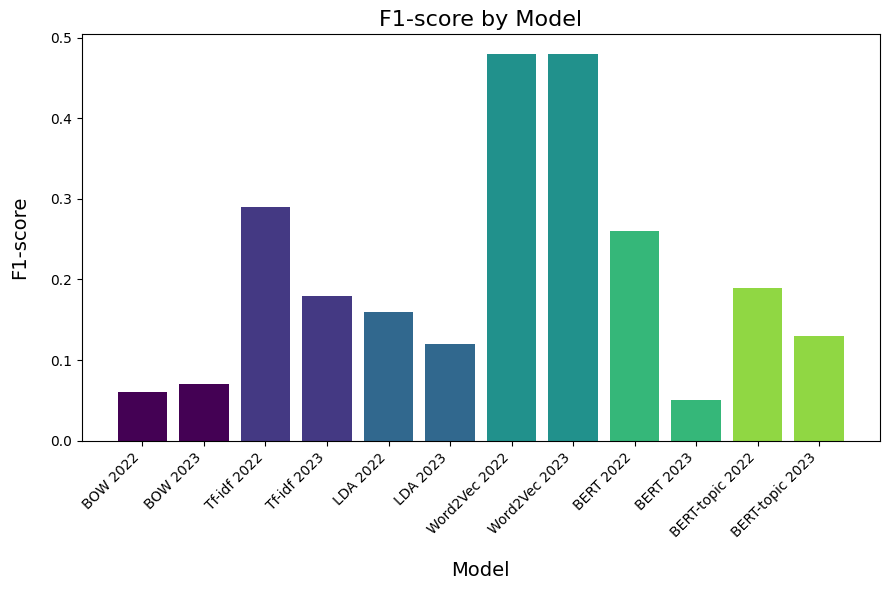

In [135]:
#data
models = [
    'BOW 2022', 'BOW 2023', 'Tf-idf 2022', 'Tf-idf 2023',
    'LDA 2022', 'LDA 2023', 'Word2Vec 2022', 'Word2Vec 2023',
    'BERT 2022', 'BERT 2023', 'BERT-topic 2022', 'BERT-topic 2023'
]
f1_scores = [0.06, 0.07, 0.29, 0.18, 0.16, 0.12, 0.48, 0.48, 0.26, 0.05, 0.19, 0.13]

#generate colors using a colormap
color_map = plt.cm.viridis
num_models = len(models) // 2  #since we have pairs of 'Model 2022' and 'Model 2023'
colors = [color_map(i / num_models) for i in range(num_models)]

#create a color dictionary based on model type
color_dict = {}
for i, model in enumerate(models):
    model_type = model.split()[0]  #extract the model type (
    if model_type not in color_dict:
        color_dict[model_type] = colors[len(color_dict)]

#plotting
plt.figure(figsize=(9, 6))

bars = []
for i, model in enumerate(models):
    model_type = model.split()[0]
    color = color_dict[model_type]
    bar = plt.bar(model, f1_scores[i], color=color)
    bars.append(bar)

#rotate the x-axis labels 
plt.xticks(rotation=45, ha='right')

plt.xlabel('Model', labelpad=15, fontsize=14)
plt.ylabel('F1-score',labelpad=15, fontsize=14)
plt.title('F1-score by Model', fontsize=16)

plt.tight_layout()
plt.show()

# Final classification of 2022 + 2023 data with Word2Vec

In [30]:
df_KVKfinal2022

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,...,rechtsvorm_21,rechtsvorm_41,rechtsvorm_61,rechtsvorm_70,rechtsvorm_71,rechtsvorm_72,rechtsvorm_74,rechtsvorm_88,rechtsvorm_overig,combined_text
0,wijkvereniging watertoren,0,wijkvereniging watertoren,dagbesteding,2017,7,31,1,0,0,...,0,0,0,0,1,0,0,0,0,wijkvereniging watertoren wijkvereniging water...
1,dienstverleningsbedrijf kromkamp,2,dienstverleningsbedrijf kromkamp,verzorgende ig masseuse chauffeursdiensten ver...,2007,6,12,1,0,0,...,0,0,0,0,0,0,0,0,0,dienstverleningsbedrijf kromkamp dienstverleni...
2,wijz,25,wijz,instelling actief terrein bevorderen welzijn o...,1990,12,28,1,0,0,...,0,0,0,0,0,0,1,0,0,wijz wijz instelling actief terrein bevorderen...
3,kbo,0,kbo,welzijnswerk ouderen,2011,3,8,1,0,0,...,0,0,0,0,1,0,0,0,0,kbo kbo welzijnswerk ouderen
4,st icoo intercultur ouderen organisatie ov,0,stichting icoo interculturele ou,bevorderen interculturele zorg welzijn ouderen,2018,9,14,1,0,0,...,0,0,0,0,0,0,1,0,0,st icoo intercultur ouderen organisatie ov sti...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7681,cooperat bensell real est investment vi ba,0,cooperatie bensell real estate i,cooperatie ten doel voorzien stoffelijke behoe...,2022,5,30,0,0,0,...,0,0,1,0,0,0,0,0,0,cooperat bensell real est investment vi ba coo...
7682,influencer capital cooperatief ua,0,influencer capital cooperatief,cooperatie ten doel voorzien bepaalde stoffeli...,2022,6,27,0,0,0,...,0,0,1,0,0,0,0,0,0,influencer capital cooperatief ua influencer c...
7683,cpo niedorp,0,cpo niedorp,voorzien bepaalde stoffelijke behoeften leden ...,2022,6,28,0,0,0,...,0,0,1,0,0,0,0,0,0,cpo niedorp cpo niedorp voorzien bepaalde stof...
7684,energiecooperatie breedsaam ua,0,energiecooperatie breedsaam ua,voorzien bepaalde stoffelijke behoeften leden ...,2022,7,13,0,0,0,...,0,0,1,0,0,0,0,0,0,energiecooperatie breedsaam ua energiecooperat...


## Pre-process 2022 and 2023

In [31]:
#pre-process 2022 data
df_KVKfinal2022['combined_text'] = df_KVKfinal2022[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)
X2022_final = np.vstack(df_KVKfinal2022['combined_text'].apply(text_to_embeddings))
non_textual_features2022_final = df_KVKfinal2022.drop(columns=['combined_text'])
#combine non-textual features with the textual embeddings
X_combined2022_final = np.hstack((non_textual_features2022_final.values, X2022_final))
#convert the combined array into a DataFrame
columns2022_final = list(non_textual_features2022_final.columns) + [f"embedding_{i}" for i in range(X2022_final.shape[1])]
df_combined2022_final = pd.DataFrame(data=X_combined2022_final, columns=columns2022_final)

In [32]:
#pre-process 2023 data
df_KVKfinal2023['combined_text'] = df_KVKfinal2023[text_columns].apply(lambda row: ' '.join([str(x) for x in row if pd.notnull(x)]), axis=1)
X2023_final = np.vstack(df_KVKfinal2023['combined_text'].apply(text_to_embeddings))
non_textual_features2023_final = df_KVKfinal2023.drop(columns=['combined_text'])
#combine non-textual features with the textual embeddings
X_combined2023_final = np.hstack((non_textual_features2023_final.values, X2023_final))
#convert the combined array into a DataFrame
columns2023_final = list(non_textual_features2023_final.columns) + [f"embedding_{i}" for i in range(X2023_final.shape[1])]
df_combined2023_final = pd.DataFrame(data=X_combined2023_final, columns=columns2023_final)

In [33]:
text_columns_drop = ['HN45', 'H_NAAM_VOL', 'Bedrijfsomschrijving']
df_combined2022_final.drop(columns=text_columns_drop, inplace=True)

df_combined2023_final.drop(columns=text_columns_drop, inplace=True)

In [34]:
df_combined2022_final

,W_P_TOTAAL,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,SBI_88993,SBI_88999,SBI_94991,...,embedding_290,embedding_291,embedding_292,embedding_293,embedding_294,embedding_295,embedding_296,embedding_297,embedding_298,embedding_299
0,0,2017,7,31,1,0,0,0,0,0,...,-1.137263,-0.244556,-0.510861,0.153266,-0.166949,0.648575,1.562118,0.290031,-0.015555,0.181408
1,2,2007,6,12,1,0,0,0,0,0,...,-0.030234,0.213293,0.090619,0.733423,0.475103,0.950485,-0.178828,-0.610464,0.305633,0.014896
2,25,1990,12,28,1,0,0,0,0,0,...,-0.073241,0.351199,-0.233234,0.812834,0.503764,-0.563052,1.028332,-0.729475,0.06691,0.081545
3,0,2011,3,8,1,0,0,0,0,0,...,-0.421081,0.688243,-1.680102,1.129214,-0.449998,0.388812,1.696937,-1.50343,1.441116,-0.206109
4,0,2018,9,14,1,0,0,0,0,0,...,-0.429601,-0.014569,-0.569185,1.356338,0.467189,-0.290813,0.993734,-1.129472,0.312995,-0.084168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7681,0,2022,5,30,0,0,0,0,0,0,...,-0.364242,0.061182,0.552608,0.684203,-0.176434,-0.110341,0.367082,-0.681818,0.210556,0.005499
7682,0,2022,6,27,0,0,0,0,0,0,...,-0.410082,0.298255,0.631576,0.413959,0.025407,-0.235755,0.313607,-0.478503,0.087417,-0.137303
7683,0,2022,6,28,0,0,0,0,0,0,...,-0.115739,-0.118186,0.369786,0.418458,-0.200022,0.090588,0.342544,-0.738716,-0.074724,0.196836
7684,0,2022,7,13,0,0,0,0,0,0,...,-0.460926,0.02059,0.553082,0.634193,-0.189513,-0.210036,0.65161,-0.477895,0.041968,-0.305757


## Final classification

In [35]:
#prediction for 2022
df_combined2022_final= df_combined2022_final.drop(columns=['label'])


In [36]:
#make predictions
y_predbertrf22_final = best_rf_classifier_w2v.predict(df_combined2022_final)

#convert the NumPy array to a Pandas Series
y_pred_series = pd.Series(y_predbertrf22_final)

#count the occurrences of caring communities
value_counts = y_pred_series.value_counts()

print(value_counts)


0    6580
1    1106
Name: count, dtype: int64


In [37]:
#prediction for 2023
df_combined2023_final= df_combined2023_final.drop(columns=['label'])


In [38]:
y_predbertrf23_final = best_rf_classifier_w2v.predict(df_combined2023_final)

#convert the numpy array to a pandas Series
y_pred_series23 = pd.Series(y_predbertrf23_final)

# count the occurrences of caring communities
value_counts = y_pred_series23.value_counts()

print(value_counts)

0    9861
1    1214
Name: count, dtype: int64


# Distribution plot of probabilities

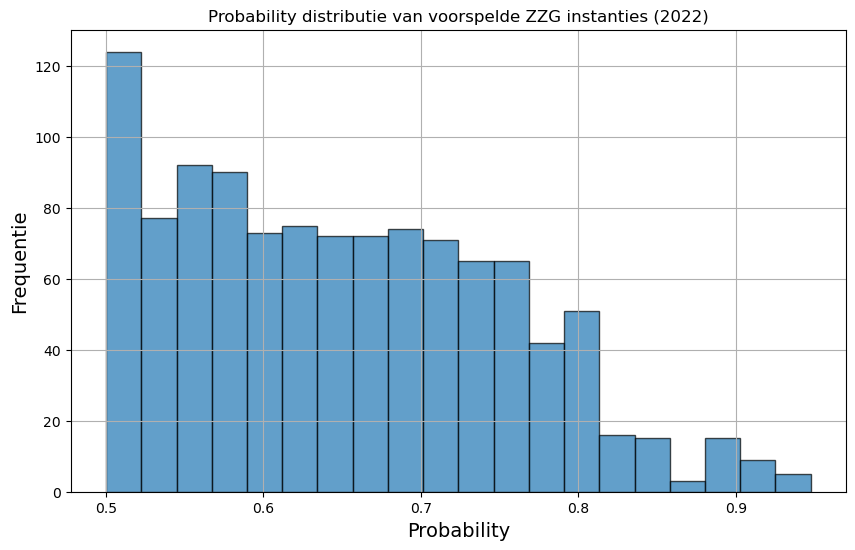

In [39]:

#get the probability estimates for all instances
probabilities = best_rf_classifier_w2v.predict_proba(df_combined2022_final)

#convert the NumPy array to a Pandas DataFrame for easier manipulation
prob_df = pd.DataFrame(probabilities, columns=[f'class_{i}' for i in range(probabilities.shape[1])])

#extract the instances where the prediction is class 1
predicted_class_1_indices = y_predbertrf22_final == 1

#get the probabilities for class 1 for these instances
class_1_probabilities = prob_df.loc[predicted_class_1_indices, 'class_1']

# Plot the distribution of the probabilities
plt.figure(figsize=(10, 6))
plt.hist(class_1_probabilities, bins=20, edgecolor='k', alpha=0.7)
plt.title('Probability distributie van voorspelde ZZG instanties (2022)')
plt.xlabel('Probability',fontsize=14)
plt.ylabel('Frequentie',fontsize=14)
plt.grid(True)
plt.savefig('probability_distribution_2022.png')

plt.show()

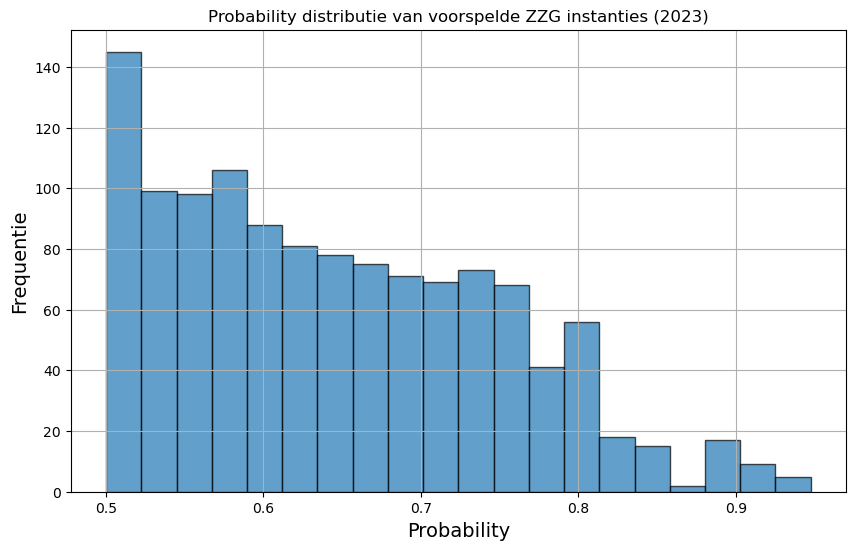

In [40]:

#get the probability estimates for all instances
probabilities = best_rf_classifier_w2v.predict_proba(df_combined2023_final)

#convert the NumPy array to a Pandas DataFrame for easier manipulation
prob_df = pd.DataFrame(probabilities, columns=[f'class_{i}' for i in range(probabilities.shape[1])])

#extract the instances where the prediction is class 1
predicted_class_1_indices = y_predbertrf23_final == 1

#get the probabilities for class 1 for these instances
class_1_probabilities = prob_df.loc[predicted_class_1_indices, 'class_1']

#plot the distribution of the probabilities
plt.figure(figsize=(10, 6))
plt.hist(class_1_probabilities, bins=20, edgecolor='k', alpha=0.7)
plt.title('Probability distributie van voorspelde ZZG instanties (2023)')
plt.xlabel('Probability',fontsize=14)
plt.ylabel('Frequentie',fontsize=14)
plt.grid(True)
plt.savefig('probability_distribution_2023.png')

plt.show()

# Create lists with probabilities

## 2022 data

In [41]:

#get the probability estimates for all instances
probabilities = best_rf_classifier_w2v.predict_proba(df_combined2022_final)

#converting numpy to pandas dataframe
prob_df = pd.DataFrame(probabilities, columns=[f'class_{i}' for i in range(probabilities.shape[1])])

#extract the instances where the prediction is class 1
predicted_class_1_indices = y_predbertrf22_final == 1

#get the probabilities for class1 instances
class_1_probabilities = prob_df.loc[predicted_class_1_indices, 'class_1']

#create a new DataFrame to store the indices and probabilities
results_df = pd.DataFrame({
    'index': prob_df.index[predicted_class_1_indices],
    'probability': class_1_probabilities
})

#merge the probabilities with the original DataFrame 
df_KVK2022_with_probs = df_KVKfinal2022.merge(results_df, left_index=True, right_on='index', how='inner')

#drop index and combined text column
df_KVK2022_with_probs.drop(columns=['index', 'combined_text'], inplace=True)

#sort by probability
df_KVK2022_probs_sorted = df_KVK2022_with_probs.sort_values(by='probability', ascending=False)
df_KVK2022_probs_sorted

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,...,rechtsvorm_21,rechtsvorm_41,rechtsvorm_61,rechtsvorm_70,rechtsvorm_71,rechtsvorm_72,rechtsvorm_74,rechtsvorm_88,rechtsvorm_overig,probability
4365,buurthuus,0,buurthuus,buurthuis,2011,4,14,0,0,0,...,0,0,0,0,1,0,0,0,0,0.947444
2768,buurthuis hornmeer,0,buurthuis hornmeer,buurthuiswerk,2011,1,5,0,0,0,...,0,0,0,0,1,0,0,0,0,0.947444
2864,buurthuis laares,0,buurthuis laares,wijkcommissie,2011,4,14,0,0,0,...,0,0,0,0,0,0,1,0,0,0.947444
2705,aasra,0,aasra,buurt clubhuiswerk samenlevingsopbouwwerk,2011,3,10,0,0,0,...,0,0,0,0,1,0,0,0,0,0.945556
2605,esterade,0,esterade,buurt clubhuiswerk samenlevingsopbouwwerk,2011,4,13,0,0,0,...,0,0,0,0,1,0,0,0,0,0.942222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3079,stichting kindervakantiewerk hoogeloon,0,stichting kindervakantiewerk hoo,sociaalcultureel werk,2011,3,4,0,0,0,...,0,0,0,0,0,0,1,0,0,0.501111
3586,dorpsvereniging westerwijtwerd,3,dorpsvereniging westerwijtwerd,verhuur zalen alsmede cafebedrijf,1991,12,18,0,0,0,...,0,0,0,0,1,0,0,0,0,0.501074
3658,stichting buurthuis vinkenbuurt,0,stichting buurthuis vinkenbuurt,buurthuis tbv diverse buurtverenigingen cq act...,1988,4,22,0,0,0,...,0,0,0,0,0,0,1,0,0,0.500944
2132,doboheem,0,doboheem,scouting,2011,5,9,0,0,0,...,0,0,0,0,1,0,0,0,0,0.500444


# 2023 data

In [45]:

#get the probability estimates for all instances
probabilities = best_rf_classifier_w2v.predict_proba(df_combined2023_final)

#converting numpy to pandas dataframe
prob_df = pd.DataFrame(probabilities, columns=[f'class_{i}' for i in range(probabilities.shape[1])])

#extract the instances where the prediction is class 1
predicted_class_1_indices = y_predbertrf23_final == 1

#get the probabilities for class1 instances
class_1_probabilities = prob_df.loc[predicted_class_1_indices, 'class_1']

#create a new DataFrame to store the indices and probabilities
results_df = pd.DataFrame({
    'index': prob_df.index[predicted_class_1_indices],
    'probability': class_1_probabilities
})

#merge the probabilities with the original DataFrame 
df_KVK2023_with_probs = df_KVKfinal2023.merge(results_df, left_index=True, right_on='index', how='inner')

df_KVK2023_with_probs.drop(columns=['index', 'combined_text'], inplace=True)

#sort by probability
df_KVK2023_probs_sorted = df_KVK2023_with_probs.sort_values(by='probability', ascending=False)
df_KVK2023_probs_sorted

,HN45,W_P_TOTAAL,H_NAAM_VOL,Bedrijfsomschrijving,INSCHR_DAT_JAAR,INSCHR_DAT_MAAND,INSCHR_DAT_DAG,SBI_88102,SBI_88103,SBI_88992,...,rechtsvorm_21,rechtsvorm_41,rechtsvorm_61,rechtsvorm_70,rechtsvorm_71,rechtsvorm_72,rechtsvorm_74,rechtsvorm_88,rechtsvorm_overig,probability
5627,buurthuis laares,0,buurthuis laares,wijkcommissie,2011,4,14,0,0,0,...,0,0,0,0,0,0,1,0,0,0.947444
5309,buurthuis hornmeer,0,buurthuis hornmeer,buurthuiswerk,2011,1,5,0,0,0,...,0,0,0,0,1,0,0,0,0,0.947444
4894,buurthuus,0,buurthuus,buurthuis,2011,4,14,0,0,0,...,0,0,0,0,1,0,0,0,0,0.947444
5175,aasra,0,aasra,buurt clubhuiswerk samenlevingsopbouwwerk,2011,3,10,0,0,0,...,0,0,0,0,1,0,0,0,0,0.945556
5002,esterade,0,esterade,buurt clubhuiswerk samenlevingsopbouwwerk,2011,4,13,0,0,0,...,0,0,0,0,1,0,0,0,0,0.942222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,dorpsvereniging westerwijtwerd,3,dorpsvereniging westerwijtwerd,verhuur zalen alsmede cafebedrijf,1991,12,18,0,0,0,...,0,0,0,0,1,0,0,0,0,0.501074
555,stichting buurthuis vinkenbuurt,0,stichting buurthuis vinkenbuurt,buurthuis tbv diverse buurtverenigingen cq act...,1988,4,22,0,0,0,...,0,0,0,0,0,0,1,0,0,0.500944
1649,doboheem,0,doboheem,scouting,2011,5,9,0,0,0,...,0,0,0,0,1,0,0,0,0,0.500444
6147,stichting scouting riel,0,stichting scouting riel,scouting gebouw,2011,4,11,0,0,0,...,0,0,0,0,0,0,1,0,0,0.500222


In [46]:
df_KVK2022_probs_sorted.to_excel('df_KVK2022_with_probs.xlsx', index=False)
df_KVK2023_probs_sorted.to_excel('df_KVK2023_with_probs.xlsx', index=False)


# Calculate confidence intervals

In [47]:
import numpy as np
from scipy.stats import norm
 
def calculate_confidence_interval(y_pred, confidence_level=0.95):
    total_predictions = len(y_pred)            #total number of predictions
    class_1_predictions = sum(y_pred == 1)     #number of class 1 predictions
    p_hat = class_1_predictions / total_predictions #proportion of class 1 predictions
    standard_error = np.sqrt(p_hat * (1 - p_hat) / total_predictions)
    z_score = norm.ppf(1 - (1 - confidence_level) / 2)
    margin_of_error = z_score * standard_error 
    confidence_interval_proportion = (p_hat - margin_of_error, p_hat + margin_of_error)
 
    #convert the confidence interval for the proportion to a confidence interval for the count
    confidence_interval_count = (
        confidence_interval_proportion[0] * total_predictions,
        confidence_interval_proportion[1] * total_predictions
    )
 
    #print the results
    print(f"Number of class 1 predictions: {class_1_predictions}")
    print(f"Proportion of class 1 predictions: {p_hat}")
    print(f"Standard Error: {standard_error}")
    print(f"{int(confidence_level * 100)}% Confidence Interval for Proportion: {confidence_interval_proportion}")
    print(f"{int(confidence_level * 100)}% Confidence Interval for Count: {confidence_interval_count}")
 
    return {
        "class_1_predictions": class_1_predictions,
        "proportion": p_hat,
        "standard_error": standard_error,
        "confidence_interval_proportion": confidence_interval_proportion,
        "confidence_interval_count": confidence_interval_count
    }
 
results_2022 = calculate_confidence_interval(y_predbertrf22_final, confidence_level=0.95)
results_2023 = calculate_confidence_interval(y_predbertrf23_final, confidence_level=0.95)

Number of class 1 predictions: 1106
Proportion of class 1 predictions: 0.14389799635701275
Standard Error: 0.004003500988725393
95% Confidence Interval for Proportion: (0.13605127860704047, 0.15174471410698503)
95% Confidence Interval for Count: (1045.690127373713, 1166.309872626287)
Number of class 1 predictions: 1214
Proportion of class 1 predictions: 0.10961625282167042
Standard Error: 0.002968617343738422
95% Confidence Interval for Proportion: (0.10379786974406216, 0.11543463589927869)
95% Confidence Interval for Count: (1149.5614074154885, 1278.4385925845115)
